In [1]:
from functions_for_all_nutrients import *
from iron_hemoglobin_functions import *

In [2]:
location_ids = [179,
 163,
 214,
 161,
 165,
 190,
 189,
 196,
 201,
 180,
 15,
 164,
 20,
 202,
 205,
 171,
 11,
 184,
 168,
 6,
 141,
 207,
 181,
 213,
 522]

# Impact

In [3]:
folic_acid_total_dalys = pd.read_pickle('results_raw/folic_acid_dalys')

In [4]:
folic_acid = pd.read_pickle('results_raw/folic_acid_waterfall_salt.pkl')
folic_acid['nutrient'] = 'folic acid'

In [5]:
iron_bw_250 = pd.read_csv('results_raw/iron_bw_results.csv')
    # read in zero fortification results for wheat flour and maize
iron_bw_250_zero = pd.read_csv('results_raw/iron_bw_results_zero_2021_04_14.csv')
iron_bw_250_zero['coverage_level'] = 1
    # duplicate zero wheat flour for zero industry wheat flour because they are the same data
iron_bw_250_zero = pd.read_csv('results_raw/iron_bw_results_zero_2021_04_14.csv')
iron_bw_250_zero['coverage_level'] = 1
iron_bw_250_zero_wheat = iron_bw_250_zero.loc[iron_bw_250_zero.vehicle=='zero wheat flour']
iron_bw_250_zero_wheat['vehicle'] = 'zero industry wheat'
iron_bw_250_zero = pd.concat([iron_bw_250_zero, iron_bw_250_zero_wheat], ignore_index=True, sort=True)

    # read in industry wheat flour data
iron_bw_250_wheat = pd.read_csv('results_raw/iron_bw_results_industry_wheat_2021_04_15.csv')
iron_bw_250 = pd.concat([iron_bw_250, 
                         iron_bw_250_wheat,
                         iron_bw_250_zero], ignore_index=True, sort=True)

iron_bw_250 = iron_bw_250.set_index(['location_id', 'measure', 'vehicle','coverage_level']).stack().reset_index()

iron_bw_1000 = (pd.concat([iron_bw_250, iron_bw_250, iron_bw_250, iron_bw_250], ignore_index=True)
                .rename(columns={'level_4':'draw',0:'value'})
                .set_index(['location_id','measure','vehicle','coverage_level'])
                .sort_index())
draws = []
for i in list(range(0,1000)):
    draws.append(f'draw_{i}')
iron_bw_1000['draw'] = draws * int(len(iron_bw_1000) / 1000)
iron_bw_1000 = iron_bw_1000.reset_index()
iron_bw_1000 = iron_bw_1000.pivot_table(index=['location_id', 'measure', 'vehicle','coverage_level'],
                                       columns='draw', values='value').reset_index()
iron_bw_1000['year'] = 2025
iron_bw_1000['nutrient'] = 'iron'

iron_bw_1000 = (iron_bw_1000.set_index(['location_id', 'vehicle', 'coverage_level', 'year', 'measure'])
               .drop(columns='nutrient')
                .sort_index())

iron_bw_1000.head()

draw                                                                draw_0  \
location_id vehicle        coverage_level year measure                       
6           industry wheat 0.2            2025 counts_averted  5272.011695   
                                               pif                0.177321   
                                               rates_averted      6.847575   
                           0.5            2025 counts_averted  6439.973114   
                                               pif                0.216605   

draw                                                                draw_1  \
location_id vehicle        coverage_level year measure                       
6           industry wheat 0.2            2025 counts_averted  1883.106801   
                                               pif                0.061071   
                                               rates_averted      2.439305   
                           0.5            2025 counts_averted  2293.029855   
                                               pif                0.074365   

draw                                                               draw_10  \
location_id vehicle        coverage_level year measure                       
6           industry wheat 0.2            2025 counts_averted  2225.781747   
                                               pif                0.082930   
                                               rates_averted      2.639266   
                           0.5            2025 counts_averted  2763.342705   
                                               pif                0.102959   

draw                                                              draw_100  \
location_id vehicle        coverage_level year measure                       
6           industry wheat 0.2            2025 counts_averted  4091.632163   
                                               pif                0.131400   
                                               rates_averted      5.659770   
                           0.5            2025 counts_averted  4925.127693   
                                               pif                0.158168   

draw                                                              draw_101  \
location_id vehicle        coverage_level year measure                       
6           industry wheat 0.2            2025 counts_averted  2280.219734   
                                               pif                0.072219   
                                               rates_averted      2.736006   
                           0.5            2025 counts_averted  2832.952811   
                                               pif                0.089725   

draw                                                              draw_102  \
location_id vehicle        coverage_level year measure                       
6           industry wheat 0.2            2025 counts_averted  5065.137185   
                                               pif                0.166774   
                                               rates_averted      5.979867   
                           0.5            2025 counts_averted  6235.049115   
                                               pif                0.205294   

draw                                                              draw_103  \
location_id vehicle        coverage_level year measure                       
6           industry wheat 0.2            2025 counts_averted  3134.381818   
                                               pif                0.106181   
                                               rates_averted      4.268250   
                           0.5            2025 counts_averted  3922.999312   
                                               pif                0.132897   

draw                                                              draw_104  \
location_id vehicle        coverage_level year measure                       
6           ind

In [6]:
iron_u5 = pd.read_pickle('results_raw/iron_u5.pkl')
iron_wra = pd.read_pickle('results_raw/iron_wra.pkl')
iron = (iron_u5.set_index([c for c in iron_u5.columns if 'draw' not in c])
        + iron_wra.set_index([c for c in iron_u5.columns if 'draw' not in c])).reset_index()
iron = iron.loc[iron.vehicle!='industry wheat'].loc[iron.vehicle!='zero industry wheat']
iron_u5_industry = pd.read_pickle('results_raw/iron_u5_industry_wheat_update.pkl')
iron_wra_industry = pd.read_pickle('results_raw/iron_wra_industry_wheat_update.pkl')
iron_industry = (iron_u5_industry.set_index([c for c in iron_u5_industry.columns if 'draw' not in c])
        + iron_wra_industry.set_index([c for c in iron_u5_industry.columns if 'draw' not in c])).reset_index()
iron = (pd.concat([iron, iron_industry], ignore_index=True)
        .set_index(['location_id','vehicle','coverage_level','year','measure'])
        .sort_index())#.reset_index()

iron = (iron + iron_bw_1000).reset_index()
#iron = iron_bw_1000.reset_index()
iron['nutrient'] = 'iron'
iron.head()

draw,location_id,vehicle,coverage_level,year,measure,draw_0,draw_1,draw_10,draw_100,draw_101,...,draw_991,draw_992,draw_993,draw_994,draw_995,draw_996,draw_997,draw_998,draw_999,nutrient
0,6,industry wheat,0.2,2025,counts_averted,51673.405251,19549.226666,19043.571603,19450.892758,44994.207940,...,27339.289394,69389.515578,60546.456023,18629.879044,29792.368807,49206.056819,21380.520946,23394.936407,25758.534147,iron
1,6,industry wheat,0.2,2025,pif,7.797253,2.859420,4.034359,2.580310,8.345024,...,4.010431,8.699419,10.177575,2.638738,5.417385,16.020701,3.575546,4.841922,4.183111,iron
2,6,industry wheat,0.2,2025,rates_averted,21.448323,7.769530,7.796872,10.588757,15.771744,...,11.222390,23.807823,21.799292,8.782698,11.505288,16.822807,9.197649,8.921448,11.349719,iron
3,6,industry wheat,0.5,2025,counts_averted,118393.738512,45908.191122,44203.175877,42903.608041,106488.767966,...,62958.761284,162792.582202,142365.544931,41844.667447,70875.962340,116341.532509,49895.463751,55194.641743,59581.843232,iron
4,6,industry wheat,0.5,2025,pif,18.620829,6.983733,9.840817,6.215665,20.170992,...,9.715831,20.813438,24.391102,6.401204,13.184737,38.668411,8.749146,11.829280,10.182059,iron


In [7]:
# exclude old industry wheat flour results
iron_u5 = pd.read_pickle('results_raw/iron_u5.pkl')
iron_u5['nutrient'] = 'iron'
iron_wra = pd.read_pickle('results_raw/iron_wra.pkl')
iron_wra['nutrient'] = 'iron'
iron_no_bw = (iron_u5.set_index([c for c in iron_u5.columns if 'draw' not in c])
        + iron_wra.set_index([c for c in iron_u5.columns if 'draw' not in c])).reset_index()
iron_no_bw = iron_no_bw.loc[iron_no_bw.vehicle!='industry wheat'].loc[iron_no_bw.vehicle!='zero industry wheat']

# read in new industry wheat results
iron_u5_industry = pd.read_pickle('results_raw/iron_u5_industry_wheat_update.pkl')
iron_u5_industry['nutrient'] = 'iron'
iron_wra_industry = pd.read_pickle('results_raw/iron_wra_industry_wheat_update.pkl')
iron_wra_industry['nutrient'] = 'iron'
iron_industry = (iron_u5_industry.set_index([c for c in iron_u5_industry.columns if 'draw' not in c])
        + iron_wra_industry.set_index([c for c in iron_u5_industry.columns if 'draw' not in c])).reset_index()

iron_no_bw = pd.concat([iron_no_bw, iron_industry], ignore_index=True, sort=True)
iron_no_bw['nutrient'] = 'iron'
iron_no_bw.head()

draw,coverage_level,draw_0,draw_1,draw_10,draw_100,draw_101,draw_102,draw_103,draw_104,draw_105,...,draw_995,draw_996,draw_997,draw_998,draw_999,location_id,measure,nutrient,vehicle,year
0,0.2,7.637104,2.594938,4.244068,2.600310,9.917857,7.415747,1.359985,9.339937,2.098922,...,5.995712,19.516659,3.225155,5.609841,4.508586,6,pif,iron,wheat flour,2025
1,0.5,18.444249,6.412946,10.447877,6.427747,23.931951,17.973933,3.378713,22.596008,5.196005,...,14.621292,46.863803,7.979410,13.760003,11.118319,6,pif,iron,wheat flour,2025
2,0.8,28.518511,10.143435,16.462191,10.169190,36.971948,27.888751,5.372214,34.994941,8.232532,...,22.823962,72.057968,12.635163,21.603147,17.548336,6,pif,iron,wheat flour,2025
3,1.0,34.851665,12.582768,20.369321,12.616610,45.156683,34.160031,6.687347,42.810254,10.223791,...,28.067523,87.742360,15.685192,26.667029,21.737397,6,pif,iron,wheat flour,2025
4,0.2,-1.054964,-0.352196,-0.577747,-0.352869,-1.371197,-1.021647,-0.183859,-1.288579,-0.284504,...,-0.822127,-2.709054,-0.437354,-0.765872,-0.612949,6,pif,iron,zero wheat flour,2025


In [8]:
pop_u5 = (get_population(location_id=location_ids,
                     year_id=2019,
                     sex_id=[1,2],
                     age_group_id=[2,3,4,5],
                     gbd_round_id=6,
                     decomp_step='step4')
       .groupby('location_id')
       .sum()
       .filter(['population']))
pop_wra = (get_population(location_id=location_ids,
                     year_id=2019,
                     sex_id=2,
                     age_group_id=list(range(7,16)),
                     gbd_round_id=6,
                     decomp_step='step4')
       .groupby('location_id')
       .sum()
       .filter(['population']))
pop_tot = pop_u5 + pop_wra
frac_u5 = pop_u5 / pop_tot
frac_wra = pop_wra / pop_tot

# population weight rates
index_cols = ['location_id','vehicle','coverage_level','year','measure','nutrient']

iron_u5_rate = (pd.concat([(iron_u5.loc[iron_u5.measure=='rates_averted']
                .loc[iron_u5.vehicle!='industry wheat']
                .loc[iron_u5.vehicle!='zero industry wheat']),
                           iron_u5_industry.loc[iron_u5_industry.measure=='rates_averted']], ignore_index=True))
iron_bw_rate = iron_bw_1000.reset_index().loc[iron_bw_1000.reset_index().measure=='rates_averted']
iron_bw_rate['nutrient'] = 'iron'
iron_wra_rate = pd.concat([(iron_wra.loc[iron_wra.measure=='rates_averted']
                .loc[iron_wra.vehicle!='industry wheat']
                .loc[iron_wra.vehicle!='zero industry wheat']),
                           iron_wra_industry.loc[iron_wra_industry.measure=='rates_averted']], ignore_index=True)

iron_u5_bw_rate = (iron_u5_rate.set_index(index_cols) + iron_bw_rate.set_index(index_cols)).reset_index()
iron_u5_bw_rate = iron_u5_bw_rate.merge(frac_u5, on='location_id')
iron_wra_rate = iron_wra_rate.merge(frac_wra, on='location_id')

for i in list(range(0,1000)):
    iron_u5_bw_rate[f'draw_{i}'] = iron_u5_bw_rate[f'draw_{i}'] * iron_u5_bw_rate['population']
    iron_wra_rate[f'draw_{i}'] = iron_wra_rate[f'draw_{i}'] * iron_wra_rate['population']
    
iron_weighted_rate = (iron_u5_bw_rate.drop(columns='population').set_index(index_cols)
                     + iron_wra_rate.drop(columns='population').set_index(index_cols))

# weighted PIFs
    # do not include BW results here
wra_ira_dalys = pd.read_pickle('results_raw/wra_ira_dalys.pkl')
wra_maternal_dalys = pd.read_pickle('results_raw/iron_maternal_dalys.pkl')
u5_iron_dalys = pd.read_pickle('results_raw/u5_ira_dalys.pkl')
tot_iron_dalys = wra_ira_dalys + wra_maternal_dalys + u5_iron_dalys

iron_u5_counts = (pd.concat([(iron_u5.loc[iron_u5.measure=='counts_averted']
                .loc[iron_u5.vehicle!='industry wheat']
                .loc[iron_u5.vehicle!='zero industry wheat']),
                           iron_u5_industry.loc[iron_u5_industry.measure=='counts_averted']], ignore_index=True)
                  .set_index(index_cols))
iron_bw_1000['nutrient'] = 'iron'
iron_bw_counts = iron_bw_1000.reset_index().loc[iron_bw_1000.reset_index().measure=='counts_averted'].set_index(index_cols)
iron_wra_counts = (pd.concat([(iron_wra.loc[iron_wra.measure=='counts_averted']
                .loc[iron_wra.vehicle!='industry wheat']
                .loc[iron_wra.vehicle!='zero industry wheat']),
                           iron_wra_industry.loc[iron_wra_industry.measure=='counts_averted']], 
                             ignore_index=True).set_index(index_cols))

tot_iron_counts = iron_u5_counts + iron_bw_counts + iron_wra_counts

# currently excluding birth weight DALYs averted from PIF calculations
tot_iron_pifs = ((iron_u5_counts + iron_wra_counts) / tot_iron_dalys * 100).reset_index()
#tot_iron_pifs = (tot_iron_counts / tot_iron_dalys * 100).reset_index()
tot_iron_pifs['measure'] = 'pif'
tot_iron_pifs = tot_iron_pifs.set_index(index_cols)

iron = pd.concat([tot_iron_pifs,
                 iron_weighted_rate,
                 tot_iron_counts], sort=True).reset_index()
iron.head()

draw,location_id,vehicle,coverage_level,year,measure,nutrient,draw_0,draw_1,draw_10,draw_100,...,draw_990,draw_991,draw_992,draw_993,draw_994,draw_995,draw_996,draw_997,draw_998,draw_999
0,6,wheat flour,0.2,2025,pif,iron,4.273098,1.499674,2.367924,1.497847,...,2.838944,2.561471,5.642691,6.232544,1.285229,3.306057,10.801740,1.761949,3.128894,2.425758
1,6,wheat flour,0.5,2025,pif,iron,10.308970,3.705875,5.828385,3.701164,...,6.970467,6.271554,13.544243,14.946608,3.183730,8.055105,25.922790,4.358246,7.678418,5.980710
2,6,wheat flour,0.8,2025,pif,iron,15.922219,5.861079,9.181991,5.853308,...,10.954042,9.828430,20.813029,22.948970,5.047528,12.562863,39.831309,6.899512,12.060474,9.437411
3,6,wheat flour,1.0,2025,pif,iron,19.443430,7.270084,11.359919,7.260175,...,13.529928,12.117470,25.329969,27.915111,6.271058,15.439779,48.475319,8.563621,14.891592,11.688488
4,6,zero wheat flour,0.2,2025,pif,iron,-0.590727,-0.203554,-0.322380,-0.203319,...,-0.387228,-0.350159,-0.783150,-0.865566,-0.174123,-0.453624,-1.499857,-0.238975,-0.426995,-0.329838


In [9]:
vehicles = ['zero maize flour', 'maize flour', 'zero industry wheat',
       'industry wheat', 'zero wheat flour', 'wheat flour',
       'zero industry salt', 'industry salt', 'zero salt', 'salt',
           'oil','industry oil','zero oil','zero industry oil']

In [10]:
vitamin_a_no_oil = pd.read_pickle('results_raw/vitamin_a.pkl')
vitamin_a_no_oil = vitamin_a_no_oil.loc[vitamin_a_no_oil.vehicle.isin([v for v in vehicles if 'oil' not in v])]
vitamin_a_oil = pd.read_pickle('results_raw/vitamin_a_oil_update.pkl')
vitamin_a = pd.concat([vitamin_a_no_oil, vitamin_a_oil], ignore_index=True)
vitamin_a['nutrient'] = 'vitamin a'
vitamin_a.head()

draws,location_id,year,vehicle,coverage_level,draw_0,draw_1,draw_10,draw_100,draw_101,draw_102,...,draw_992,draw_993,draw_994,draw_995,draw_996,draw_997,draw_998,draw_999,measure,nutrient
0,6,2021,industry wheat,0.2,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,pif,vitamin a
1,6,2021,industry wheat,0.5,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,pif,vitamin a
2,6,2021,industry wheat,0.8,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,pif,vitamin a
3,6,2021,industry wheat,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,pif,vitamin a
4,6,2021,wheat flour,0.2,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,pif,vitamin a


In [11]:
zinc = pd.read_pickle('results_raw/zinc.pkl')
zinc['nutrient'] = 'zinc'
zinc_prev = pd.read_pickle('results_raw/zinc_deficiency_exposure.pkl')
zinc_prev['measure'] = 'deficiency_exposure'

#vitamin_a = pd.read_pickle('results_raw/vitamin_a.pkl')
#vitamin_a['nutrient'] = 'vitamin a'
#vitamin_a_prev = pd.read_pickle('results_raw/vitamin_a_deficiency_exposure.pkl')
#vitamin_a_prev['measure'] = 'deficiency_exposure'

results = pd.concat([folic_acid.rename(columns={'year_id':'year'}), zinc, vitamin_a,
                     iron, 
                     #vitamin_a_prev, 
                     zinc_prev], ignore_index=True, sort=True)
results['nutrient'] = results.nutrient.str.replace('vitamin a','vitamin A')
results['nutrient_name'] = results.nutrient.str.replace('_',' ').str.capitalize().str.replace('Vitamin a', 'Vitamin A')
l = get_ids('location')[['location_name','location_id']]
results = results.merge(l, on='location_id')
results['label'] = results.nutrient_name + ' in ' + results.vehicle
results = results.loc[results.year==2025]

# exclude ID 11 and wheat flour
#results = results.loc[(results.location_id!=11 & results.vehicle != 'wheat flour')]
results_sub = results.loc[results.location_id != 11]
results_sub2 = results.loc[results.location_id == 11].loc[results.vehicle!='wheat flour'].loc[results.vehicle!='zero wheat flour']
results = pd.concat([results_sub, results_sub2], ignore_index=True).drop(columns='index')
results.head()

,coverage_level,draw_0,draw_1,draw_10,draw_100,draw_101,draw_102,draw_103,draw_104,draw_105,...,draw_998,draw_999,location_id,measure,nutrient,vehicle,year,nutrient_name,location_name,label
0,0.2,-0.000046,-0.000056,-0.000129,-0.000119,-0.000066,-0.000034,-0.000017,-0.000036,-0.000145,...,-0.000068,-0.000087,141,rates_averted,folic acid,zero maize flour,2025,Folic acid,Egypt,Folic acid in zero maize flour
1,0.5,-0.000114,-0.000141,-0.000322,-0.000298,-0.000164,-0.000086,-0.000044,-0.000091,-0.000363,...,-0.000171,-0.000218,141,rates_averted,folic acid,zero maize flour,2025,Folic acid,Egypt,Folic acid in zero maize flour
2,0.8,-0.000183,-0.000225,-0.000515,-0.000476,-0.000262,-0.000137,-0.000070,-0.000145,-0.000580,...,-0.000273,-0.000349,141,rates_averted,folic acid,zero maize flour,2025,Folic acid,Egypt,Folic acid in zero maize flour
3,1.0,-0.000228,-0.000281,-0.000644,-0.000595,-0.000328,-0.000171,-0.000087,-0.000181,-0.000726,...,-0.000341,-0.000437,141,rates_averted,folic acid,zero maize flour,2025,Folic acid,Egypt,Folic acid in zero maize flour
4,0.2,-0.000020,-0.000012,-0.000017,-0.000024,-0.000034,-0.000013,-0.000006,-0.000013,-0.000026,...,-0.000014,-0.000018,141,pif,folic acid,zero maize flour,2025,Folic acid,Egypt,Folic acid in zero maize flour


In [77]:
results.loc[results.measure=='rates_averted'].loc[results.location_id==214].loc[results.vehicle=='oil']

,coverage_level,draw_0,draw_1,draw_10,draw_100,draw_101,draw_102,draw_103,draw_104,draw_105,...,draw_998,draw_999,location_id,measure,nutrient,vehicle,year,nutrient_name,location_name,label
6420,0.2,22.838941,22.809432,7.634222,13.111314,5.173753,7.812252,1.694063,17.340067,12.217320,...,9.917368,4.034344,214,rates_averted,vitamin A,oil,2025,Vitamin A,Nigeria,Vitamin A in oil
6421,0.5,57.097353,57.023581,19.085556,32.778285,12.934382,19.530630,4.235159,43.350167,30.543300,...,24.793419,10.085860,214,rates_averted,vitamin A,oil,2025,Vitamin A,Nigeria,Vitamin A in oil
6422,0.8,91.355764,91.237730,30.536890,52.445257,20.695011,31.249008,6.776254,69.360267,48.869279,...,39.669470,16.137376,214,rates_averted,vitamin A,oil,2025,Vitamin A,Nigeria,Vitamin A in oil
6423,1.0,114.194706,114.047162,38.171112,65.556571,25.868764,39.061260,8.470317,86.700334,61.086599,...,49.586838,20.171720,214,rates_averted,vitamin A,oil,2025,Vitamin A,Nigeria,Vitamin A in oil


# Summary impact results

In [12]:
# table of DALYs averted by vehicle and nutrient across all locations
total = results.loc[results.measure=='counts_averted'].loc[results.coverage_level==0.8].groupby(['vehicle','nutrient']).sum().drop(columns=['coverage_level','year'])
total_all_nutrients = total.groupby(['vehicle']).sum()
total_all_nutrients['nutrient'] = 'all'
total = pd.concat([total.reset_index(), total_all_nutrients.reset_index()], ignore_index=True, sort=True)
total['location_id'] = 1
total['location_name'] = 'All modeled locations'
total.head()

,draw_0,draw_1,draw_10,draw_100,draw_101,draw_102,draw_103,draw_104,draw_105,draw_106,...,draw_994,draw_995,draw_996,draw_997,draw_998,draw_999,location_id,nutrient,vehicle,location_name
0,5.212741e+05,3.563559e+05,1.720688e+05,2.412287e+05,1.422191e+05,1.796255e+05,36931.944151,3.967371e+05,212666.065215,4.461640e+05,...,2.623787e+05,2.209395e+05,2.250535e+05,1.999561e+05,1.643129e+05,1.005002e+05,1,vitamin A,industry oil,All modeled locations
1,1.379019e+06,1.183858e+06,1.025760e+06,1.246160e+06,1.182240e+06,1.201573e+06,735302.806224,1.243034e+06,940563.382008,1.258343e+06,...,1.082731e+06,1.706250e+06,1.467648e+06,1.618999e+06,1.330095e+06,1.659233e+06,1,folic acid,industry salt,All modeled locations
2,3.942727e+05,4.022127e+05,2.959932e+05,3.287925e+05,4.188338e+05,4.257318e+05,222459.948473,3.612784e+05,277657.526541,4.378705e+05,...,3.716446e+05,4.458447e+05,4.820759e+05,5.459516e+05,4.877168e+05,4.828778e+05,1,folic acid,industry wheat,All modeled locations
3,1.777811e+06,8.896934e+05,7.577332e+05,7.005832e+05,1.233324e+06,1.572423e+06,318493.328390,1.405236e+06,761951.562859,2.018555e+06,...,7.945577e+05,1.023624e+06,1.403468e+06,8.089054e+05,7.183651e+05,7.308169e+05,1,iron,industry wheat,All modeled locations
4,2.522997e+05,1.957413e+05,8.392843e+04,1.320693e+05,6.451529e+04,8.693609e+04,16785.796491,2.017577e+05,104615.780504,2.377200e+05,...,1.446368e+05,1.226168e+05,1.158728e+05,9.732595e+04,8.209473e+04,4.959873e+04,1,vitamin A,industry wheat,All modeled locations


In [13]:
# table of DALYs averted by vehicle and nutrient across all locations
nei_sum = (results.loc[results.measure=='counts_averted']
         .loc[results.location_id.isin([214,163,179])]
         .loc[results.coverage_level==0.8].groupby(['vehicle','nutrient']).sum()
         .drop(columns=['coverage_level','year']))
nei_sum_all_nutrients = nei_sum.groupby(['vehicle']).sum()
nei_sum_all_nutrients['nutrient'] = 'all'
nei_sum = pd.concat([nei_sum.reset_index(), nei_sum_all_nutrients.reset_index()], ignore_index=True, sort=True)
nei_sum['location_id'] = 2
nei_sum['location_name'] = 'Nigeria, Ethiopia, and India combined'
nei_sum.head()

,draw_0,draw_1,draw_10,draw_100,draw_101,draw_102,draw_103,draw_104,draw_105,draw_106,...,draw_994,draw_995,draw_996,draw_997,draw_998,draw_999,location_id,nutrient,vehicle,location_name
0,257442.284232,213439.742003,84979.777077,124945.013156,81057.241695,97796.532873,21786.553343,195456.569379,121234.258852,2.552842e+05,...,143974.760932,113669.054426,107942.895206,120626.305882,86032.170067,52764.532928,2,vitamin A,industry oil,"Nigeria, Ethiopia, and India combined"
1,563487.446035,578621.699763,438635.139114,571931.836202,556667.443868,581312.889449,344131.845081,531588.409272,432222.428534,5.953277e+05,...,559773.113425,842053.124615,732245.598873,792481.045060,682077.286093,777831.789197,2,folic acid,industry salt,"Nigeria, Ethiopia, and India combined"
2,156161.964814,218640.084231,133540.290196,136062.065564,177694.952451,236482.241233,103009.696420,165841.695024,138018.726696,2.521474e+05,...,220089.912290,240684.019219,259578.085748,335385.070070,300385.659275,250575.732230,2,folic acid,industry wheat,"Nigeria, Ethiopia, and India combined"
3,699377.653131,469106.655458,361950.628746,326180.921782,539642.500373,875864.165880,149382.019893,617853.090013,384661.992180,1.126991e+06,...,386056.622155,458151.878632,614737.495857,419300.460156,303088.272129,329496.866961,2,iron,industry wheat,"Nigeria, Ethiopia, and India combined"
4,115813.755695,98812.625800,32869.465378,58980.087408,30356.699421,43143.992371,7951.423997,84490.617434,49580.542058,1.099658e+05,...,57515.376244,57003.641666,55626.762921,48411.963061,35258.567189,22749.813159,2,vitamin A,industry wheat,"Nigeria, Ethiopia, and India combined"


In [14]:
# summary table that shows DALYs averted (counts) by location, vehicle, and nutrient (including 'all' nutrients)
rsum = (results.loc[results.coverage_level==0.8]
        .loc[results.measure=='counts_averted']
        .drop(columns=['coverage_level','measure','year','nutrient_name','label']))
rsum_tot = rsum.groupby(['location_id','location_name','vehicle']).sum().reset_index()
rsum_tot['nutrient'] = 'all'
rsum = pd.concat([rsum, rsum_tot, total, nei_sum], ignore_index=True, sort=True)
rsum = (rsum.set_index([c for c in rsum.columns if 'draw' not in c])
        .apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1)
        .filter(['mean','2.5%','97.5%'])
        .rename(columns={'2.5%':'lower','97.5%':'upper','mean':'mean_val'})
        .reset_index())
for col in ['mean_val','lower','upper']:
    rsum[f'{col}'] = rsum[f'{col}'].map('{:,.0f}'.format)
rsum['value'] = (rsum['mean_val'].astype(str)
                                        +' ('
                                        +rsum['lower'].astype(str)
                                        +', '
                                        +rsum['upper'].astype(str)
                                        +')')

rsum['nutrient'] = rsum.nutrient.str.capitalize()
rsum['nutrient'] = rsum.nutrient.str.replace('Vitamin a','Vitamin A')
rsum = (rsum.pivot_table(index=['location_name','vehicle'], 
                         columns=['nutrient'], 
                         values='value', 
                         aggfunc=lambda x: ' '.join(x))
        .replace(np.nan, 'Not modeled')
        .reset_index())
rsum['order'] = np.where(rsum.vehicle=='wheat flour', 1, np.where(rsum.vehicle=='maize flour', 2, np.where(rsum.vehicle=='oil', 4, 3)))
rsum = (rsum.sort_values(by=['location_name','order']).drop(columns='order')
        .rename(columns={'location_name':'Location','vehicle':'Vehicle'})
        .reset_index().drop(columns='index'))
rsum.to_csv('results_plots/dalys_averted_summary_table.csv')
rsum.head()

nutrient,Location,Vehicle,All,Folic acid,Iron,Vitamin A,Zinc
0,All modeled locations,wheat flour,"1,160,718 (340,022, 1,881,052)","343,260 (200,149, 551,231)","688,286 (104,394, 1,250,377)","108,862 (-8,731, 259,074)","20,310 (3,680, 52,963)"
1,All modeled locations,maize flour,"326,894 (100,926, 550,511)","103,864 (61,208, 169,160)","175,599 (28,472, 319,326)","43,316 (-3,011, 102,875)","4,115 (537, 11,664)"
2,All modeled locations,industry oil,"284,311 (-15,980, 662,723)",Not modeled,Not modeled,"284,311 (-15,980, 662,723)",Not modeled
3,All modeled locations,industry salt,"1,314,288 (836,715, 1,991,277)","1,314,288 (836,715, 1,991,277)",Not modeled,Not modeled,Not modeled
4,All modeled locations,industry wheat,"1,702,163 (478,710, 2,833,834)","427,103 (252,368, 721,200)","1,108,930 (157,425, 2,080,075)","138,949 (-8,541, 320,489)","27,180 (5,875, 66,615)"


In [15]:
# table of DALYs averted by vehicle and nutrient across all locations
total_by_cov = results.loc[results.measure=='counts_averted'].groupby(['vehicle','nutrient','coverage_level']).sum().drop(columns=['year']).reset_index()
total_by_cov = (total_by_cov.set_index([c for c in total_by_cov.columns if 'draw' not in c])
        .apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1)
        .filter(['mean','2.5%','97.5%'])
        .rename(columns={'2.5%':'lower','97.5%':'upper','mean':'value'})
        .reset_index()
               .drop(columns='location_id'))
total_by_cov.head()

,vehicle,nutrient,coverage_level,value,lower,upper
0,industry oil,vitamin A,0.2,71077.639158,-3994.948592,165680.696005
1,industry oil,vitamin A,0.5,177694.097894,-9987.371481,414201.740012
2,industry oil,vitamin A,0.8,284310.556630,-15979.794370,662722.784019
3,industry oil,vitamin A,1.0,355388.195788,-19974.742962,828403.480024
4,industry salt,folic acid,0.2,328571.901294,209178.710728,497819.189445


In [16]:
# table of DALYs averted by vehicle and nutrient across all locations
nei_by_cov = (results.loc[results.measure=='counts_averted']
                .loc[results.location_id.isin([214,179,163])]
                .groupby(['vehicle','nutrient','coverage_level']).sum()
                .drop(columns=['year']).reset_index())
nei_by_cov = (nei_by_cov.set_index([c for c in nei_by_cov.columns if 'draw' not in c])
        .apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1)
        .filter(['mean','2.5%','97.5%'])
        .rename(columns={'2.5%':'lower','97.5%':'upper','mean':'value'})
        .reset_index()
               .drop(columns='location_id'))
nei_by_cov.head()

,vehicle,nutrient,coverage_level,value,lower,upper
0,industry oil,vitamin A,0.2,36338.576509,-2015.696890,85542.416512
1,industry oil,vitamin A,0.5,90846.441272,-5039.242225,213856.041280
2,industry oil,vitamin A,0.8,145354.306035,-8062.787560,342169.666048
3,industry oil,vitamin A,1.0,181692.882544,-10078.484450,427712.082560
4,industry salt,folic acid,0.2,163990.689573,98709.081414,269584.421128


In [17]:
def dalys_averted_by_vehicle_and_nutrient_global_stacked_bar(data, vehicle, ylim, x, y, nei=False):
    f, ax = plt.subplots(dpi=120)
    alt_data = data.loc[data['vehicle']==vehicle]
    alt_data['value'] = alt_data['value'] / 1_000_000

    alt_20 = alt_data.loc[alt_data.coverage_level==0.2]
    alt_50 = alt_data.loc[alt_data.coverage_level==0.5]
    alt_80 = alt_data.loc[alt_data.coverage_level==0.8]
    barWidth = 0.20
    spacerWidth = barWidth / 10
    b = np.arange(1)
    c = [x + barWidth + spacerWidth for x in b]
    d = [x + barWidth + spacerWidth for x in c]
    if vehicle=='salt':
        plt.bar(b, alt_20['value'], width=barWidth, color='tab:green')
        plt.bar(c, alt_50['value'], width=barWidth, color='tab:green')
        plt.bar(d, alt_80['value'], width=barWidth, color='tab:green')
    
    else:
        plt.bar(b, alt_20.loc[alt_20.nutrient=='vitamin A']['value'], 
                width=barWidth, 
                color = 'tab:blue',
               label='Vitamin A')
        plt.bar(b, alt_20.loc[alt_20.nutrient=='zinc']['value'], 
                width=barWidth, 
                bottom = alt_20.loc[alt_20.nutrient=='vitamin A']['value'],
                color= 'tab:orange',
               label='Zinc')
        plt.bar(b, alt_20.loc[alt_20.nutrient=='folic acid']['value'], 
                width=barWidth, 
                color='tab:green',
                label='Folic Acid',
                bottom = alt_20.loc[alt_20.nutrient=='zinc']['value'].values + alt_20.loc[alt_20.nutrient=='vitamin A']['value'].values)
        plt.bar(b, alt_20.loc[alt_20.nutrient=='iron']['value'], 
                width=barWidth, 
                color='tab:red',
                label='Iron',
                bottom = (alt_20.loc[alt_20.nutrient=='folic acid']['value'].values 
                 + alt_20.loc[alt_20.nutrient=='vitamin A']['value'].values 
                 + alt_20.loc[alt_20.nutrient=='zinc']['value'].values))


        plt.bar(c, alt_50.loc[alt_50.nutrient=='vitamin A']['value'], 
                width=barWidth, 
                color = 'tab:blue')
        plt.bar(c, alt_50.loc[alt_50.nutrient=='zinc']['value'], 
                width=barWidth, 
                bottom = alt_50.loc[alt_50.nutrient=='vitamin A']['value'],
                color= 'tab:orange')
        plt.bar(c, alt_50.loc[alt_50.nutrient=='folic acid']['value'], 
                width=barWidth, 
                color='tab:green',
                bottom = alt_50.loc[alt_50.nutrient=='zinc']['value'].values + alt_50.loc[alt_50.nutrient=='vitamin A']['value'].values)
        plt.bar(c, alt_50.loc[alt_50.nutrient=='iron']['value'], 
                width=barWidth, 
                color='tab:red',
                bottom = (alt_50.loc[alt_50.nutrient=='folic acid']['value'].values 
                 + alt_50.loc[alt_50.nutrient=='vitamin A']['value'].values 
                 + alt_50.loc[alt_50.nutrient=='zinc']['value'].values))


        plt.bar(d, alt_80.loc[alt_80.nutrient=='vitamin A']['value'], 
                width=barWidth, 
                color = 'tab:blue')
        plt.bar(d, alt_80.loc[alt_80.nutrient=='zinc']['value'], 
                width=barWidth, 
                bottom = alt_80.loc[alt_80.nutrient=='vitamin A']['value'],
                color= 'tab:orange')
        plt.bar(d, alt_80.loc[alt_80.nutrient=='folic acid']['value'], 
                width=barWidth, 
                color='tab:green',
                bottom = alt_80.loc[alt_80.nutrient=='zinc']['value'].values + alt_80.loc[alt_80.nutrient=='vitamin A']['value'].values)
        plt.bar(d, alt_80.loc[alt_80.nutrient=='iron']['value'], 
                width=barWidth, 
                color='tab:red',
                bottom = (alt_80.loc[alt_80.nutrient=='folic acid']['value'].values 
                 + alt_80.loc[alt_80.nutrient=='vitamin A']['value'].values 
                 + alt_80.loc[alt_80.nutrient=='zinc']['value'].values))

    if 'oil' in vehicle:
        plt.legend(['Vitamin A'])
    elif 'salt' in vehicle:
        plt.legend(['Folic Acid'])
    else:
        plt.legend(bbox_to_anchor=(x, y))
    plt.ylabel('DALYs Averted in Millions')
    if nei==False:
        plt.title(f'DALYs Averted (in Millions)\nAcross All Modeled Locations, {vehicle}')
    else:
        plt.title(f'DALYs Averted (in Millions)\nNigeria, Ethiopia, and India Combined, {vehicle}')
    plt.ylim(0,ylim)
    plt.xticks([b[0], c[0], d[0]], ['20% scale-up','50% scale-up','80% scale-up'])

In [18]:
def make_vehicle_comparison_plots_global():
    f, ax = plt.subplots(dpi=120)
    alt_data = total_by_cov.loc[total_by_cov.coverage_level==0.8]
    alt_data['value'] = alt_data['value'] / 1_000_000

    wheat = alt_data.loc[alt_data.vehicle=='wheat flour']
    industry_wheat = alt_data.loc[alt_data.vehicle=='industry wheat']
    maize = alt_data.loc[alt_data.vehicle=='maize flour']
    oil = alt_data.loc[alt_data.vehicle=='oil']
    industry_oil = alt_data.loc[alt_data.vehicle=='industry oil']
    salt = alt_data.loc[alt_data.vehicle=='salt']
    barWidth = 0.20
    spacerWidth = barWidth / 10
    a = np.arange(len(wheat.loc[wheat.nutrient=='vitamin A']['value']))
    b = [x + barWidth + spacerWidth for x in a]
    c = [x + barWidth + spacerWidth for x in b]
    d = [x + barWidth + spacerWidth for x in c]
    e = [x + barWidth + spacerWidth for x in d]
    f = [x + barWidth + spacerWidth for x in e]

    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue',
           label='Vitamin A')
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'],
            color= 'tab:orange',
           label='Zinc')
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            label='Folic Acid',
            bottom = industry_wheat.loc[industry_wheat.nutrient=='zinc']['value'].values + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'].values)
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            label='Iron',
            bottom = (industry_wheat.loc[industry_wheat.nutrient=='folic acid']['value'].values 
             + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'].values 
             + industry_wheat.loc[industry_wheat.nutrient=='zinc']['value'].values))

    plt.bar(f, salt.loc[salt.nutrient=='folic acid']['value'],
           width=barWidth, color='tab:green')

    plt.bar(b, wheat.loc[wheat.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(b, wheat.loc[wheat.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = wheat.loc[wheat.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(b, wheat.loc[wheat.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = wheat.loc[wheat.nutrient=='zinc']['value'].values + wheat.loc[wheat.nutrient=='vitamin A']['value'].values)
    plt.bar(b, wheat.loc[wheat.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (wheat.loc[wheat.nutrient=='folic acid']['value'].values 
             + wheat.loc[wheat.nutrient=='vitamin A']['value'].values 
             + wheat.loc[wheat.nutrient=='zinc']['value'].values))


    plt.bar(c, maize.loc[maize.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(c, maize.loc[maize.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = maize.loc[maize.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(c, maize.loc[maize.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = maize.loc[maize.nutrient=='zinc']['value'].values + maize.loc[maize.nutrient=='vitamin A']['value'].values)
    plt.bar(c, maize.loc[maize.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (maize.loc[maize.nutrient=='folic acid']['value'].values 
             + maize.loc[maize.nutrient=='vitamin A']['value'].values 
             + maize.loc[maize.nutrient=='zinc']['value'].values))


    plt.bar(e, oil.loc[oil.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(e, oil.loc[oil.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = oil.loc[oil.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(e, oil.loc[oil.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = oil.loc[oil.nutrient=='zinc']['value'].values + oil.loc[oil.nutrient=='vitamin A']['value'].values)
    plt.bar(e, oil.loc[oil.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (oil.loc[oil.nutrient=='folic acid']['value'].values 
             + oil.loc[oil.nutrient=='vitamin A']['value'].values 
             + oil.loc[oil.nutrient=='zinc']['value'].values))

    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = industry_oil.loc[industry_oil.nutrient=='zinc']['value'].values + industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'].values)
    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (industry_oil.loc[industry_oil.nutrient=='folic acid']['value'].values 
             + industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'].values 
             + industry_oil.loc[industry_oil.nutrient=='zinc']['value'].values))


    plt.legend(bbox_to_anchor=(1.3, 1))
    plt.ylabel('DALYs Averted in Millions')
    plt.title('DALYs Averted (in Millions)\nAcross All Modeled Locations, 80% Coverage')

    plt.xticks([a[0], b[0], c[0], d[0], e[0], f[0]], ['Industry Wheat','Wheat Flour','Maize Flour','Industry Oil','Oil','Salt*'], rotation=90)

In [19]:
def make_vehicle_comparison_plots_nei():
    f, ax = plt.subplots(dpi=120)
    alt_data = nei_by_cov.loc[nei_by_cov.coverage_level==0.8]
    alt_data['value'] = alt_data['value'] / 1_000_000

    wheat = alt_data.loc[alt_data.vehicle=='wheat flour']
    industry_wheat = alt_data.loc[alt_data.vehicle=='industry wheat']
    maize = alt_data.loc[alt_data.vehicle=='maize flour']
    oil = alt_data.loc[alt_data.vehicle=='oil']
    industry_oil = alt_data.loc[alt_data.vehicle=='industry oil']
    salt = alt_data.loc[alt_data.vehicle=='salt']
    barWidth = 0.20
    spacerWidth = barWidth / 10
    a = np.arange(1)
    b = [x + barWidth + spacerWidth for x in a]
    c = [x + barWidth + spacerWidth for x in b]
    d = [x + barWidth + spacerWidth for x in c]
    e = [x + barWidth + spacerWidth for x in d]
    f = [x + barWidth + spacerWidth for x in e]

    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue',
           label='Vitamin A')
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'],
            color= 'tab:orange',
           label='Zinc')
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            label='Folic Acid',
            bottom = industry_wheat.loc[industry_wheat.nutrient=='zinc']['value'].values + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'].values)
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            label='Iron',
            bottom = (industry_wheat.loc[industry_wheat.nutrient=='folic acid']['value'].values 
             + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['value'].values 
             + industry_wheat.loc[industry_wheat.nutrient=='zinc']['value'].values))

    plt.bar(f, salt['value'],
           width=barWidth, color='tab:green')

    plt.bar(b, wheat.loc[wheat.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(b, wheat.loc[wheat.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = wheat.loc[wheat.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(b, wheat.loc[wheat.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = wheat.loc[wheat.nutrient=='zinc']['value'].values + wheat.loc[wheat.nutrient=='vitamin A']['value'].values)
    plt.bar(b, wheat.loc[wheat.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (wheat.loc[wheat.nutrient=='folic acid']['value'].values 
             + wheat.loc[wheat.nutrient=='vitamin A']['value'].values 
             + wheat.loc[wheat.nutrient=='zinc']['value'].values))


    plt.bar(c, maize.loc[maize.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(c, maize.loc[maize.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = maize.loc[maize.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(c, maize.loc[maize.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = maize.loc[maize.nutrient=='zinc']['value'].values + maize.loc[maize.nutrient=='vitamin A']['value'].values)
    plt.bar(c, maize.loc[maize.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (maize.loc[maize.nutrient=='folic acid']['value'].values 
             + maize.loc[maize.nutrient=='vitamin A']['value'].values 
             + maize.loc[maize.nutrient=='zinc']['value'].values))


    plt.bar(e, oil.loc[oil.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(e, oil.loc[oil.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = oil.loc[oil.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(e, oil.loc[oil.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = oil.loc[oil.nutrient=='zinc']['value'].values + oil.loc[oil.nutrient=='vitamin A']['value'].values)
    plt.bar(e, oil.loc[oil.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (oil.loc[oil.nutrient=='folic acid']['value'].values 
             + oil.loc[oil.nutrient=='vitamin A']['value'].values 
             + oil.loc[oil.nutrient=='zinc']['value'].values))

    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='zinc']['value'], 
            width=barWidth, 
            bottom = industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'],
            color= 'tab:orange')
    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='folic acid']['value'], 
            width=barWidth, 
            color='tab:green',
            bottom = industry_oil.loc[industry_oil.nutrient=='zinc']['value'].values + industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'].values)
    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='iron']['value'], 
            width=barWidth, 
            color='tab:red',
            bottom = (industry_oil.loc[industry_oil.nutrient=='folic acid']['value'].values 
             + industry_oil.loc[industry_oil.nutrient=='vitamin A']['value'].values 
             + industry_oil.loc[industry_oil.nutrient=='zinc']['value'].values))


    plt.legend(bbox_to_anchor=(1.3, 1))
    plt.ylabel('DALYs Averted in Millions')
    plt.title('DALYs Averted (in Millions)\nIndia, Ethiopia, and Nigeria Combined, 80% Coverage')

    plt.xticks([a[0], b[0], c[0], d[0], e[0], f[0]], ['Industry Wheat','Wheat Flour','Maize Flour','Industry Oil','Oil','Salt*'], rotation=90)

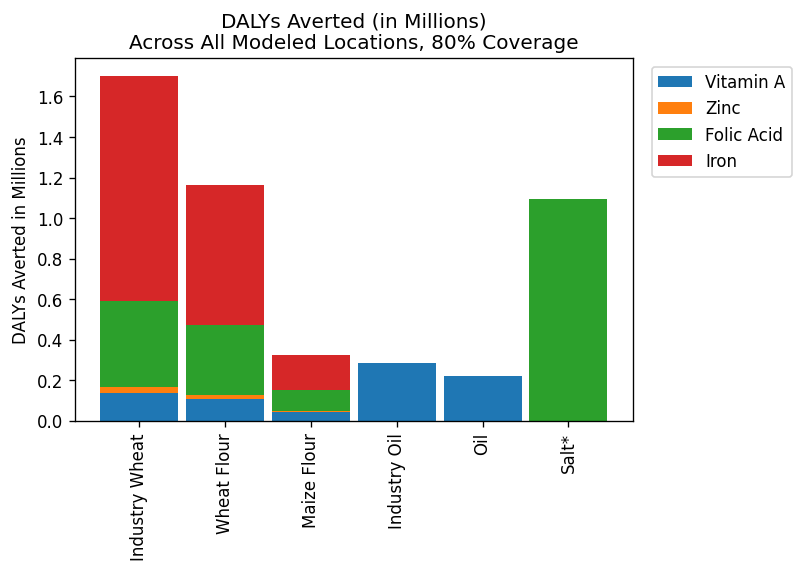

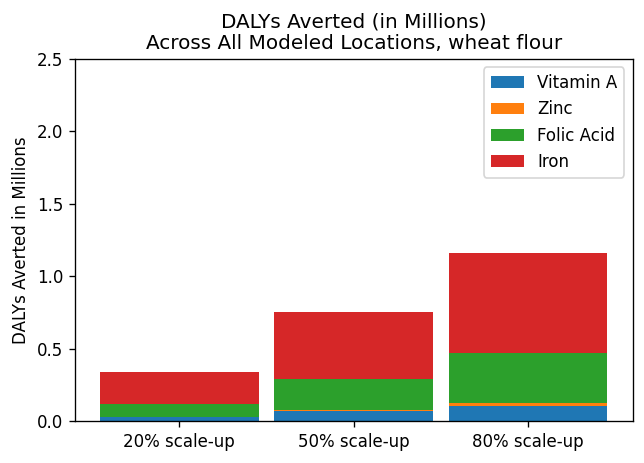

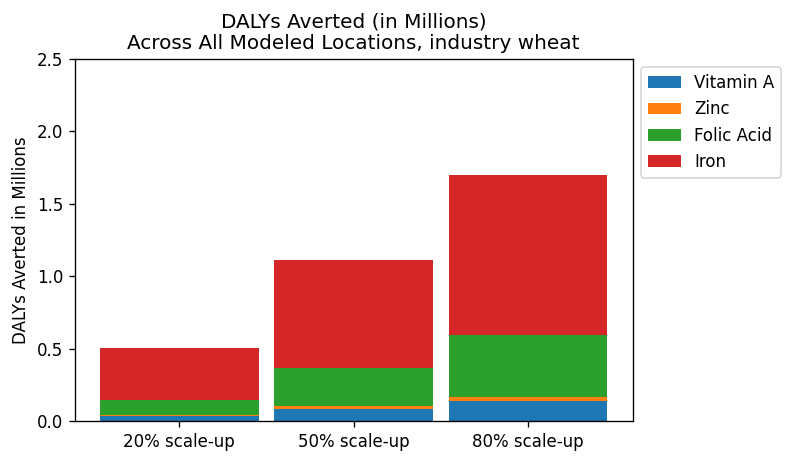

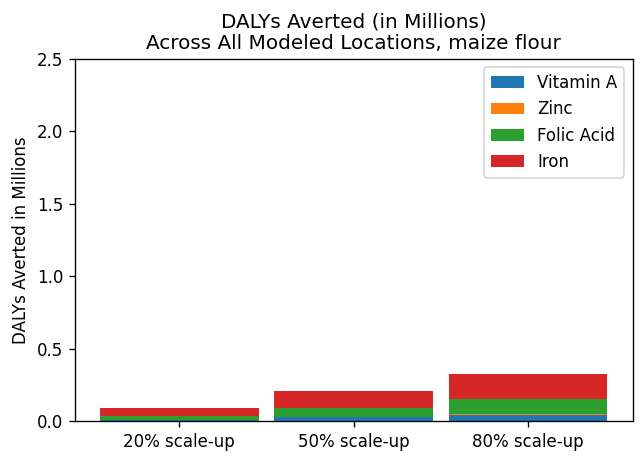

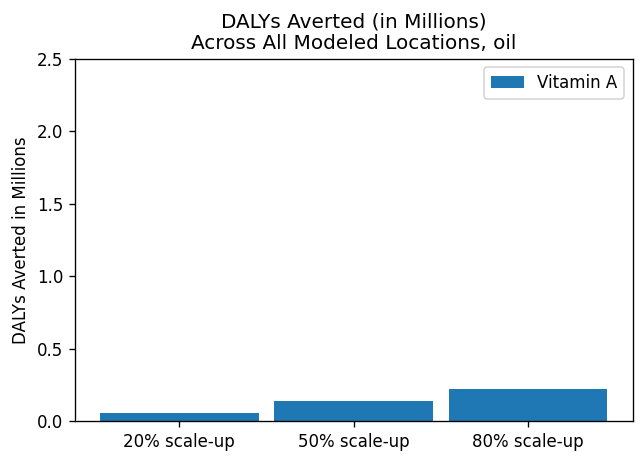

...

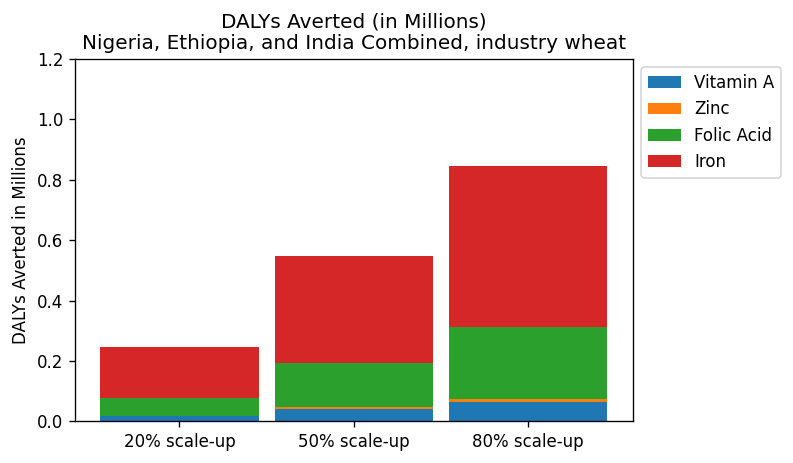

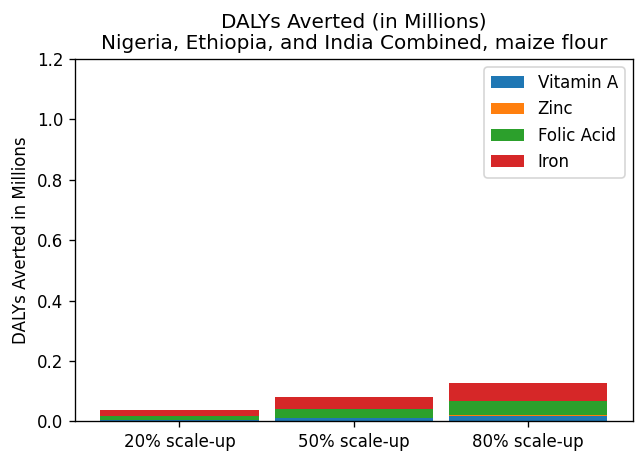

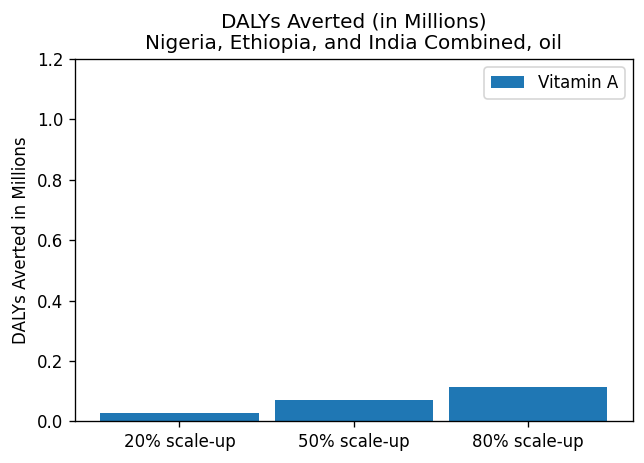

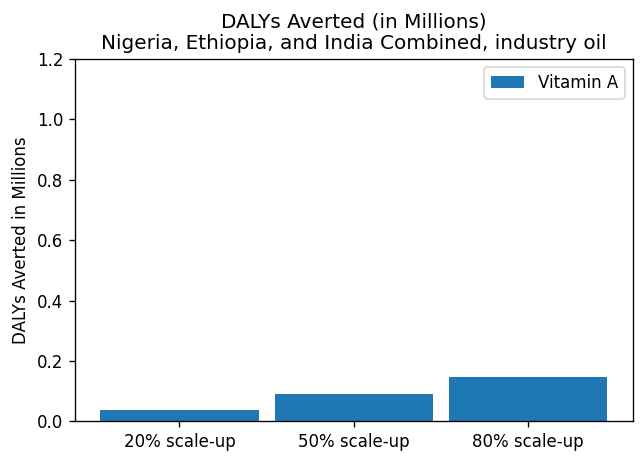

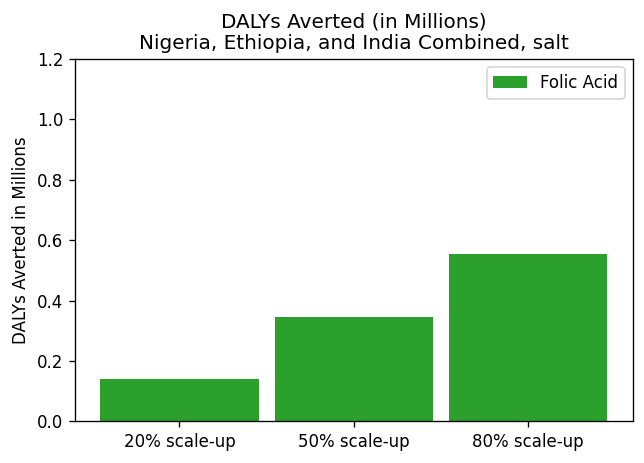

In [20]:
with PdfPages('results_plots/overall_dalys_averted_by_vehicle.pdf') as pdf:
    make_vehicle_comparison_plots_global()
    pdf.savefig(bbox_inches='tight')
    for vehicle in ['wheat flour', 'industry wheat','maize flour','oil','industry oil', 'salt']:
        dalys_averted_by_vehicle_and_nutrient_global_stacked_bar(total_by_cov, vehicle, 2.5, 1, 1)
        pdf.savefig(bbox_inches='tight')
    make_vehicle_comparison_plots_nei()
    pdf.savefig(bbox_inches='tight')
    for vehicle in ['wheat flour', 'industry wheat','maize flour','oil','industry oil', 'salt']:
        dalys_averted_by_vehicle_and_nutrient_global_stacked_bar(nei_by_cov, vehicle, 1.2, 1, 1, True)
        pdf.savefig(bbox_inches='tight')
    

# Nigeria, Ethiopia, India Summary Results

([<matplotlib.axis.XTick at 0x2af4cb3d9438>,
 [Text(0.0, 0, '20% scale-up'),
  Text(0.22, 0, '50% scale-up'),
  Text(0.44000000000000006, 0, '80% scale-up')])

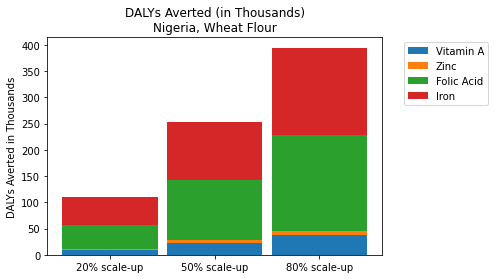

In [21]:
alt_data = results.loc[results.location_id==214].loc[results.vehicle=='wheat flour'].loc[results.measure=='counts_averted']
alt_data = alt_data.loc[alt_data.vehicle=='wheat flour']
alt_data = alt_data.set_index([c for c in alt_data.columns if 'draw' not in c])
alt_data = alt_data.mean(axis=1).reset_index().rename(columns={0:'mean'})
alt_data['mean'] = alt_data['mean'] / 1_000

alt_20 = alt_data.loc[alt_data.coverage_level==0.2]
alt_50 = alt_data.loc[alt_data.coverage_level==0.5]
alt_80 = alt_data.loc[alt_data.coverage_level==0.8]
barWidth = 0.20
spacerWidth = barWidth / 10
b = np.arange(len(alt_20.loc[alt_20.nutrient=='vitamin A']['mean']))
c = [x + barWidth + spacerWidth for x in b]
d = [x + barWidth + spacerWidth for x in c]



plt.bar(b, alt_20.loc[alt_20.nutrient=='vitamin A']['mean'], 
        width=barWidth, 
        color = 'tab:blue',
       label='Vitamin A')
plt.bar(b, alt_20.loc[alt_20.nutrient=='zinc']['mean'], 
        width=barWidth, 
        bottom = alt_20.loc[alt_20.nutrient=='vitamin A']['mean'],
        color= 'tab:orange',
       label='Zinc')
plt.bar(b, alt_20.loc[alt_20.nutrient=='folic acid']['mean'], 
        width=barWidth, 
        color='tab:green',
        label='Folic Acid',
        bottom = alt_20.loc[alt_20.nutrient=='zinc']['mean'].values + alt_20.loc[alt_20.nutrient=='vitamin A']['mean'].values)
plt.bar(b, alt_20.loc[alt_20.nutrient=='iron']['mean'], 
        width=barWidth, 
        color='tab:red',
        label='Iron',
        bottom = (alt_20.loc[alt_20.nutrient=='folic acid']['mean'].values 
         + alt_20.loc[alt_20.nutrient=='vitamin A']['mean'].values 
         + alt_20.loc[alt_20.nutrient=='zinc']['mean'].values))


plt.bar(c, alt_50.loc[alt_50.nutrient=='vitamin A']['mean'], 
        width=barWidth, 
        color = 'tab:blue')
plt.bar(c, alt_50.loc[alt_50.nutrient=='zinc']['mean'], 
        width=barWidth, 
        bottom = alt_50.loc[alt_50.nutrient=='vitamin A']['mean'],
        color= 'tab:orange')
plt.bar(c, alt_50.loc[alt_50.nutrient=='folic acid']['mean'], 
        width=barWidth, 
        color='tab:green',
        bottom = alt_50.loc[alt_50.nutrient=='zinc']['mean'].values + alt_50.loc[alt_50.nutrient=='vitamin A']['mean'].values)
plt.bar(c, alt_50.loc[alt_50.nutrient=='iron']['mean'], 
        width=barWidth, 
        color='tab:red',
        bottom = (alt_50.loc[alt_50.nutrient=='folic acid']['mean'].values 
         + alt_50.loc[alt_50.nutrient=='vitamin A']['mean'].values 
         + alt_50.loc[alt_50.nutrient=='zinc']['mean'].values))


plt.bar(d, alt_80.loc[alt_80.nutrient=='vitamin A']['mean'], 
        width=barWidth, 
        color = 'tab:blue')
plt.bar(d, alt_80.loc[alt_80.nutrient=='zinc']['mean'], 
        width=barWidth, 
        bottom = alt_80.loc[alt_80.nutrient=='vitamin A']['mean'],
        color= 'tab:orange')
plt.bar(d, alt_80.loc[alt_80.nutrient=='folic acid']['mean'], 
        width=barWidth, 
        color='tab:green',
        bottom = alt_80.loc[alt_80.nutrient=='zinc']['mean'].values + alt_80.loc[alt_80.nutrient=='vitamin A']['mean'].values)
plt.bar(d, alt_80.loc[alt_80.nutrient=='iron']['mean'], 
        width=barWidth, 
        color='tab:red',
        bottom = (alt_80.loc[alt_80.nutrient=='folic acid']['mean'].values 
         + alt_80.loc[alt_80.nutrient=='vitamin A']['mean'].values 
         + alt_80.loc[alt_80.nutrient=='zinc']['mean'].values))


plt.legend(bbox_to_anchor=(1.05, 1))
plt.ylabel('DALYs Averted in Thousands')
plt.title('DALYs Averted (in Thousands)\nNigeria, Wheat Flour')

plt.xticks([b[0], c[0], d[0]], ['20% scale-up','50% scale-up','80% scale-up'])

In [22]:
location_id=214
def make_location_specific_plot_by_vehicle(location_id, legend=True):
    f, ax = plt.subplots(dpi=120)
    alt_data = (results.loc[results.location_id==location_id]
                .loc[results.measure=='counts_averted']
                .loc[results.coverage_level==0.8])
    location_name = alt_data.location_name.unique()[0]
    alt_data = alt_data.set_index([c for c in alt_data.columns if 'draw' not in c])
    alt_data = alt_data.mean(axis=1).reset_index().rename(columns={0:'mean'})
    alt_data['mean'] = alt_data['mean'] / 1_000

    wheat = alt_data.loc[alt_data.vehicle=='wheat flour']
    industry_wheat = alt_data.loc[alt_data.vehicle=='industry wheat']
    maize = alt_data.loc[alt_data.vehicle=='maize flour']
    oil = alt_data.loc[alt_data.vehicle=='oil']
    industry_oil = alt_data.loc[alt_data.vehicle=='industry oil']
    salt = alt_data.loc[alt_data.vehicle=='salt']
    
    barWidth = 0.20
    spacerWidth = barWidth / 10
    a = np.arange(1)
    b = [x + barWidth + spacerWidth for x in a]
    c = [x + barWidth + spacerWidth for x in b]
    d = [x + barWidth + spacerWidth for x in c]
    e = [x + barWidth + spacerWidth for x in d]
    f = [x + barWidth + spacerWidth for x in e]
    
    plt.bar(f, salt['mean'], width=barWidth, color='tab:green')
    
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue',
           label='Vitamin A')
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom = industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'],
            color= 'tab:orange',
           label='Zinc')
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            label='Folic Acid',
            bottom = industry_wheat.loc[industry_wheat.nutrient=='zinc']['mean'].values + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'].values)
    plt.bar(a, industry_wheat.loc[industry_wheat.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            label='Iron',
            bottom = (industry_wheat.loc[industry_wheat.nutrient=='folic acid']['mean'].values 
             + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'].values 
             + industry_wheat.loc[industry_wheat.nutrient=='zinc']['mean'].values))


    plt.bar(b, wheat.loc[wheat.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(b, wheat.loc[wheat.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom = wheat.loc[wheat.nutrient=='vitamin A']['mean'],
            color= 'tab:orange')
    plt.bar(b, wheat.loc[wheat.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            bottom = wheat.loc[wheat.nutrient=='zinc']['mean'].values + wheat.loc[wheat.nutrient=='vitamin A']['mean'].values)
    plt.bar(b, wheat.loc[wheat.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            bottom = (wheat.loc[wheat.nutrient=='folic acid']['mean'].values 
             + wheat.loc[wheat.nutrient=='vitamin A']['mean'].values 
             + wheat.loc[wheat.nutrient=='zinc']['mean'].values))


    plt.bar(c, maize.loc[maize.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(c, maize.loc[maize.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom = maize.loc[maize.nutrient=='vitamin A']['mean'],
            color= 'tab:orange')
    plt.bar(c, maize.loc[maize.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            bottom = maize.loc[maize.nutrient=='zinc']['mean'].values + maize.loc[maize.nutrient=='vitamin A']['mean'].values)
    plt.bar(c, maize.loc[maize.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            bottom = (maize.loc[maize.nutrient=='folic acid']['mean'].values 
             + maize.loc[maize.nutrient=='vitamin A']['mean'].values 
             + maize.loc[maize.nutrient=='zinc']['mean'].values))
    
    plt.bar(d, industry_oil.loc[industry_oil.nutrient=='vitamin A']['mean'], 
        width=barWidth, 
        color = 'tab:blue')

    plt.bar(e, oil.loc[oil.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue')

    if legend:
        plt.legend(#['tab:red','tab:green','tab:orange','tab:blue'],
                   #['Iron','Folic Acid','Zinc','Vitamin A'], 
                    loc='best')
    plt.ylabel('DALYs Averted in Thousands')
    plt.title(f'DALYs Averted (in Thousands)\n{location_name}, 80% Coverage Scale-Up')
    plt.xticks([a[0], b[0], c[0], d[0], e[0], f[0]], ['Industry Wheat','Wheat Flour','Maize Flour','Industry Oil','Oil','Salt'], rotation=90)
    #plt.savefig('results_p')

/ihme/code/central_comp/miniconda_svc-ccomp/envs/v109/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


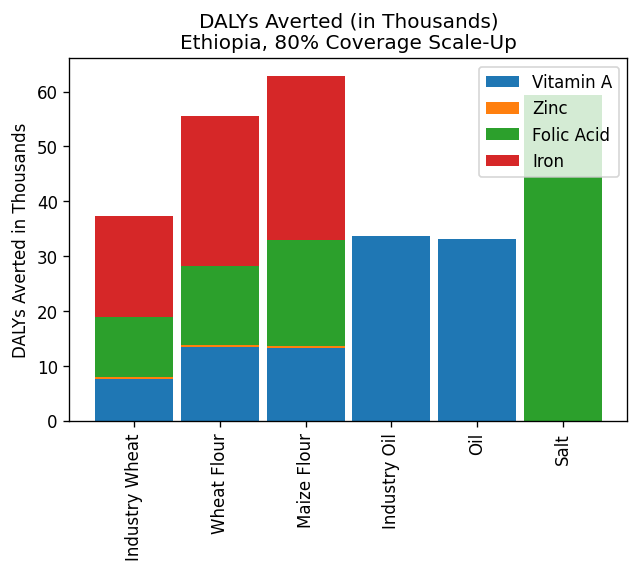

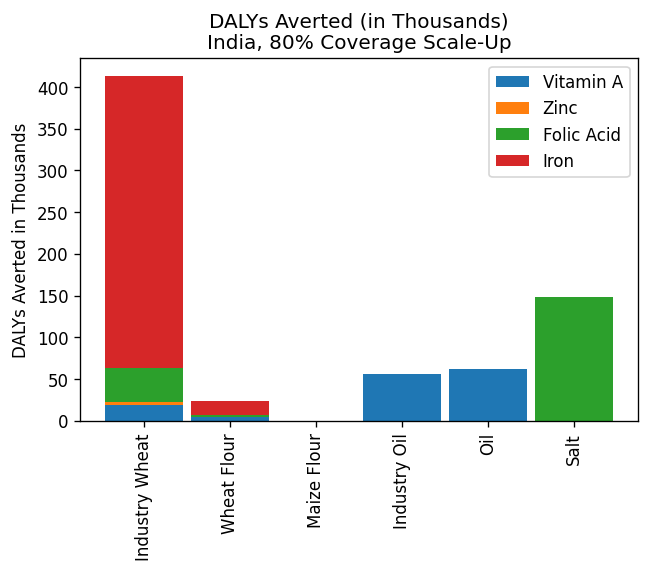

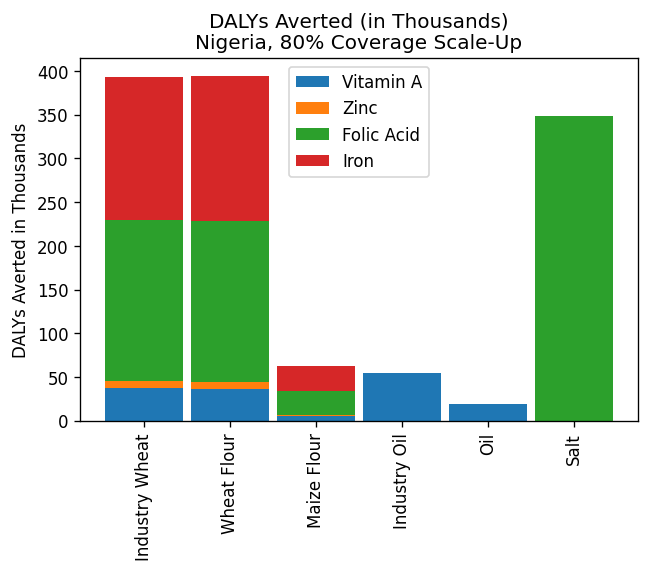

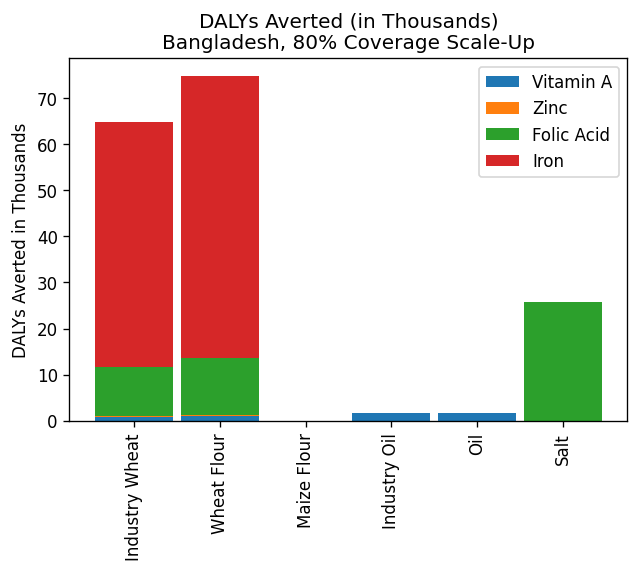

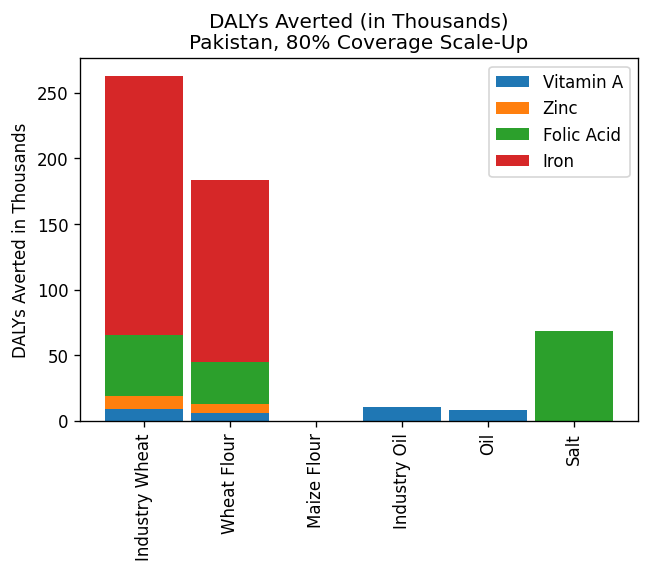

...

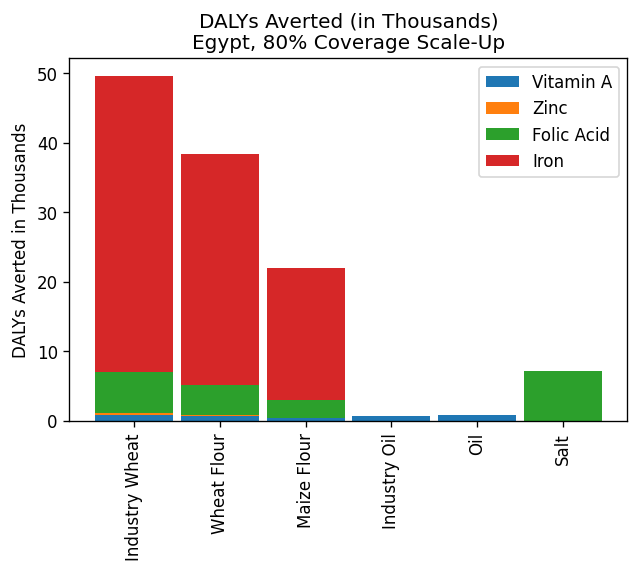

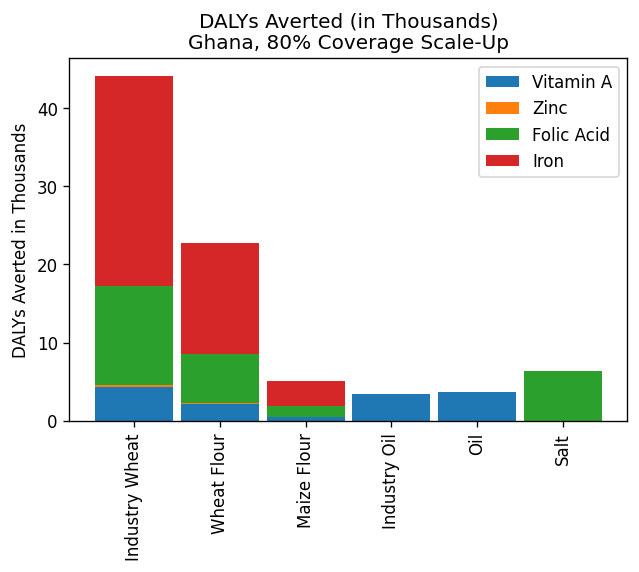

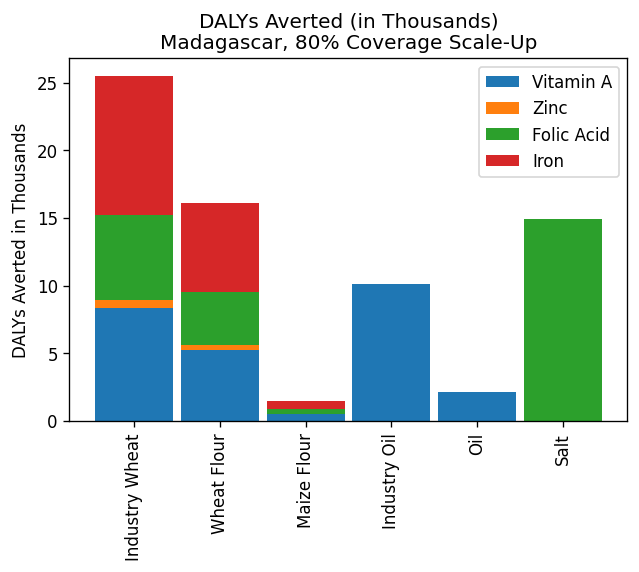

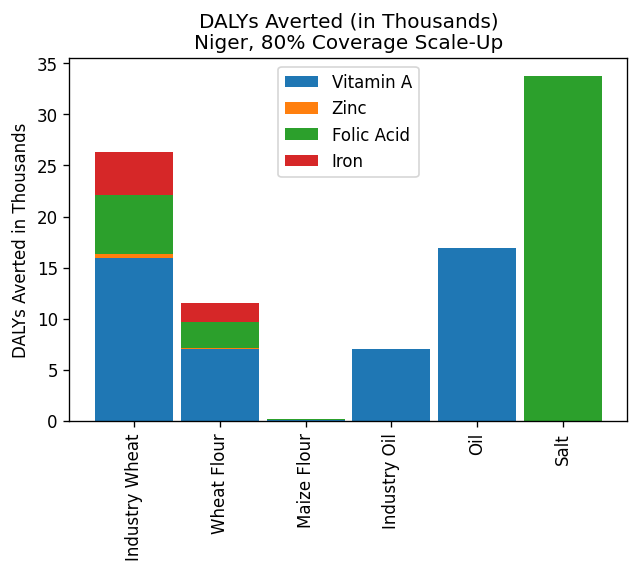

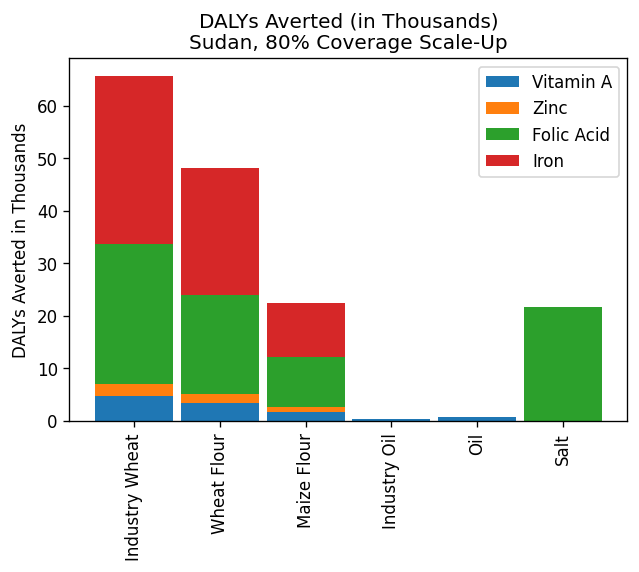

In [23]:
with PdfPages('results_plots/overall_dalys_averted_by_vehicle_and_location.pdf') as pdf:
    for location_id in location_ids:
        make_location_specific_plot_by_vehicle(location_id)
        pdf.savefig(bbox_inches='tight')

In [104]:
location_id=214
def make_location_specific_plot_by_vehicle(location_id, oil_p=True,
                                          industry_oil_p=True,
                                          wheat_p=True,
                                          industry_wheat_p=True,
                                          maize_p=True,
                                          salt_p=True):
    f, ax = plt.subplots(dpi=120)
    alt_data = (results.loc[results.location_id==location_id]
                .loc[results.measure=='counts_averted']
                .loc[results.coverage_level==0.8])
    location_name = alt_data.location_name.unique()[0]
    alt_data = alt_data.set_index([c for c in alt_data.columns if 'draw' not in c])
    alt_data = alt_data.mean(axis=1).reset_index().rename(columns={0:'mean'})
    alt_data['mean'] = alt_data['mean'] / 1_000

    wheat = alt_data.loc[alt_data.vehicle=='wheat flour']
    industry_wheat = alt_data.loc[alt_data.vehicle=='industry wheat']
    maize = alt_data.loc[alt_data.vehicle=='maize flour']
    oil = alt_data.loc[alt_data.vehicle=='oil']
    industry_oil = alt_data.loc[alt_data.vehicle=='industry oil']
    salt = alt_data.loc[alt_data.vehicle=='salt']
    
    barWidth = 0.20
    spacerWidth = barWidth / 10
    a = np.arange(1)
    b = [x + barWidth + spacerWidth for x in a]
    c = [x + barWidth + spacerWidth for x in b]
    d = [x + barWidth + spacerWidth for x in c]
    e = [x + barWidth + spacerWidth for x in d]
    f = [x + barWidth + spacerWidth for x in e]
    
    
    if salt_p==True:
        plt.bar(f, salt['mean'], width=barWidth, color='tab:green')
    if industry_wheat_p==True:
        plt.bar(e, industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'], 
                width=barWidth, 
                color = 'tab:blue',
               label='Vitamin A')
        plt.bar(e, industry_wheat.loc[industry_wheat.nutrient=='zinc']['mean'], 
                width=barWidth, 
                bottom = industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'],
                color= 'tab:orange',
               label='Zinc')
        plt.bar(e, industry_wheat.loc[industry_wheat.nutrient=='folic acid']['mean'], 
                width=barWidth, 
                color='tab:green',
                label='Folic Acid',
                bottom = industry_wheat.loc[industry_wheat.nutrient=='zinc']['mean'].values + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'].values)
        plt.bar(e, industry_wheat.loc[industry_wheat.nutrient=='iron']['mean'], 
                width=barWidth, 
                color='tab:red',
                label='Iron',
                bottom = (industry_wheat.loc[industry_wheat.nutrient=='folic acid']['mean'].values 
                 + industry_wheat.loc[industry_wheat.nutrient=='vitamin A']['mean'].values 
                 + industry_wheat.loc[industry_wheat.nutrient=='zinc']['mean'].values))

    if wheat_p==True:
        plt.bar(d, wheat.loc[wheat.nutrient=='vitamin A']['mean'], 
                width=barWidth, 
                color = 'tab:blue')
        plt.bar(d, wheat.loc[wheat.nutrient=='zinc']['mean'], 
                width=barWidth, 
                bottom = wheat.loc[wheat.nutrient=='vitamin A']['mean'],
                color= 'tab:orange')
        plt.bar(d, wheat.loc[wheat.nutrient=='folic acid']['mean'], 
                width=barWidth, 
                color='tab:green',
                bottom = wheat.loc[wheat.nutrient=='zinc']['mean'].values + wheat.loc[wheat.nutrient=='vitamin A']['mean'].values)
        plt.bar(d, wheat.loc[wheat.nutrient=='iron']['mean'], 
                width=barWidth, 
                color='tab:red',
                bottom = (wheat.loc[wheat.nutrient=='folic acid']['mean'].values 
                 + wheat.loc[wheat.nutrient=='vitamin A']['mean'].values 
                 + wheat.loc[wheat.nutrient=='zinc']['mean'].values))

    if maize_p==True:
        plt.bar(c, maize.loc[maize.nutrient=='vitamin A']['mean'], 
                width=barWidth, 
                color = 'tab:blue')
        plt.bar(c, maize.loc[maize.nutrient=='zinc']['mean'], 
                width=barWidth, 
                bottom = maize.loc[maize.nutrient=='vitamin A']['mean'],
                color= 'tab:orange')
        plt.bar(c, maize.loc[maize.nutrient=='folic acid']['mean'], 
                width=barWidth, 
                color='tab:green',
                bottom = maize.loc[maize.nutrient=='zinc']['mean'].values + maize.loc[maize.nutrient=='vitamin A']['mean'].values)
        plt.bar(c, maize.loc[maize.nutrient=='iron']['mean'], 
                width=barWidth, 
                color='tab:red',
                bottom = (maize.loc[maize.nutrient=='folic acid']['mean'].values 
                 + maize.loc[maize.nutrient=='vitamin A']['mean'].values 
                 + maize.loc[maize.nutrient=='zinc']['mean'].values))
    if industry_oil_p:
        plt.bar(b, industry_oil.loc[industry_oil.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue')
    if oil_p:
        plt.bar(a, oil.loc[oil.nutrient=='vitamin A']['mean'], 
                width=barWidth, 
                color = 'tab:blue')

    plt.legend(#['tab:red','tab:green','tab:orange','tab:blue'],
                   #['Iron','Folic Acid','Zinc','Vitamin A'], 
                    loc='best')
    plt.ylabel('DALYs Averted in Thousands')
    plt.title(f'DALYs Averted (in Thousands)\n{location_name}, 80% Coverage Scale-Up')
    plt.xticks([a[0], b[0], c[0], d[0], e[0], f[0]], ['Literature Oil','Industry Oil','Maize Flour','Literature Wheat Flour','Industry Wheat Flour','Salt'], rotation=90)
    #plt.savefig('results_p')

No handles with labels found to put in legend.


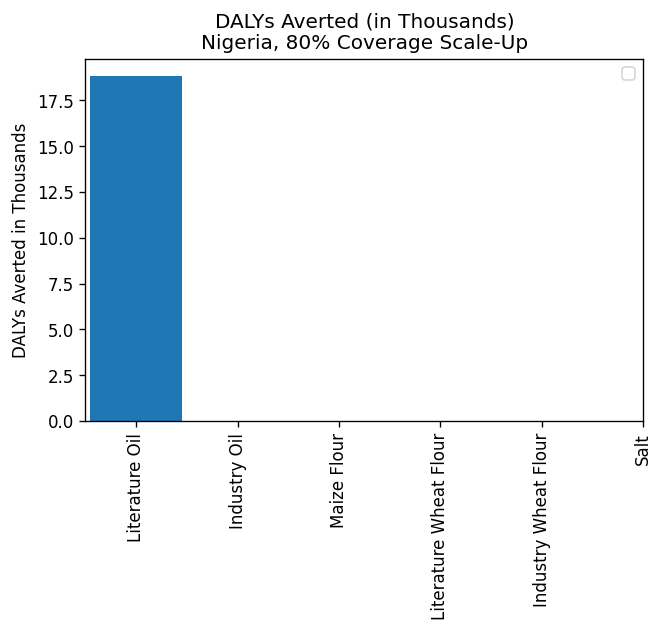

In [107]:
make_location_specific_plot_by_vehicle(214, oil_p=True,
                                          industry_oil_p=False,
                                          wheat_p=False,
                                          industry_wheat_p=False,
                                          maize_p=False,
                                      salt_p=False)

No handles with labels found to put in legend.


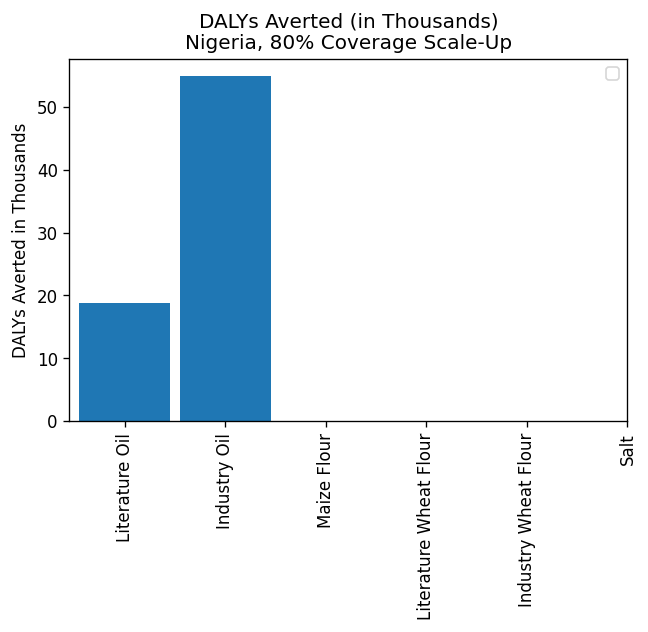

In [105]:
make_location_specific_plot_by_vehicle(214, oil_p=True,
                                          industry_oil_p=True,
                                          wheat_p=False,
                                          industry_wheat_p=False,
                                          maize_p=False,
                                      salt_p=False)

No handles with labels found to put in legend.


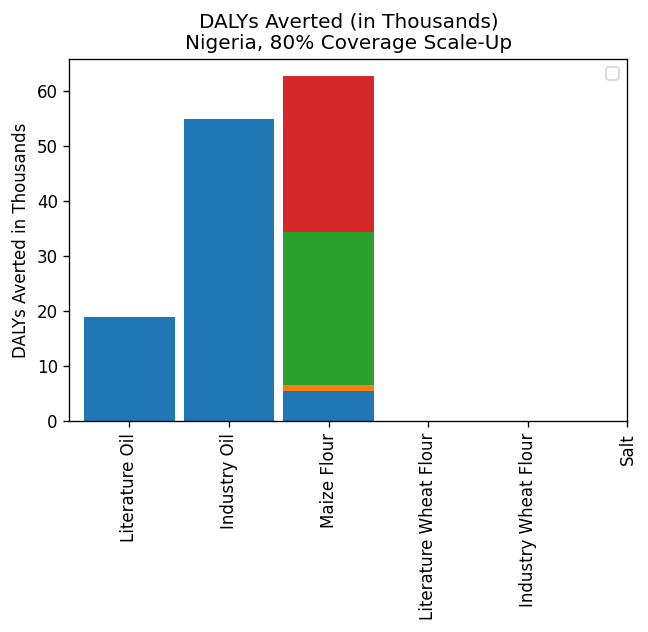

In [108]:
make_location_specific_plot_by_vehicle(214, oil_p=True,
                                          industry_oil_p=True,
                                          wheat_p=False,
                                          industry_wheat_p=False,
                                          maize_p=True,
                                      salt_p=False)

No handles with labels found to put in legend.


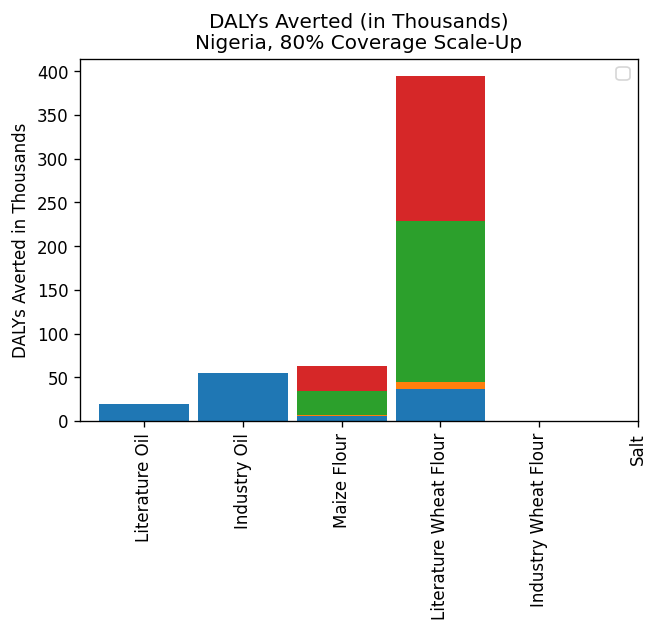

In [109]:
make_location_specific_plot_by_vehicle(214, oil_p=True,
                                          industry_oil_p=True,
                                          wheat_p=True,
                                          industry_wheat_p=False,
                                          maize_p=True,
                                      salt_p=False)

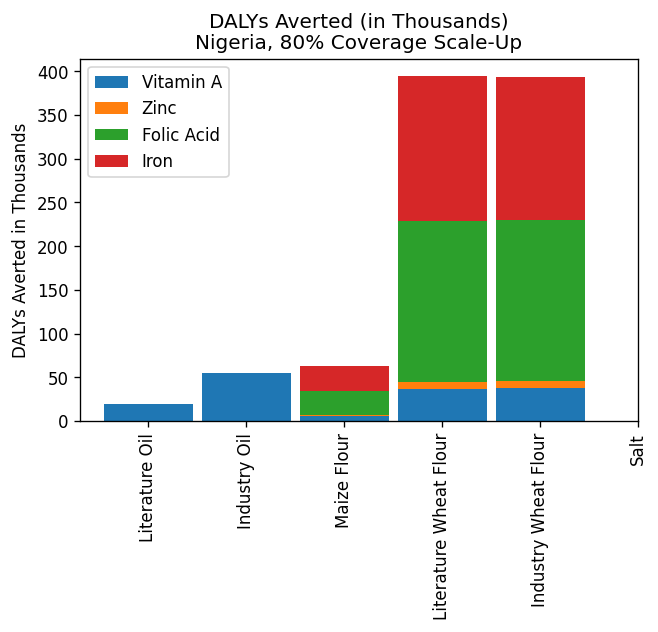

In [110]:
make_location_specific_plot_by_vehicle(214, oil_p=True,
                                          industry_oil_p=True,
                                          wheat_p=True,
                                          industry_wheat_p=True,
                                          maize_p=True,
                                      salt_p=False)

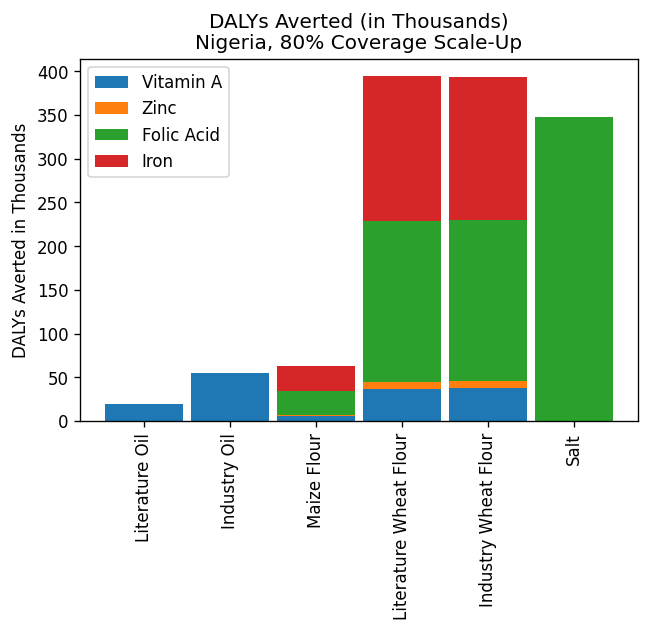

In [106]:
make_location_specific_plot_by_vehicle(214)

In [91]:
location_id=214
def make_location_and_vehicle_specific_plot_by_coverage(location_id, vehicle, measure):
    f, ax = plt.subplots(dpi=120)
    alt_data = (results.loc[results.location_id==location_id]
                .loc[results.measure==measure]
                .loc[results.vehicle==vehicle])
                #.loc[results.coverage_level==0.8])
    location_name = alt_data.location_name.unique()[0]
    alt_data = alt_data.set_index([c for c in alt_data.columns if 'draw' not in c])
    alt_data = alt_data.mean(axis=1).reset_index().rename(columns={0:'mean'})
    alt_data['mean'] = alt_data['mean'] #/ 1_000

    alt_20 = alt_data.loc[alt_data.coverage_level==0.2]
    alt_50 = alt_data.loc[alt_data.coverage_level==0.5]            
    alt_80 = alt_data.loc[alt_data.coverage_level==0.8]
    barWidth = 0.20
    spacerWidth = barWidth / 10
    a = np.arange(1)
    b = [x + barWidth + spacerWidth for x in a]
    c = [x + barWidth + spacerWidth for x in b]
    
    plt.bar(a, alt_20.loc[alt_20.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue',
           label='Vitamin A')
    
    plt.bar(a, alt_20.loc[alt_20.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom = alt_20.loc[alt_20.nutrient=='vitamin A']['mean'],
            color= 'tab:orange',
           label='Zinc')
    plt.bar(a, alt_20.loc[alt_20.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            label='Folic Acid',
            bottom = alt_20.loc[alt_20.nutrient=='zinc']['mean'].values + alt_20.loc[alt_20.nutrient=='vitamin A']['mean'].values)
    plt.bar(a, alt_20.loc[alt_20.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            label='Iron',
            bottom = (alt_20.loc[alt_20.nutrient=='folic acid']['mean'].values 
             + alt_20.loc[alt_20.nutrient=='vitamin A']['mean'].values 
             + alt_20.loc[alt_20.nutrient=='zinc']['mean'].values))


    plt.bar(b,alt_50.loc[alt_50.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(b,alt_50.loc[alt_50.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom =alt_50.loc[alt_50.nutrient=='vitamin A']['mean'],
            color= 'tab:orange')
    plt.bar(b,alt_50.loc[alt_50.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            bottom =alt_50.loc[alt_50.nutrient=='zinc']['mean'].values +alt_50.loc[alt_50.nutrient=='vitamin A']['mean'].values)
    plt.bar(b,alt_50.loc[alt_50.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            bottom = (alt_50.loc[alt_50.nutrient=='folic acid']['mean'].values 
             +alt_50.loc[alt_50.nutrient=='vitamin A']['mean'].values 
             +alt_50.loc[alt_50.nutrient=='zinc']['mean'].values))


    plt.bar(c, alt_80.loc[alt_80.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(c, alt_80.loc[alt_80.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom = alt_80.loc[alt_80.nutrient=='vitamin A']['mean'],
            color= 'tab:orange')
    plt.bar(c, alt_80.loc[alt_80.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            bottom = alt_80.loc[alt_80.nutrient=='zinc']['mean'].values + alt_80.loc[alt_80.nutrient=='vitamin A']['mean'].values)
    plt.bar(c, alt_80.loc[alt_80.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            bottom = (alt_80.loc[alt_80.nutrient=='folic acid']['mean'].values 
             + alt_80.loc[alt_80.nutrient=='vitamin A']['mean'].values 
             + alt_80.loc[alt_80.nutrient=='zinc']['mean'].values))
    if 'oil' in vehicle:
        plt.legend(['Vitamin A'])
    else:
        plt.legend(loc='best')
    if measure == 'counts_averted':
        plt.ylabel('DALYs Averted')
        plt.title(f'DALYs Averted due to vitamin A fortification in {vehicle} in {location_name}')
    elif measure == 'rates_averted':
        plt.ylabel('DALYs Averted per 100,000 person-years')
        plt.title(f'DALYs Averted per 100,000 person-years due to\nvitamin A fortification in {vehicle} in {location_name}')
    plt.xticks([a[0], b[0], c[0]], ['20% scale-up','50% scale-up','80% scale-up'])#, rotation=90)
    #plt.savefig('results_p')

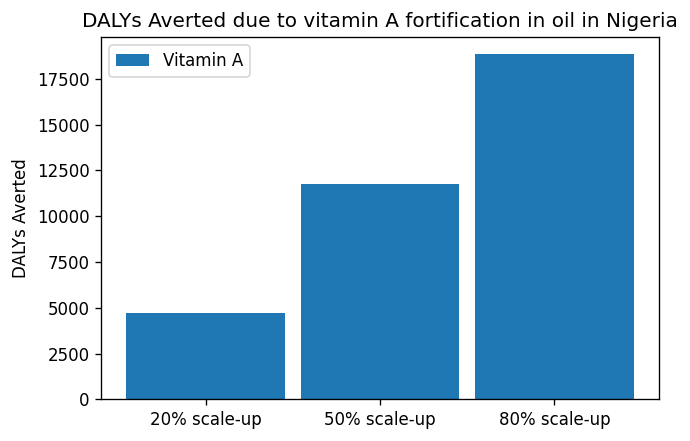

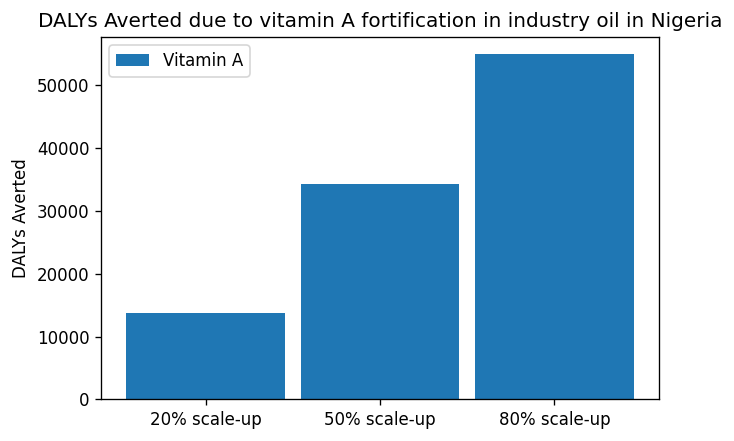

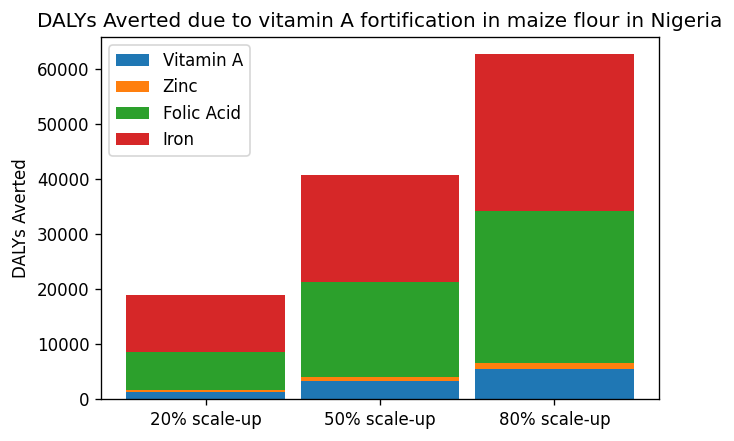

In [92]:
make_location_and_vehicle_specific_plot_by_coverage(214, 'oil', 'counts_averted')
make_location_and_vehicle_specific_plot_by_coverage(214, 'industry oil', 'counts_averted')
make_location_and_vehicle_specific_plot_by_coverage(214, 'maize flour', 'counts_averted')

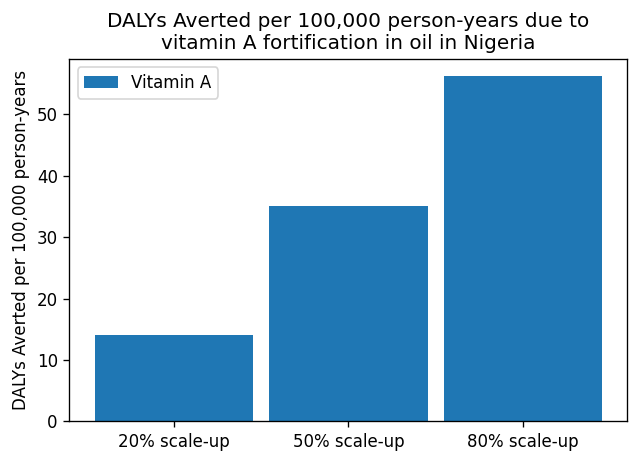

In [93]:
make_location_and_vehicle_specific_plot_by_coverage(214, 'oil', 'rates_averted')

In [24]:
def make_nigeria_ethiopia_india_plots_by_vehicle(vehicle, legend=True, india=True):
    f, ax = plt.subplots(dpi=120)
    alt_data = (results.loc[results.location_id.isin([214,163,179])]
                            .loc[results.vehicle==vehicle]
                            .loc[results.measure=='counts_averted']
                            .loc[results.coverage_level==0.8])
    alt_data = alt_data.set_index([c for c in alt_data.columns if 'draw' not in c])
    alt_data = alt_data.mean(axis=1).reset_index().rename(columns={0:'mean'})
    alt_data['mean'] = alt_data['mean'] / 1_000

    loc_214 = alt_data.loc[alt_data.location_id==214]
    loc_163 = alt_data.loc[alt_data.location_id==163]
    loc_179 = alt_data.loc[alt_data.location_id==179]
    barWidth = 0.20
    spacerWidth = barWidth / 10
    b = np.arange(len(loc_214.loc[loc_214.nutrient=='vitamin A']['mean']))
    c = [x + barWidth + spacerWidth for x in b]
    d = [x + barWidth + spacerWidth for x in c]

    plt.bar(b, loc_214.loc[loc_214.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue',
           label='Vitamin A')
    plt.bar(b, loc_214.loc[loc_214.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom = loc_214.loc[loc_214.nutrient=='vitamin A']['mean'],
            color= 'tab:orange',
           label='Zinc')
    plt.bar(b, loc_214.loc[loc_214.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            label='Folic Acid',
            bottom = loc_214.loc[loc_214.nutrient=='zinc']['mean'].values + loc_214.loc[loc_214.nutrient=='vitamin A']['mean'].values)
    plt.bar(b, loc_214.loc[loc_214.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            label='Iron',
            bottom = (loc_214.loc[loc_214.nutrient=='folic acid']['mean'].values 
             + loc_214.loc[loc_214.nutrient=='vitamin A']['mean'].values 
             + loc_214.loc[loc_214.nutrient=='zinc']['mean'].values))


    plt.bar(c, loc_179.loc[loc_179.nutrient=='vitamin A']['mean'], 
            width=barWidth, 
            color = 'tab:blue')
    plt.bar(c, loc_179.loc[loc_179.nutrient=='zinc']['mean'], 
            width=barWidth, 
            bottom = loc_179.loc[loc_179.nutrient=='vitamin A']['mean'],
            color= 'tab:orange')
    plt.bar(c, loc_179.loc[loc_179.nutrient=='folic acid']['mean'], 
            width=barWidth, 
            color='tab:green',
            bottom = loc_179.loc[loc_179.nutrient=='zinc']['mean'].values + loc_179.loc[loc_179.nutrient=='vitamin A']['mean'].values)
    plt.bar(c, loc_179.loc[loc_179.nutrient=='iron']['mean'], 
            width=barWidth, 
            color='tab:red',
            bottom = (loc_179.loc[loc_179.nutrient=='folic acid']['mean'].values 
             + loc_179.loc[loc_179.nutrient=='vitamin A']['mean'].values 
             + loc_179.loc[loc_179.nutrient=='zinc']['mean'].values))

    if india:
        plt.bar(d, loc_163.loc[loc_163.nutrient=='vitamin A']['mean'], 
                width=barWidth, 
                color = 'tab:blue')
        plt.bar(d, loc_163.loc[loc_163.nutrient=='zinc']['mean'], 
                width=barWidth, 
                bottom = loc_163.loc[loc_163.nutrient=='vitamin A']['mean'],
                color= 'tab:orange')
        plt.bar(d, loc_163.loc[loc_163.nutrient=='folic acid']['mean'], 
                width=barWidth, 
                color='tab:green',
                bottom = loc_163.loc[loc_163.nutrient=='zinc']['mean'].values + loc_163.loc[loc_163.nutrient=='vitamin A']['mean'].values)
        plt.bar(d, loc_163.loc[loc_163.nutrient=='iron']['mean'], 
                width=barWidth, 
                color='tab:red',
                bottom = (loc_163.loc[loc_163.nutrient=='folic acid']['mean'].values 
                 + loc_163.loc[loc_163.nutrient=='vitamin A']['mean'].values 
                 + loc_163.loc[loc_163.nutrient=='zinc']['mean'].values))
        plt.xticks([b[0], c[0], d[0]], ['Nigeria','Ethiopia','India'])
    else:
        plt.xticks([b[0], c[0]], ['Nigeria','Ethiopia'])
    if legend:
        plt.legend(bbox_to_anchor=(1.3, 1))
    plt.ylabel('DALYs Averted in Thousands')
    plt.title(f'DALYs Averted (in Thousands)\n{vehicle.capitalize()} 80% Coverage Scale-Up')

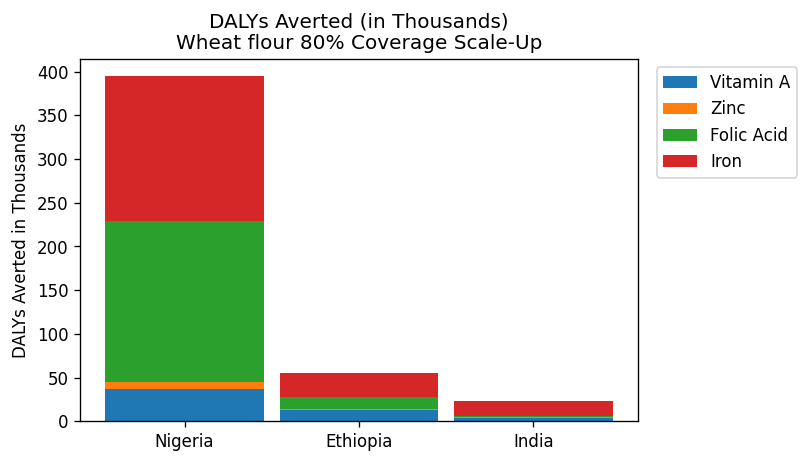

In [25]:
make_nigeria_ethiopia_india_plots_by_vehicle('wheat flour')

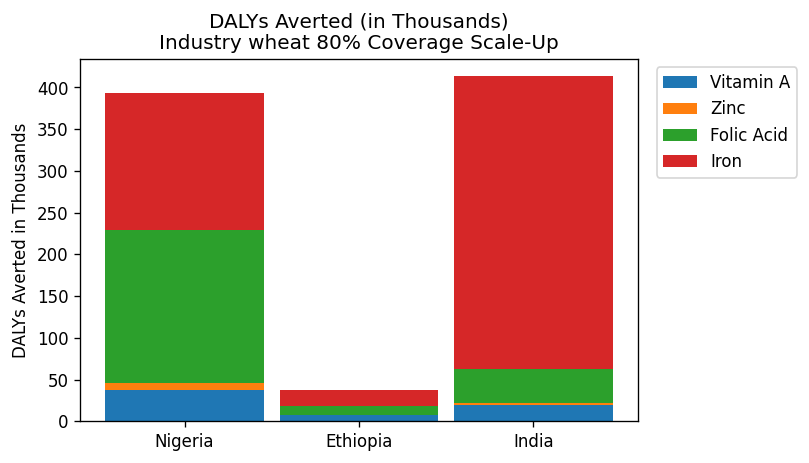

In [26]:
make_nigeria_ethiopia_india_plots_by_vehicle('industry wheat')

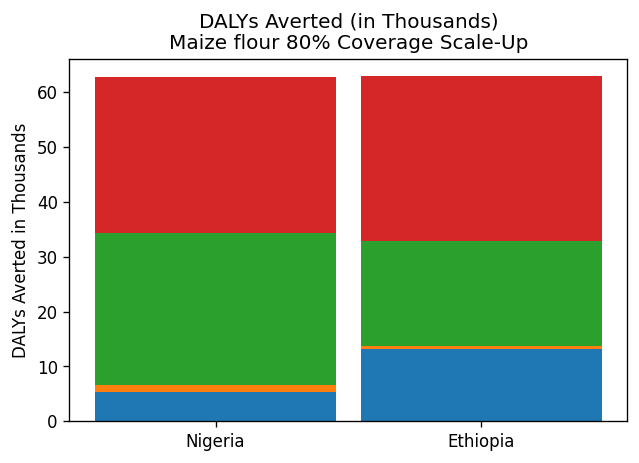

In [27]:
make_nigeria_ethiopia_india_plots_by_vehicle('maize flour', False, False)

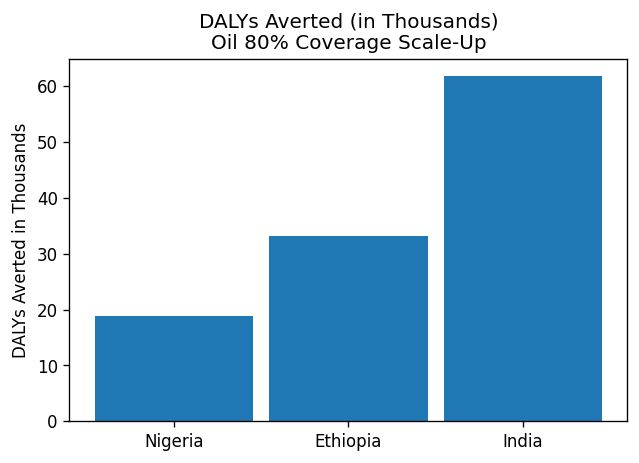

In [28]:
make_nigeria_ethiopia_india_plots_by_vehicle('oil', False)

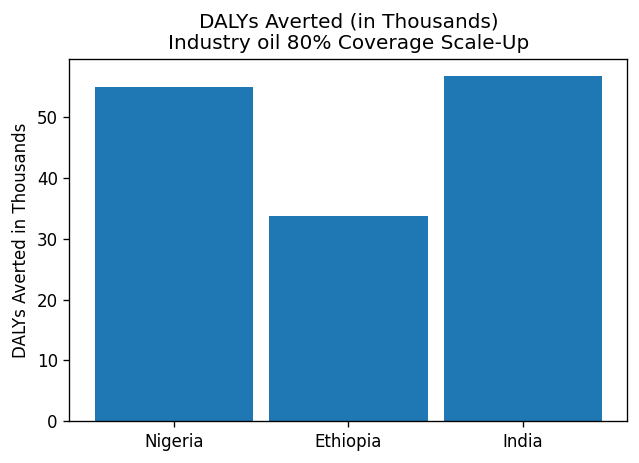

In [29]:
make_nigeria_ethiopia_india_plots_by_vehicle('industry oil', False)

# Difference between industry and literature vehicles

In [23]:
index_cols = ['location_id','location_name','nutrient','nutrient_name','year','measure','coverage_level']

o_results = results.loc[results.vehicle=='oil'].drop(columns=['vehicle','label']).set_index(index_cols).sort_index()
io_results = results.loc[results.vehicle=='industry oil'].drop(columns=['vehicle','label']).set_index(index_cols).sort_index()
o_diff = (io_results - o_results)#.drop(columns='index')
o_diff.head()

draw_0  \
location_id location_name nutrient  nutrient_name year measure        coverage_level                
6           China         vitamin A Vitamin A     2025 counts_averted 0.2              574.668337   
                                                                      0.5             1436.670842   
                                                                      0.8             2298.673347   
                                                                      1.0             2873.341684   
                                                       pif            0.2                3.951375   

                                                                                           draw_1  \
location_id location_name nutrient  nutrient_name year measure        coverage_level                
6           China         vitamin A Vitamin A     2025 counts_averted 0.2              256.247347   
                                                                      0.5              640.618367   
                                                                      0.8             1024.989387   
                                                                      1.0             1281.236734   
                                                       pif            0.2                2.139406   

                                                                                          draw_10  \
location_id location_name nutrient  nutrient_name year measure        coverage_level                
6           China         vitamin A Vitamin A     2025 counts_averted 0.2              249.219192   
                                                                      0.5              623.047979   
                                                                      0.8              996.876767   
                                                                      1.0             1246.095958   
                                                       pif            0.2                2.176886   

                                                                                         draw_100  \
location_id location_name nutrient  nutrient_name year measure        coverage_level                
6           China         vitamin A Vitamin A     2025 counts_averted 0.2              223.605547   
                                                                      0.5              559.013867   
                                                                      0.8              894.422188   
                                                                      1.0             1118.027735   
                                                       pif            0.2                1.803293   

                                                                                         draw_101  \
location_id location_name nutrient  nutrient_name year measure        coverage_level                
6           China         vitamin A Vitamin A     2025 counts_averted 0.2              289.066992   
                                                                      0.5              722.667479   
                                                                      0.8             1156.267967   
                                                                      1.0             1445.334959   
                                                       pif            0.2                3.549400   

                                                                                         draw_102  \
location_id location_name nutrient  nutrient_name year measure        coverage_level                
6           China         vitamin A Vitamin A     2025 counts_averted 0.2              273.344165   
                                                                      0.5              683.360412   
                                                                      0.8             1093.376660   
                                              

In [24]:
index_cols = ['location_id','location_name','nutrient','nutrient_name','year','measure','coverage_level']

w_results = results.loc[results.vehicle=='wheat flour'].drop(columns=['vehicle','label']).set_index(index_cols).sort_index()
iw_results = results.loc[results.vehicle=='industry wheat'].drop(columns=['vehicle','label']).set_index(index_cols).sort_index()
w_diff = (iw_results - w_results)#.drop(columns='index')
w_diff = w_diff.groupby(['location_id','location_name','year','measure','coverage_level']).sum()
w_diff.head()

draw_0  \
location_id location_name year measure             coverage_level               
6           China         2025 counts_averted      0.2            -277.948035   
                                                   0.5            -669.085991   
                                                   0.8            -964.746415   
                                                   1.0             -68.549032   
                               deficiency_exposure 0.2               0.000022   

                                                                        draw_1  \
location_id location_name year measure             coverage_level                
6           China         2025 counts_averted      0.2             1524.207537   
                                                   0.5             3667.360678   
                                                   0.8             5731.525785   
                                                   1.0             1341.255760   
                               deficiency_exposure 0.2                0.000000   

                                                                       draw_10  \
location_id location_name year measure             coverage_level                
6           China         2025 counts_averted      0.2            -1567.814276   
                                                   0.5            -3890.439244   
                                                   0.8            -6241.282365   
                                                   1.0            -2008.345219   
                               deficiency_exposure 0.2                0.000862   

                                                                      draw_100  \
location_id location_name year measure             coverage_level                
6           China         2025 counts_averted      0.2            -1696.024730   
                                                   0.5            -3679.194706   
                                                   0.8            -5280.065025   
                                                   1.0            -1269.340969   
                               deficiency_exposure 0.2                0.001815   

                                                                       draw_101  \
location_id location_name year measure             coverage_level                 
6           China         2025 counts_averted      0.2             -9843.427005   
                                                   0.5            -23177.845759   
                                                   0.8            -35210.254364   
                                                   1.0             -6765.075132   
                               deficiency_exposure 0.2                 0.005983   

                                                                       draw_102  \
location_id location_name year measure             coverage_level                 
6           China         2025 counts_averted      0.2             -7168.264603   
                                                   0.5            -16297.723941   
                                                   0.8            -24240.208518   
                                                   1.0             -3822.923906   
                               deficiency_exposure 0.2                 0.003246   

                                                                      draw_103  \
location_id location_name year measure             coverage_level                
6           China         2025 counts_averted      0.2            -1334.113451   
                                                   0.5            -3391.939678   
                                                   0.8            -5511.536788   
                                                   1.0            -2758.329838   
                               deficiency_exposure 0.2                0.001287   

                                       

In [25]:
measure = 'counts_averted'

p = o_diff.apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1).reset_index()
p = (p.loc[p.measure==measure]
     .loc[p.coverage_level==0.8]
     .loc[p.year==2025])
p.head()

,location_id,location_name,nutrient,nutrient_name,year,measure,coverage_level,count,mean,std,min,2.5%,50%,97.5%,max
2,6,China,vitamin A,Vitamin A,2025,counts_averted,0.8,1000.0,1337.006347,696.714826,-2066.682366,-66.764645,1343.472854,2854.798259,3857.837207
14,11,Indonesia,vitamin A,Vitamin A,2025,counts_averted,0.8,1000.0,-654.421981,732.745233,-4817.100754,-2470.397561,-502.796829,318.217397,1175.594017
26,15,Myanmar,vitamin A,Vitamin A,2025,counts_averted,0.8,1000.0,2011.398201,1238.302420,-2680.610325,-114.597325,1909.753703,4665.943826,7767.203085
38,20,Viet Nam,vitamin A,Vitamin A,2025,counts_averted,0.8,1000.0,-83.200312,148.079031,-992.857051,-413.932747,-53.046469,147.711344,330.030775
50,141,Egypt,vitamin A,Vitamin A,2025,counts_averted,0.8,1000.0,-68.146344,67.846183,-486.243160,-236.889190,-56.698688,25.151083,166.781674


In [26]:
def wheat_comparison_plots(measure, title, ylabel, filename):
    coverage_levels = [0.2,0.5,0.8]

    f, ax = plt.subplots(figsize=(12, 4), dpi=120)
    colors = ['tab:red', 'tab:orange', 'tab:green']

    location_spacer = 0.15
    coverage_spacer = 0.025

    df = w_diff.dropna().apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1).reset_index()
    df = (df.loc[df.measure==measure]
         #.loc[df.coverage_level==0.8]
         .loc[df.year==2025])#.set_index([c for c in df.columns if 'draw' not in c])


    order = df.reset_index()
    order = list(
        order.loc[order.coverage_level == 0.8].loc[order.year == 2025].sort_values(by='mean').location_id.values)
    nums = list(range(0, len(order)))
    orders = pd.DataFrame()
    orders['location_id'] = order
    orders['order'] = nums
    df = df.merge(orders, on='location_id').sort_values(by='order', ascending=False)

    for n in list(range(0, len(coverage_levels))):
        rate = (df#.loc[df.year == 2025]
            .loc[df.coverage_level == coverage_levels[n]])
        for i in list(range(0, len(rate))):
            plt.plot([location_spacer * i + coverage_spacer * n, location_spacer * i + coverage_spacer * n],
                     [rate['2.5%'].values[i], rate['97.5%'].values[i]], c='black', linewidth=1)
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['2.5%'].values[i], s=10, marker='_',
                        c='black')
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['97.5%'].values[i], s=10, marker='_',
                        c='black')

        x_vals = []
        for x in list(range(0, len(rate))):
            x_vals.append(location_spacer * x + coverage_spacer * n)
        plt.scatter(x_vals, rate['mean'], s=30,
                    label=f'{int(coverage_levels[n] * 100)} percent coverage scale-up', color=colors[n])

    plt.hlines(0, 0 - coverage_spacer * 2,
               location_spacer * (len(rate)) - coverage_spacer * 2,
               linestyle='dashed', color='grey', alpha=0.5)

    plt.plot()


    plt.legend(bbox_to_anchor=[1.3, 1])
    x_ticks = []
    for x in list(range(0, len(rate))):
        x_ticks.append(location_spacer * x + coverage_spacer)
    ax.set_xticks(x_ticks)
    plt.xticks(rotation=90)
    ax.set_xticklabels(rate.location_name.values)
    plt.title(f'{title}')
    plt.ylabel(f'{ylabel}')
    plt.savefig(f'results_plots/{filename}.png', bbox_inches='tight')

In [27]:
def oil_comparison_plots(measure, title, ylabel, filename):
    coverage_levels = [0.2,0.5,0.8]

    f, ax = plt.subplots(figsize=(12, 4), dpi=120)
    colors = ['tab:red', 'tab:orange', 'tab:green']

    location_spacer = 0.15
    coverage_spacer = 0.025


    df = o_diff.dropna().apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1).reset_index()
    df = (df.loc[df.measure==measure]
         #.loc[df.coverage_level==0.8]
         .loc[df.year==2025])#.set_index([c for c in df.columns if 'draw' not in c])


    order = df.reset_index()
    order = list(
        order.loc[order.coverage_level == 0.8].loc[order.year == 2025].sort_values(by='mean').location_id.values)
    nums = list(range(0, len(order)))
    orders = pd.DataFrame()
    orders['location_id'] = order
    orders['order'] = nums
    df = df.merge(orders, on='location_id').sort_values(by='order', ascending=False)

    for n in list(range(0, len(coverage_levels))):
        rate = (df#.loc[df.year == 2025]
            .loc[df.coverage_level == coverage_levels[n]])
        for i in list(range(0, len(rate))):
            plt.plot([location_spacer * i + coverage_spacer * n, location_spacer * i + coverage_spacer * n],
                     [rate['2.5%'].values[i], rate['97.5%'].values[i]], c='black', linewidth=1)
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['2.5%'].values[i], s=10, marker='_',
                        c='black')
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['97.5%'].values[i], s=10, marker='_',
                        c='black')

        x_vals = []
        for x in list(range(0, len(rate))):
            x_vals.append(location_spacer * x + coverage_spacer * n)
        plt.scatter(x_vals, rate['mean'], s=30,
                    label=f'{int(coverage_levels[n] * 100)} percent coverage scale-up', color=colors[n])

    plt.hlines(0, 0 - coverage_spacer * 2,
               location_spacer * (len(rate)) - coverage_spacer * 2,
               linestyle='dashed', color='grey', alpha=0.5)

    plt.plot()


    plt.legend(bbox_to_anchor=[1.3, 1])
    x_ticks = []
    for x in list(range(0, len(rate))):
        x_ticks.append(location_spacer * x + coverage_spacer)
    ax.set_xticks(x_ticks)
    plt.xticks(rotation=90)
    ax.set_xticklabels(rate.location_name.values)
    plt.title(f'{title}')
    plt.ylabel(f'{ylabel}')
    plt.savefig(f'results_plots/{filename}.png', bbox_inches='tight')

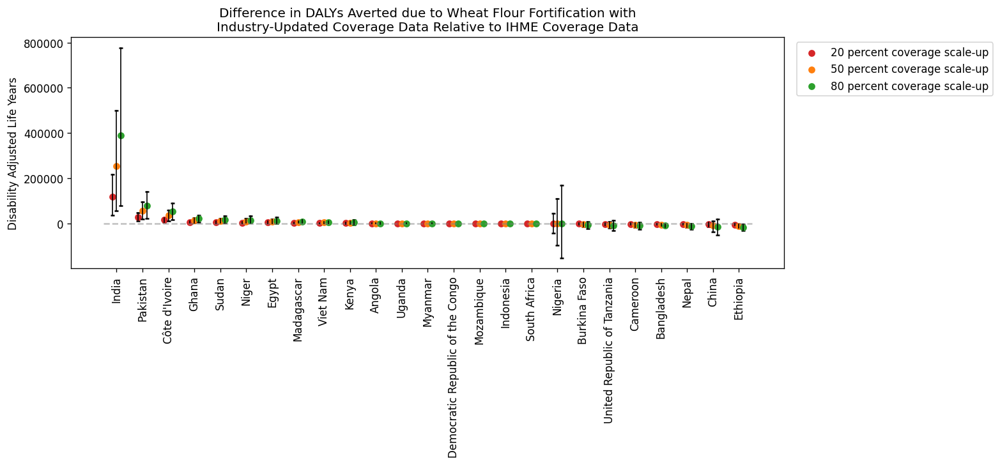

In [28]:
wheat_comparison_plots('counts_averted', 
                     'Difference in DALYs Averted due to Wheat Flour Fortification with\nIndustry-Updated Coverage Data Relative to IHME Coverage Data',
                    'Disability Adjusted Life Years',
                    'wheat_difference_dalys')

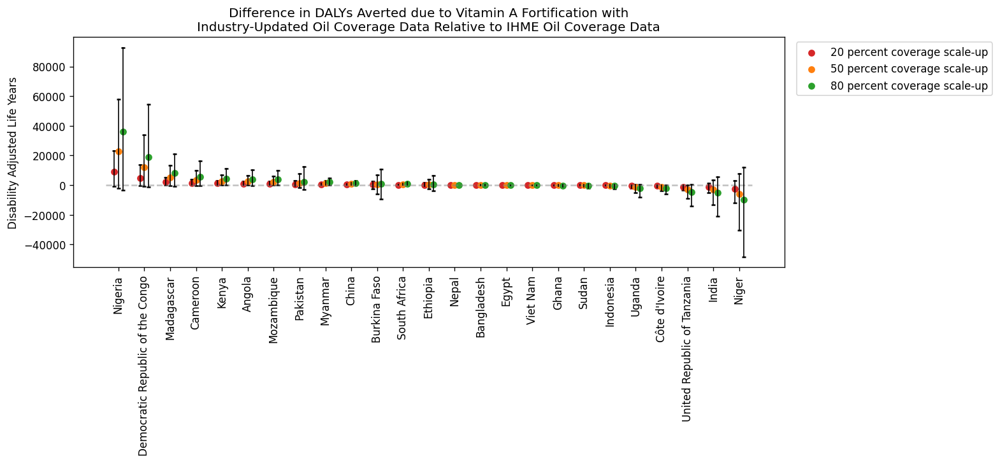

In [29]:
oil_comparison_plots('counts_averted', 
                     'Difference in DALYs Averted due to Vitamin A Fortification with\nIndustry-Updated Oil Coverage Data Relative to IHME Oil Coverage Data',
                    'Disability Adjusted Life Years',
                    'oil_difference_dalys')

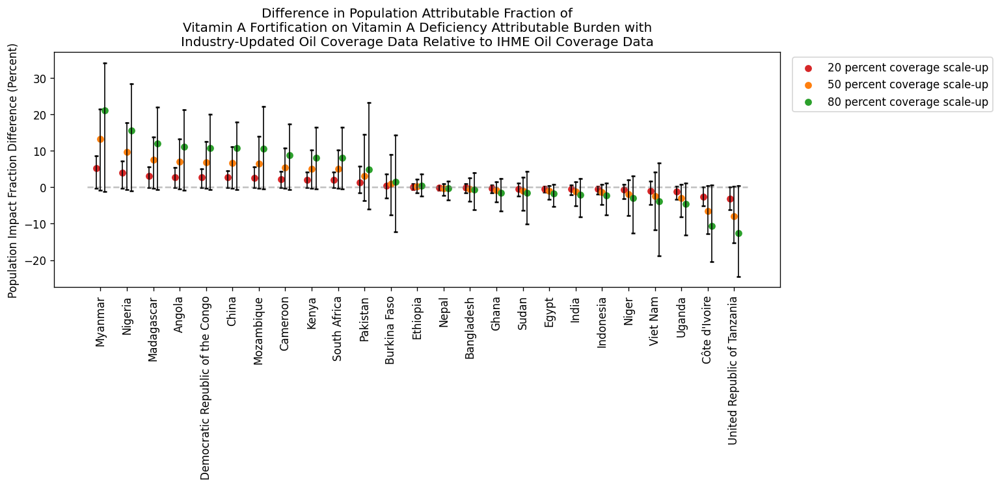

In [30]:
oil_comparison_plots('pif', 
                     'Difference in Population Attributable Fraction of\nVitamin A Fortification on Vitamin A Deficiency Attributable Burden with\nIndustry-Updated Oil Coverage Data Relative to IHME Oil Coverage Data',
                    'Population Impact Fraction Difference (Percent)',
                    'oil_difference_pifs')

# Stacked bars for all locations

In [31]:
def make_dot_plots_by_nutrient_vehicle_pair(data, nutrient, measure, coverage_levels, confidence_data):
    """This function takes a dataframe,
    nutrient (as a string),
    and measure (as a string, either: 'rates', 'counts', or 'pifs').
    """

    f, ax = plt.subplots(figsize=(12, 4), dpi=120)
    colors = ['tab:red', 'tab:orange', 'tab:green']

    location_spacer = 0.15
    coverage_spacer = 0.025
    df = (data.drop(columns='measure', errors='ignore')
          .apply(pd.DataFrame.describe, percentiles=[0.025, 0.975], axis=1).reset_index())

    order = df.reset_index()
    order = list(
        order.loc[order.coverage_level == 0.8].loc[order.year == 2025].sort_values(by='mean').location_id.values)
    nums = list(range(0, len(order)))
    orders = pd.DataFrame()
    orders['location_id'] = order
    orders['order'] = nums
    df = df.merge(orders, on='location_id').sort_values(by='order', ascending=False)

    for n in list(range(0, len(coverage_levels))):
        rate = (df.loc[df.year == 2025]
            .loc[df.coverage_level == coverage_levels[n]])
        for i in list(range(0, len(rate))):
            plt.plot([location_spacer * i + coverage_spacer * n, location_spacer * i + coverage_spacer * n],
                     [rate['2.5%'].values[i], rate['97.5%'].values[i]], c='black', linewidth=1)
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['2.5%'].values[i], s=10, marker='_',
                        c='black')
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['97.5%'].values[i], s=10, marker='_',
                        c='black')

        x_vals = []
        for x in list(range(0, len(rate))):
            x_vals.append(location_spacer * x + coverage_spacer * n)
        plt.scatter(x_vals, rate['mean'], s=30,
                    label=f'{int(coverage_levels[n] * 100)} percent coverage scale-up', color=colors[n])

    plt.hlines(0, 0 - coverage_spacer * 2,
               location_spacer * (len(rate)) - coverage_spacer * 2,
               linestyle='dashed', color='grey', alpha=0.5)

    plt.plot()

    if measure == 'rates_averted':
        plt.title(f'DALYs averted per 100,000 person-years due to\n{nutrient} fortication in {vehicle}\n')
        plt.ylabel('DALYs Averted per 100,000')
    elif measure == 'counts_averted':
        plt.title(f'DALYs averted due to {nutrient} fortication in {vehicle}\n')
        plt.ylabel('DALYs')
    elif measure == 'pif':
        plt.title(f'Population impact fraction of {nutrient} fortication in {vehicle}\non DALYs as a proportion of {nutrient} deficiency attributable DALYs\n')
        plt.ylabel('Population Impact Fraction (Percent)')

    plt.legend(bbox_to_anchor=[1.3, 1])
    
    #rate = rate.merge(confidence_data.replace('vitamin a','vitamin A'), on=['location_name','nutrient','vehicle'])
    #rate['label'] = (np.where(rate.score == 5, '***** ',
    #                  np.where(rate.score == 4, '**** ',
    #                           np.where(rate.score == 3, '*** ',
    #                                    np.where(rate.score == 2, '** ',
    #                                             np.where(rate.score == 1, '* ', '')))))
    #               + rate.location_name)


    x_ticks = []
    for x in list(range(0, len(rate))):
        x_ticks.append(location_spacer * x + coverage_spacer)
    ax.set_xticks(x_ticks)
    plt.suptitle('Assuming 0% folic acid fortified salt at baseline and 70% fortifiable salt for all locations', y=0.925, fontsize='medium')
    plt.xticks(rotation=90)
    ax.set_xticklabels(rate.location_name.values)
    #plt.savefig(f'results_plots/folic_acid_in_salt_{measure}.png', bbox_inches='tight')

Text(22.25, 200000, 'w = wheat flour\nm = maize flour\no = oil')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


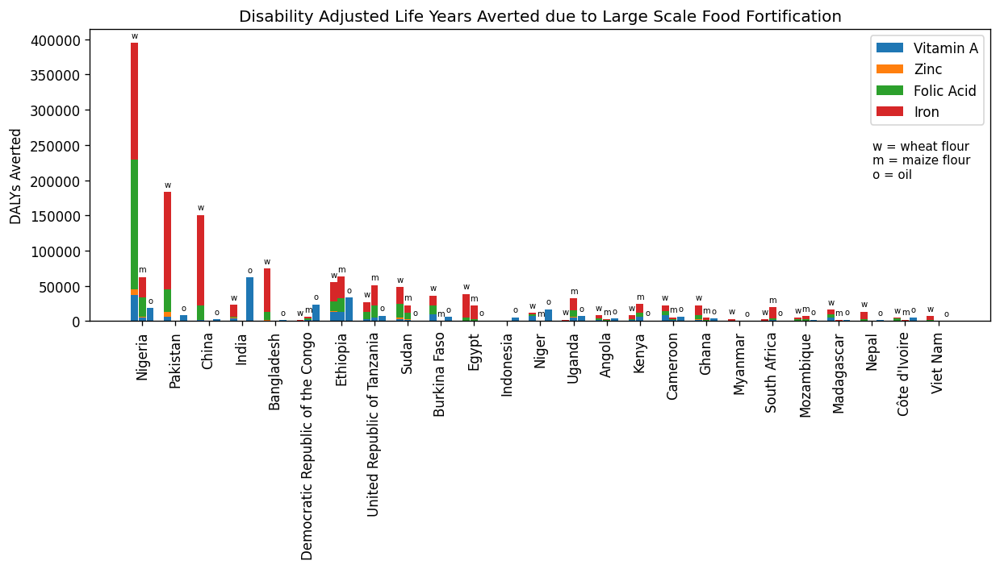

In [32]:
f, ax = plt.subplots(figsize=(12, 4), dpi=120)

l = get_ids('location')
l = l[l['location_id'].isin(location_ids)]

plot = (results.loc[results.coverage_level==0.8]
        .loc[results.measure == 'counts_averted']
        .loc[results.vehicle.isin(['wheat flour','maize flour','oil','industry oil','salt'])]
        .set_index([c for c in results.columns if 'draw' not in c])
        .mean(axis=1)
        .reset_index()
        #.drop(columns='index')
        .rename(columns={0:'mean'}))

order = plot.groupby([c for c in plot.columns if c not in ['nutrient','nutrient_name','label','mean']]).sum().reset_index()
order = order.groupby(['location_id','location_name'])['mean'].max().reset_index().sort_values(by='mean', ascending=False)
order['order'] = list(range(0,25))
order = order.drop(columns='mean')

plot = plot.merge(order, on=['location_name','location_id']).sort_values(by='order')

oil = plot.loc[plot.vehicle=='oil']
oil = order.merge(oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')

maize = plot.loc[plot.vehicle=='maize flour']
maize_vitamin_a = maize.loc[maize.nutrient=='vitamin A']
maize_vitamin_a = order.merge(maize_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_zinc = maize.loc[maize.nutrient=='zinc']
maize_zinc = order.merge(maize_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_folic_acid = maize.loc[maize.nutrient=='folic acid']
maize_folic_acid = order.merge(maize_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_iron = maize.loc[maize.nutrient=='iron']
maize_iron = order.merge(maize_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')

wheat = plot.loc[plot.vehicle=='wheat flour']
wheat_vitamin_a = wheat.loc[wheat.nutrient=='vitamin A']
wheat_vitamin_a = order.merge(wheat_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_zinc = wheat.loc[wheat.nutrient=='zinc']
wheat_zinc = order.merge(wheat_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_folic_acid = wheat.loc[wheat.nutrient=='folic acid']
wheat_folic_acid = order.merge(wheat_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_iron = wheat.loc[wheat.nutrient=='iron']
wheat_iron = order.merge(wheat_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')


barWidth = 0.215
spacerWidth = barWidth / 10
a = np.arange(25)
b = [x + barWidth + spacerWidth for x in a]
c = [x + barWidth + spacerWidth for x in b]

p_oil_vita = plt.bar(c, oil['mean'], 
        width=barWidth,  color='tab:blue')
plt.bar(c, oil['mean'], 
        width=barWidth, 
        label='Vitamin A', color='tab:blue')

wheat_sum = plt.bar(a, wheat_iron['mean'] + wheat_folic_acid['mean'] + wheat_zinc['mean'] + wheat_vitamin_a['mean'], 
        width=barWidth)
plt.bar(a, wheat_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(a, wheat_zinc['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'],
       label='Zinc', color='tab:orange')
plt.bar(a, wheat_folic_acid['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values,
       label='Folic Acid', color='tab:green')
plt.bar(a, wheat_iron['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values + wheat_folic_acid['mean'].values,
       label='Iron', color='tab:red')

maize_sum = plt.bar(b, maize_iron['mean'] + maize_folic_acid['mean'] + maize_zinc['mean'] + maize_vitamin_a['mean'], 
        width=barWidth)
plt.bar(b, maize_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(b, maize_zinc['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'], color='tab:orange')
plt.bar(b, maize_folic_acid['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values,
        color='tab:green')
plt.bar(b, maize_iron['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values + maize_folic_acid['mean'].values,
        color='tab:red')

for rect in wheat_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'w', ha='center', va='bottom',# rotation=90,
             fontsize=6)
for rect in maize_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'm', ha='center', va='bottom',# rotation=90,
             fontsize=6)
for rect in p_oil_vita:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'o', ha='center', va='bottom',# rotation=90,
             fontsize=6)

plt.legend(loc='upper right')
plt.xticks(b, oil.location_name.values, rotation=90)
plt.ylabel('DALYs Averted')
plt.title('Disability Adjusted Life Years Averted due to Large Scale Food Fortification')

plt.text(22.25, 200_000, 
             'w = wheat flour\nm = maize flour\no = oil', ha='left', va='bottom',# rotation=90,
             fontsize=9)
#plt.show()
#plt.savefig('results_plots/stacked_plot_count_space.png', dpi=120, bbox_inches='tight')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

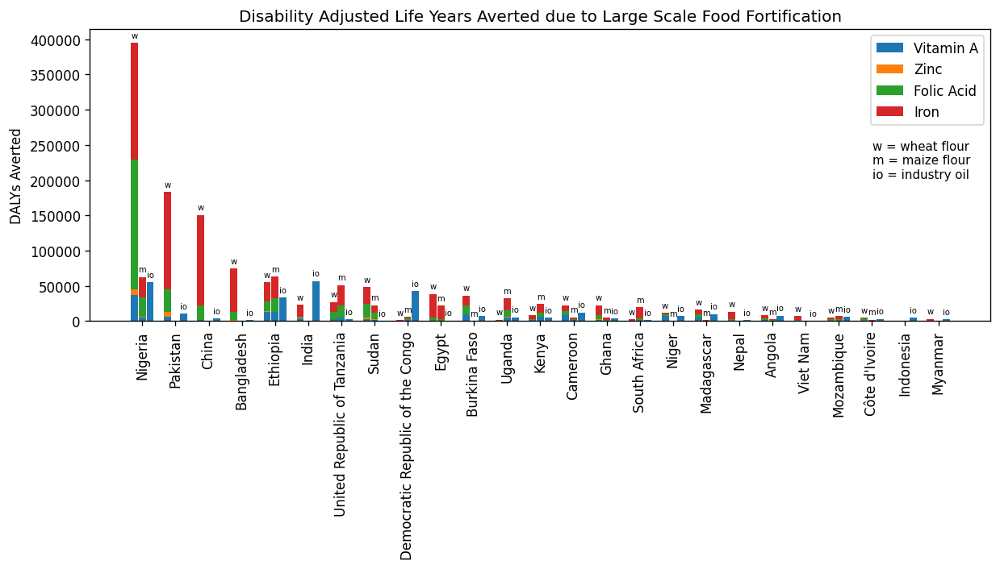

In [33]:
f, ax = plt.subplots(figsize=(12, 4), dpi=120)

l = get_ids('location')
l = l[l['location_id'].isin(location_ids)]

plot = (results.loc[results.coverage_level==0.8]
        .loc[results.measure == 'counts_averted']
        .loc[results.vehicle.isin(['wheat flour','maize flour','oil','industry oil'])]
        .set_index([c for c in results.columns if 'draw' not in c])
        .mean(axis=1)
        .reset_index()
        #.drop(columns='index')
        .rename(columns={0:'mean'}))

order = plot.groupby([c for c in plot.columns if c not in ['nutrient','nutrient_name','label','mean']]).sum().reset_index()
order = order.groupby(['location_id','location_name'])['mean'].max().reset_index().sort_values(by='mean', ascending=False)
order['order'] = list(range(0,25))
order = order.drop(columns='mean')

plot = plot.merge(order, on=['location_name','location_id']).sort_values(by='order')

oil = plot.loc[plot.vehicle=='industry oil']
oil = order.merge(oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')

maize = plot.loc[plot.vehicle=='maize flour']
maize_vitamin_a = maize.loc[maize.nutrient=='vitamin A']
maize_vitamin_a = order.merge(maize_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_zinc = maize.loc[maize.nutrient=='zinc']
maize_zinc = order.merge(maize_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_folic_acid = maize.loc[maize.nutrient=='folic acid']
maize_folic_acid = order.merge(maize_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_iron = maize.loc[maize.nutrient=='iron']
maize_iron = order.merge(maize_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')

wheat = plot.loc[plot.vehicle=='wheat flour']
wheat_vitamin_a = wheat.loc[wheat.nutrient=='vitamin A']
wheat_vitamin_a = order.merge(wheat_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_zinc = wheat.loc[wheat.nutrient=='zinc']
wheat_zinc = order.merge(wheat_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_folic_acid = wheat.loc[wheat.nutrient=='folic acid']
wheat_folic_acid = order.merge(wheat_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_iron = wheat.loc[wheat.nutrient=='iron']
wheat_iron = order.merge(wheat_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')


barWidth = 0.215
spacerWidth = barWidth / 10
a = np.arange(25)
b = [x + barWidth + spacerWidth for x in a]
c = [x + barWidth + spacerWidth for x in b]

p_oil_vita = plt.bar(c, oil['mean'], 
        width=barWidth,  color='tab:blue')
plt.bar(c, oil['mean'], 
        width=barWidth, 
        label='Vitamin A', color='tab:blue')

wheat_sum = plt.bar(a, wheat_iron['mean'] + wheat_folic_acid['mean'] + wheat_zinc['mean'] + wheat_vitamin_a['mean'], 
        width=barWidth)
plt.bar(a, wheat_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(a, wheat_zinc['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'],
       label='Zinc', color='tab:orange')
plt.bar(a, wheat_folic_acid['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values,
       label='Folic Acid', color='tab:green')
plt.bar(a, wheat_iron['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values + wheat_folic_acid['mean'].values,
       label='Iron', color='tab:red')

maize_sum = plt.bar(b, maize_iron['mean'] + maize_folic_acid['mean'] + maize_zinc['mean'] + maize_vitamin_a['mean'], 
        width=barWidth)
plt.bar(b, maize_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(b, maize_zinc['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'], color='tab:orange')
plt.bar(b, maize_folic_acid['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values,
        color='tab:green')
plt.bar(b, maize_iron['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values + maize_folic_acid['mean'].values,
        color='tab:red')

for rect in wheat_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'w', ha='center', va='bottom',# rotation=90,
             fontsize=6)
for rect in maize_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'm', ha='center', va='bottom',# rotation=90,
             fontsize=6)
for rect in p_oil_vita:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'io', ha='center', va='bottom',# rotation=90,
             fontsize=6)

plt.legend(loc='upper right')
plt.xticks(b, oil.location_name.values, rotation=90)
plt.ylabel('DALYs Averted')
plt.title('Disability Adjusted Life Years Averted due to Large Scale Food Fortification')

plt.text(22.25, 200_000, 
             'w = wheat flour\nm = maize flour\nio = industry oil', ha='left', va='bottom',# rotation=90,
             fontsize=9)
#plt.show()
plt.savefig('results_plots/stacked_plot_count_space_industry_oil.png', dpi=120, bbox_inches='tight')

([<matplotlib.axis.YTick at 0x2af4cbd4f0b8>,
 [Text(0, 50000, '50,000'),
  Text(0, 100000, '100,000'),
  Text(0, 150000, '150,000'),
  Text(0, 200000, '200,000'),
  Text(0, 250000, '250,000'),
  Text(0, 300000, '300,000'),
  Text(0, 350000, '350,000'),
  Text(0, 400000, '400,000')])

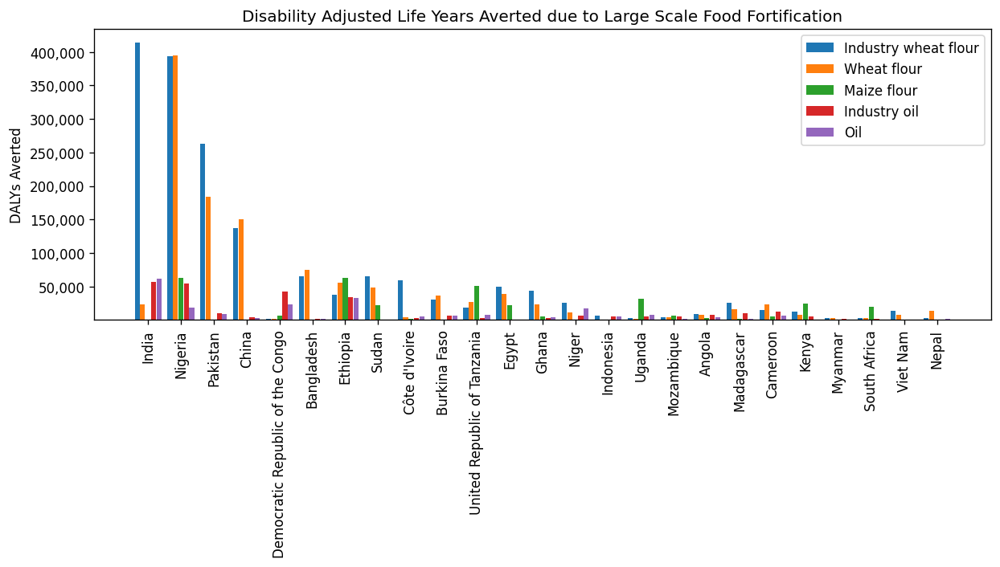

In [34]:
f, ax = plt.subplots(figsize=(12, 4), dpi=120)

l = get_ids('location')
l = l[l['location_id'].isin(location_ids)]

plot = (results.loc[results.coverage_level==0.8]
        .loc[results.measure == 'counts_averted']
        .groupby([c for c in results.columns if 'draw' not in c and c not in ['nutrient','nutrient_name','label']]).sum()
        .filter([c for c in results.columns if 'draw' in c])
        .apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1)
        .reset_index())

order = plot.groupby(['location_id','location_name'])['mean'].max().reset_index().sort_values(by='mean', ascending=False)
order['order'] = list(range(0,25))
order = order.drop(columns='mean')

plot = plot.merge(order, on=['location_name','location_id']).sort_values(by='order')

industry_oil = plot.loc[plot.vehicle=='industry oil']
industry_oil = order.merge(industry_oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')

oil = plot.loc[plot.vehicle=='oil']
oil = order.merge(oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')

maize = plot.loc[plot.vehicle=='maize flour']
maize = order.merge(maize, on=['location_id','location_name','order'], how='left').sort_values(by='order')

wheat = plot.loc[plot.vehicle=='wheat flour']
wheat = order.merge(wheat, on=['location_id','location_name','order'], how='left').sort_values(by='order')

industry_wheat = plot.loc[plot.vehicle=='industry wheat']
industry_wheat = order.merge(industry_wheat, on=['location_id','location_name','order'], how='left').sort_values(by='order')


barWidth = 0.15
spacerWidth = barWidth / 10
a1 = np.arange(25)
a = [x + barWidth + spacerWidth for x in a1]
b = [x + barWidth + spacerWidth for x in a]
c = [x + barWidth + spacerWidth for x in b]
d = [x + barWidth + spacerWidth for x in c]

plt.bar(a1, industry_wheat['mean'], 
        width=barWidth, 
        label='Industry wheat flour')#, color='tab:blue')

plt.bar(a, wheat['mean'], 
        width=barWidth, 
        label='Wheat flour')#, color='tab:blue')
plt.bar(b, maize['mean'], 
        width=barWidth, 
        label='Maize flour')#, color='tab:blue')
plt.bar(c, industry_oil['mean'], 
        width=barWidth, 
        label='Industry oil')#, color='tab:blue')
plt.bar(d, oil['mean'], 
        width=barWidth, 
        label='Oil')#, color='tab:blue')

plt.legend(loc='upper right')
plt.xticks(b, oil.location_name.values, rotation=90)
plt.ylabel('DALYs Averted')
plt.title('Disability Adjusted Life Years Averted due to Large Scale Food Fortification')
plt.yticks([50_000, 100_000, 150_000, 200_000, 250_000, 300_000, 350_000, 400_000], 
           ['50,000','100,000','150,000','200,000','250,000','300,000','350,000','400,000'])
#plt.show()
#plt.savefig('results_plots/stacked_plot_count_space_industry_oil.png', dpi=120, bbox_inches='tight')

([<matplotlib.axis.YTick at 0x2af4ebc46e80>,
 [Text(0, 10000, '10,000'),
  Text(0, 20000, '20,000'),
  Text(0, 30000, '30,000'),
  Text(0, 40000, '40,000'),
  Text(0, 50000, '50,000'),
  Text(0, 60000, '60,000'),
  Text(0, 70000, '70,000')])

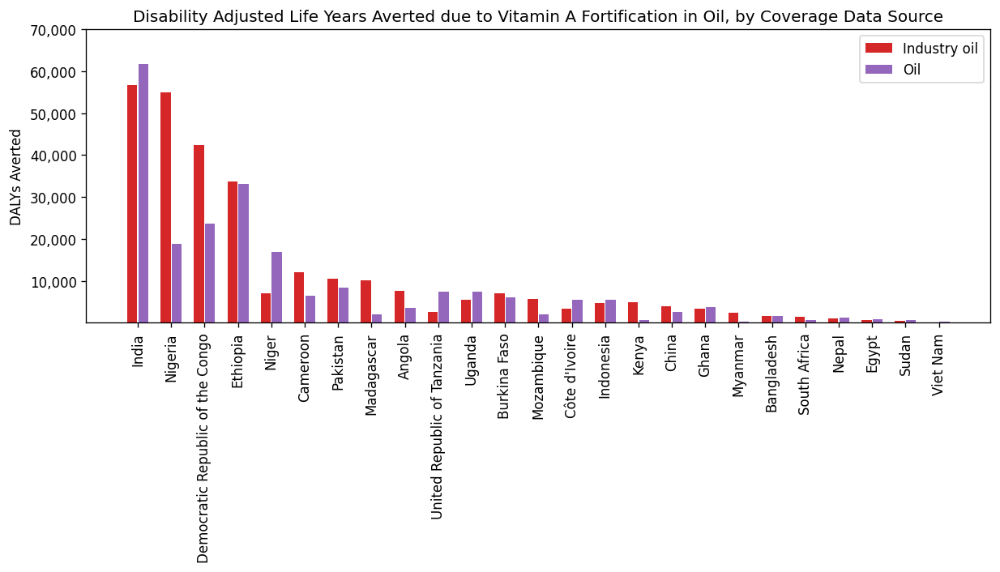

In [35]:
f, ax = plt.subplots(figsize=(12, 4), dpi=120)

l = get_ids('location')
l = l[l['location_id'].isin(location_ids)]

plot = (results.loc[results.coverage_level==0.8]
        .loc[results.measure == 'counts_averted']
        .loc[results.vehicle.isin(['industry oil','oil'])]
        .groupby([c for c in results.columns if 'draw' not in c and c not in ['nutrient','nutrient_name','label']]).sum()
        .filter([c for c in results.columns if 'draw' in c])
        .apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1)
        .reset_index())

order = plot.groupby(['location_id','location_name'])['mean'].max().reset_index().sort_values(by='mean', ascending=False)
order['order'] = list(range(0,25))
order = order.drop(columns='mean')

plot = plot.merge(order, on=['location_name','location_id']).sort_values(by='order')

industry_oil = plot.loc[plot.vehicle=='industry oil']
industry_oil = order.merge(industry_oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')

oil = plot.loc[plot.vehicle=='oil']
oil = order.merge(oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')


barWidth = 0.3
spacerWidth = barWidth / 10
a = np.arange(25)
b = [x + barWidth + spacerWidth for x in a]
#c = [x + barWidth + spacerWidth for x in b]
#d = [x + barWidth + spacerWidth for x in c]


plt.bar(a, industry_oil['mean'], 
        width=barWidth, 
        label='Industry oil', color='tab:red')
plt.bar(b, oil['mean'], 
        width=barWidth, 
        label='Oil', color='tab:purple')

plt.legend(loc='upper right')
plt.xticks(a + (barWidth + spacerWidth) / 2, oil.location_name.values, rotation=90)
plt.ylabel('DALYs Averted')
plt.title('Disability Adjusted Life Years Averted due to Vitamin A Fortification in Oil, by Coverage Data Source')
plt.yticks([10_000, 20_000, 30_000, 40_000, 50_000, 60_000, 70_000], 
           ['10,000','20,000','30,000','40,000','50,000','60,000','70,000'])
#plt.show()
#plt.savefig('results_plots/stacked_plot_count_space_industry_oil.png', dpi=120, bbox_inches='tight')

([<matplotlib.axis.YTick at 0x2af4ebe87c50>,
 [Text(0, 100000, '100,000'),
  Text(0, 200000, '200,000'),
  Text(0, 300000, '300,000'),
  Text(0, 400000, '400,000')])

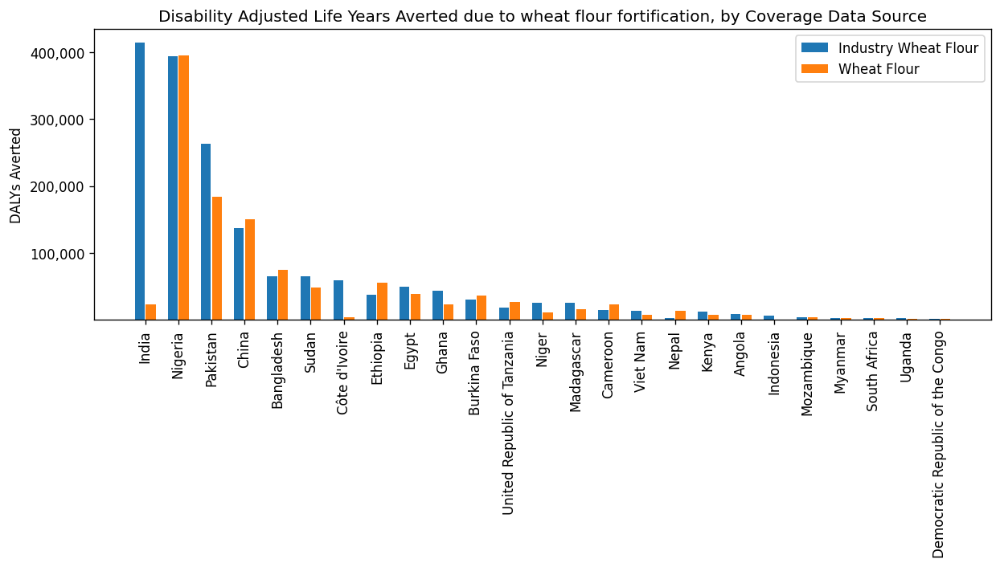

In [36]:
f, ax = plt.subplots(figsize=(12, 4), dpi=120)

l = get_ids('location')
l = l[l['location_id'].isin(location_ids)]

plot = (results.loc[results.coverage_level==0.8]
        .loc[results.measure == 'counts_averted']
        .loc[results.vehicle.isin(['industry wheat','wheat flour'])]
        .groupby([c for c in results.columns if 'draw' not in c and c not in ['nutrient','nutrient_name','label']]).sum()
        .filter([c for c in results.columns if 'draw' in c])
        .apply(pd.DataFrame.describe, percentiles=[0.025,0.975], axis=1)
        .reset_index())

order = plot.groupby(['location_id','location_name'])['mean'].max().reset_index().sort_values(by='mean', ascending=False)
order['order'] = list(range(0,25))
order = order.drop(columns='mean')

plot = plot.merge(order, on=['location_name','location_id']).sort_values(by='order')

industry_wheat = plot.loc[plot.vehicle=='industry wheat']
industry_wheat = order.merge(industry_wheat, on=['location_id','location_name','order'], how='left').sort_values(by='order')

wheat = plot.loc[plot.vehicle=='wheat flour']
wheat = order.merge(wheat, on=['location_id','location_name','order'], how='left').sort_values(by='order')


barWidth = 0.3
spacerWidth = barWidth / 10
a = np.arange(25)
b = [x + barWidth + spacerWidth for x in a]
#c = [x + barWidth + spacerWidth for x in b]
#d = [x + barWidth + spacerWidth for x in c]


plt.bar(a, industry_wheat['mean'], 
        width=barWidth, 
        label='Industry Wheat Flour', color='tab:blue')
plt.bar(b, wheat['mean'], 
        width=barWidth, 
        label='Wheat Flour', color='tab:orange')

plt.legend(loc='upper right')
plt.xticks(a + (barWidth + spacerWidth) / 2, wheat.location_name.values, rotation=90)
plt.ylabel('DALYs Averted')
plt.title('Disability Adjusted Life Years Averted due to wheat flour fortification, by Coverage Data Source')
plt.yticks([100_000, 200_000, 300_000, 400_000], 
           ['100,000','200,000','300,000','400,000'])
#plt.show()
#plt.savefig('results_plots/stacked_plot_count_space_industry_wheat.png', dpi=120, bbox_inches='tight')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

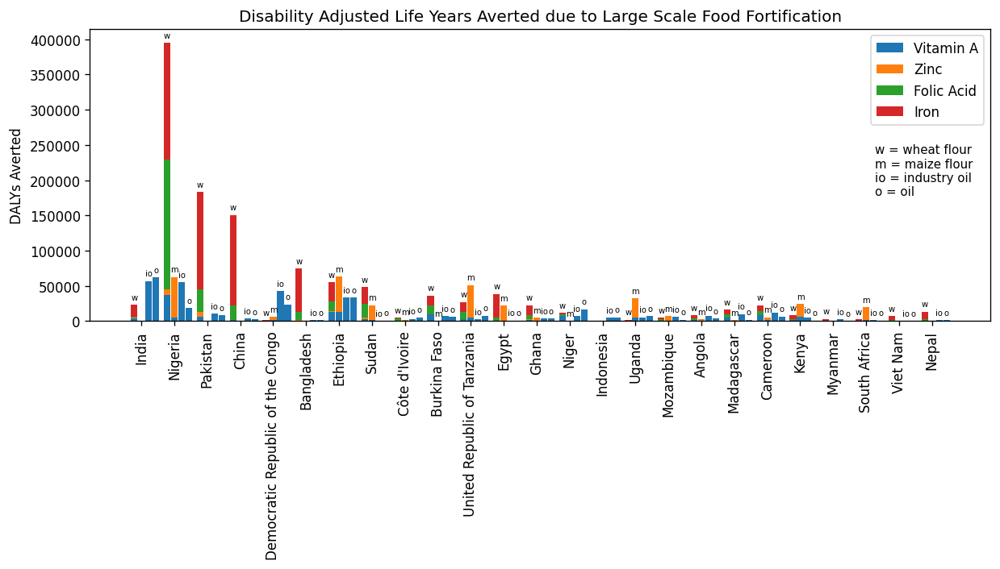

In [37]:
f, ax = plt.subplots(figsize=(12, 4), dpi=120)

l = get_ids('location')
l = l[l['location_id'].isin(location_ids)]

plot = (results.loc[results.coverage_level==0.8]
        .loc[results.measure == 'counts_averted']
        .set_index([c for c in results.columns if 'draw' not in c])
        .mean(axis=1)
        .reset_index()
        .rename(columns={0:'mean'}))

order = plot.groupby([c for c in plot.columns if c not in ['nutrient','nutrient_name','label','mean']]).sum().reset_index()
order = order.groupby(['location_id','location_name'])['mean'].max().reset_index().sort_values(by='mean', ascending=False)
order['order'] = list(range(0,25))
order = order.drop(columns='mean')

plot = plot.merge(order, on=['location_name','location_id']).sort_values(by='order')


oil = plot.loc[plot.vehicle=='oil']
oil = order.merge(oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')
industry_oil = plot.loc[plot.vehicle=='industry oil']
industry_oil = order.merge(industry_oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')

maize = plot.loc[plot.vehicle=='maize flour']
maize_vitamin_a = maize.loc[maize.nutrient=='vitamin A']
maize_vitamin_a = order.merge(maize_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_zinc = maize.loc[maize.nutrient=='zinc']
maize_zinc = order.merge(maize_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_folic_acid = maize.loc[maize.nutrient=='folic acid']
maize_folic_acid = order.merge(maize_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_iron = maize.loc[maize.nutrient=='iron']
maize_iron = order.merge(maize_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')

wheat = plot.loc[plot.vehicle=='wheat flour']
wheat_vitamin_a = wheat.loc[wheat.nutrient=='vitamin A']
wheat_vitamin_a = order.merge(wheat_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_zinc = wheat.loc[wheat.nutrient=='zinc']
wheat_zinc = order.merge(wheat_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_folic_acid = wheat.loc[wheat.nutrient=='folic acid']
wheat_folic_acid = order.merge(wheat_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_iron = wheat.loc[wheat.nutrient=='iron']
wheat_iron = order.merge(wheat_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')


barWidth = 0.2
spacerWidth = barWidth / 10
a = np.arange(25)
b = [x + barWidth + spacerWidth for x in a]
c = [x + barWidth + spacerWidth for x in b]
d = [x + barWidth + spacerWidth for x in c]

p_industry_oil_vita = plt.bar(c, industry_oil['mean'], 
        width=barWidth,  color='tab:blue')
plt.bar(c, industry_oil['mean'], 
        width=barWidth, 
        label='Vitamin A', color='tab:blue')

p_oil_vita = plt.bar(d, oil['mean'], 
        width=barWidth,  color='tab:blue')
plt.bar(d, oil['mean'], 
        width=barWidth, color='tab:blue')

wheat_sum = plt.bar(a, wheat_iron['mean'] + wheat_folic_acid['mean'] + wheat_zinc['mean'] + wheat_vitamin_a['mean'], 
        width=barWidth)
plt.bar(a, wheat_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(a, wheat_zinc['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'],
       label='Zinc', color='tab:orange')
plt.bar(a, wheat_folic_acid['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values,
       label='Folic Acid', color='tab:green')
plt.bar(a, wheat_iron['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values + wheat_folic_acid['mean'].values,
       label='Iron', color='tab:red')

maize_sum = plt.bar(b, maize_iron['mean'] + maize_folic_acid['mean'] + maize_zinc['mean'] + maize_vitamin_a['mean'], 
        width=barWidth)
plt.bar(b, maize_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(b, maize_zinc['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'], color='tab:orange')
plt.bar(b, maize_folic_acid['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values,
        color='tab:green')
plt.bar(b, maize_iron['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values + maize_folic_acid['mean'].values,
        color='tab:red')

for rect in wheat_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'w', ha='center', va='bottom', #rotation=90,
             fontsize=6)
for rect in maize_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'm', ha='center', va='bottom', #rotation=90,
             fontsize=6)
for rect in p_industry_oil_vita:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'io', ha='center', va='bottom',# rotation=90,
             fontsize=6)
for rect in p_oil_vita:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+5_000, 
             'o', ha='center', va='bottom', #rotation=90,
             fontsize=6)

plt.legend(loc='upper right')
plt.xticks(b, oil.location_name.values, rotation=90)
plt.ylabel('DALYs Averted')
plt.title('Disability Adjusted Life Years Averted due to Large Scale Food Fortification')

plt.text(22.5, 175_000, 
             'w = wheat flour\nm = maize flour\nio = industry oil\no = oil', ha='left', va='bottom',# rotation=90,
             fontsize=9)
#plt.show()
plt.savefig('results_plots/stacked_plot_count_space_industry_oil_and_oil.png', dpi=120, bbox_inches='tight')

Text(0.5, 1.0, 'Disability Adjusted Life Years per 100,000 Person-Years Averted due to Large Scale Food Fortification')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


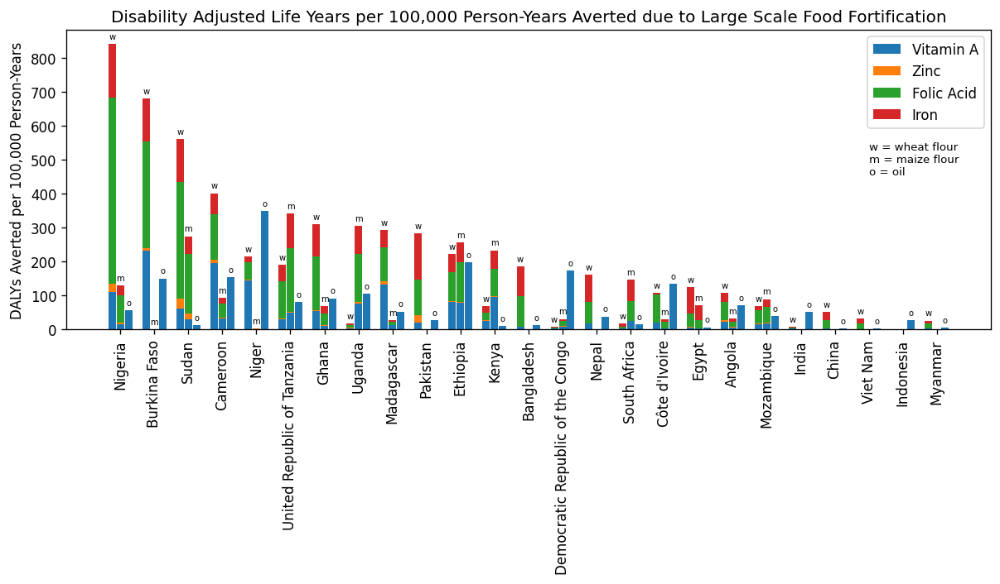

In [38]:
f, ax = plt.subplots(figsize=(12, 4), dpi=120)

l = get_ids('location')
l = l[l['location_id'].isin(location_ids)]

plot = (results.loc[results.coverage_level==0.8]
        .loc[results.measure == 'rates_averted']
        .loc[results.vehicle.isin(['wheat flour','maize flour','oil'])]
        .set_index([c for c in results.columns if 'draw' not in c])
        .mean(axis=1)
        .reset_index()
        .rename(columns={0:'mean'}))

order = plot.groupby([c for c in plot.columns if c not in ['nutrient','nutrient_name','label','mean']]).sum().reset_index()
order = order.groupby(['location_id','location_name'])['mean'].max().reset_index().sort_values(by='mean', ascending=False)
order['order'] = list(range(0,25))
order = order.drop(columns='mean')

plot = plot.merge(order, on=['location_name','location_id']).sort_values(by='order')

oil = plot.loc[plot.vehicle=='oil']
oil = order.merge(oil, on=['location_id','location_name','order'], how='left').sort_values(by='order')

maize = plot.loc[plot.vehicle=='maize flour']
maize_vitamin_a = maize.loc[maize.nutrient=='vitamin A']
maize_vitamin_a = order.merge(maize_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_zinc = maize.loc[maize.nutrient=='zinc']
maize_zinc = order.merge(maize_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_folic_acid = maize.loc[maize.nutrient=='folic acid']
maize_folic_acid = order.merge(maize_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
maize_iron = maize.loc[maize.nutrient=='iron']
maize_iron = order.merge(maize_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')

wheat = plot.loc[plot.vehicle=='wheat flour']
wheat_vitamin_a = wheat.loc[wheat.nutrient=='vitamin A']
wheat_vitamin_a = order.merge(wheat_vitamin_a, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_zinc = wheat.loc[wheat.nutrient=='zinc']
wheat_zinc = order.merge(wheat_zinc, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_folic_acid = wheat.loc[wheat.nutrient=='folic acid']
wheat_folic_acid = order.merge(wheat_folic_acid, on=['location_id','location_name','order'], how='left').sort_values(by='order')
wheat_iron = wheat.loc[wheat.nutrient=='iron']
wheat_iron = order.merge(wheat_iron, on=['location_id','location_name','order'], how='left').sort_values(by='order')


barWidth = 0.22
spacerWidth = barWidth / 10
a = np.arange(25)
b = [x + barWidth + spacerWidth for x in a]
c = [x + barWidth + spacerWidth for x in b]

p_oil_vita = plt.bar(c, oil['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(c, oil['mean'], 
        width=barWidth, 
        label='Vitamin A', color='tab:blue')

wheat_sum = plt.bar(a, wheat_iron['mean'] + wheat_folic_acid['mean'] + wheat_zinc['mean'] + wheat_vitamin_a['mean'], 
        width=barWidth)
plt.bar(a, wheat_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(a, wheat_zinc['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'],
       label='Zinc', color='tab:orange')
plt.bar(a, wheat_folic_acid['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values,
       label='Folic Acid', color='tab:green')
plt.bar(a, wheat_iron['mean'], 
        width=barWidth,
        bottom=wheat_vitamin_a['mean'].values + wheat_zinc['mean'].values + wheat_folic_acid['mean'].values,
       label='Iron', color='tab:red')



maize_sum = plt.bar(b, maize_iron['mean'] + maize_folic_acid['mean'] + maize_zinc['mean'] + maize_vitamin_a['mean'], 
        width=barWidth)
plt.bar(b, maize_vitamin_a['mean'], 
        width=barWidth, color='tab:blue')
plt.bar(b, maize_zinc['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'], color='tab:orange')
plt.bar(b, maize_folic_acid['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values,
        color='tab:green')
plt.bar(b, maize_iron['mean'], 
        width=barWidth,
        bottom=maize_vitamin_a['mean'].values + maize_zinc['mean'].values + maize_folic_acid['mean'].values,
        color='tab:red')


for rect in maize_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+10, 
             'm', ha='center', va='bottom',# rotation=90,
             fontsize=6)
for rect in wheat_sum:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+10, 
             'w', ha='center', va='bottom',# rotation=90,
             fontsize=6)
for rect in p_oil_vita:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height+10, 
             'o', ha='center', va='bottom',# rotation=90,
             fontsize=6)
    
plt.text(22.25, 450, 
             'w = wheat flour\nm = maize flour\no = oil', ha='left', va='bottom',# rotation=90,
             fontsize=8)

plt.legend(loc='upper right')
plt.xticks(b, oil.location_name.values, rotation=90)
plt.ylabel('DALYs Averted per 100,000 Person-Years')
plt.title('Disability Adjusted Life Years per 100,000 Person-Years Averted due to Large Scale Food Fortification')

In [39]:
def make_dot_plots_by_nutrient_vehicle_pair(data, nutrient, measure, coverage_levels):
    """This function takes a dataframe,
    nutrient (as a string),
    and measure (as a string, either: 'rates', 'counts', or 'pifs').
    """

    f, ax = plt.subplots(figsize=(12, 4), dpi=120)
    colors = ['tab:red', 'tab:orange', 'tab:green']

    location_spacer = 0.15
    coverage_spacer = 0.025
    df = (data.drop(columns='measure', errors='ignore')
          .apply(pd.DataFrame.describe, percentiles=[0.025, 0.975], axis=1).reset_index())

    order = df.reset_index()
    order = list(
        order.loc[order.coverage_level == 0.8].loc[order.year == 2025].sort_values(by='mean').location_id.values)
    nums = list(range(0, len(order)))
    orders = pd.DataFrame()
    orders['location_id'] = order
    orders['order'] = nums
    df = df.merge(orders, on='location_id').sort_values(by='order', ascending=False)

    for n in list(range(0, len(coverage_levels))):
        rate = (df.loc[df.year == 2025]
            .loc[df.coverage_level == coverage_levels[n]])
        for i in list(range(0, len(rate))):
            plt.plot([location_spacer * i + coverage_spacer * n, location_spacer * i + coverage_spacer * n],
                     [rate['2.5%'].values[i], rate['97.5%'].values[i]], c='black', linewidth=1)
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['2.5%'].values[i], s=10, marker='_',
                        c='black')
            plt.scatter([location_spacer * i + coverage_spacer * n], rate['97.5%'].values[i], s=10, marker='_',
                        c='black')

        x_vals = []
        for x in list(range(0, len(rate))):
            x_vals.append(location_spacer * x + coverage_spacer * n)
        plt.scatter(x_vals, rate['mean'], s=30,
                    label=f'{int(coverage_levels[n] * 100)} percent coverage scale-up', color=colors[n])

    plt.hlines(0, 0 - coverage_spacer * 2,
               location_spacer * (len(rate)) - coverage_spacer * 2,
               linestyle='dashed', color='grey', alpha=0.5)

    plt.plot()

    if measure == 'rates_averted':
        plt.title(f'DALYs averted per 100,000 person-years due to\n{nutrient} fortication in {vehicle}\n')
        plt.ylabel('DALYs Averted per 100,000')
    elif measure == 'counts_averted':
        plt.title(f'DALYs averted due to {nutrient} fortication in {vehicle}\n')
        plt.ylabel('DALYs')
    elif measure == 'pif':
        plt.title(f'Population impact fraction of {nutrient} fortication in {vehicle}\non DALYs as a proportion of {nutrient} deficiency attributable DALYs\n')
        plt.ylabel('Population Impact Fraction (Percent)')

    plt.legend(bbox_to_anchor=[1.3, 1])
    
    #rate = rate.merge(confidence_data.replace('vitamin a','vitamin A'), on=['location_name','nutrient','vehicle'])
    #rate['label'] = (np.where(rate.score == 5, '***** ',
    #                  np.where(rate.score == 4, '**** ',
    #                           np.where(rate.score == 3, '*** ',
    #                                    np.where(rate.score == 2, '** ',
    #                                             np.where(rate.score == 1, '* ', '')))))
    #               + rate.location_name)


    x_ticks = []
    for x in list(range(0, len(rate))):
        x_ticks.append(location_spacer * x + coverage_spacer)
    ax.set_xticks(x_ticks)
    #plt.suptitle('Assuming 0% folic acid fortified salt at baseline and 70% fortifiable salt for all locations', y=0.925, fontsize='medium')
    plt.xticks(rotation=90)
    ax.set_xticklabels(rate.location_name.values)

/ihme/code/central_comp/miniconda_svc-ccomp/envs/v109/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


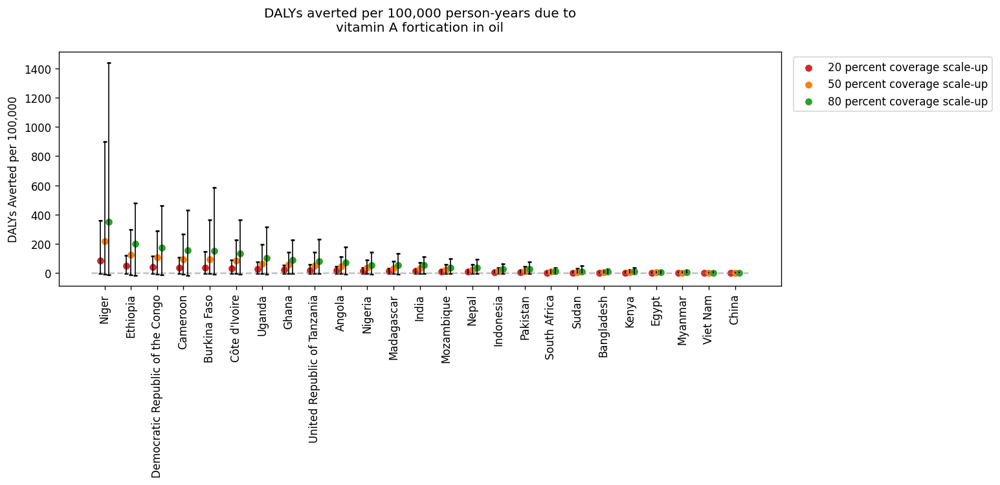

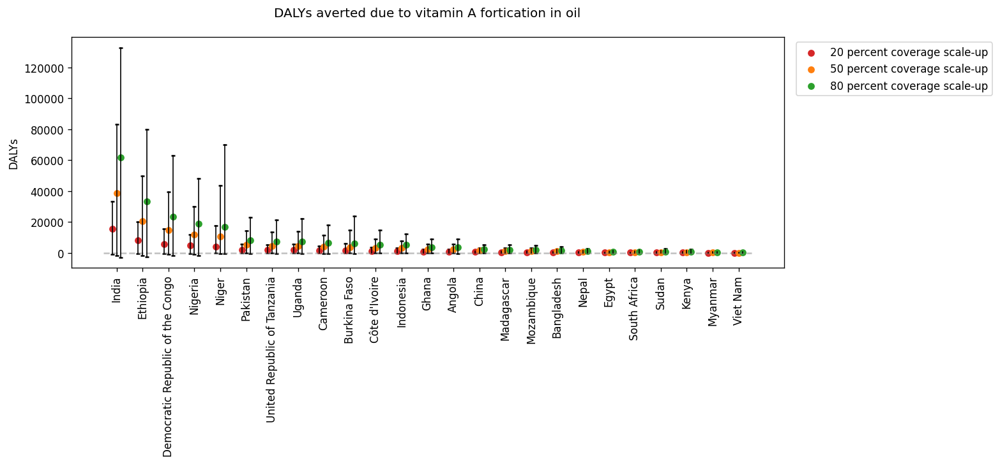

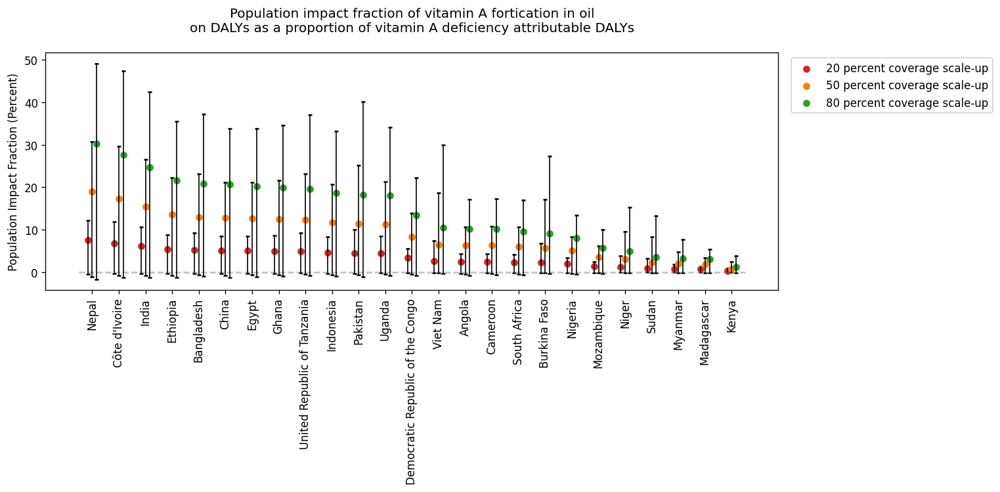

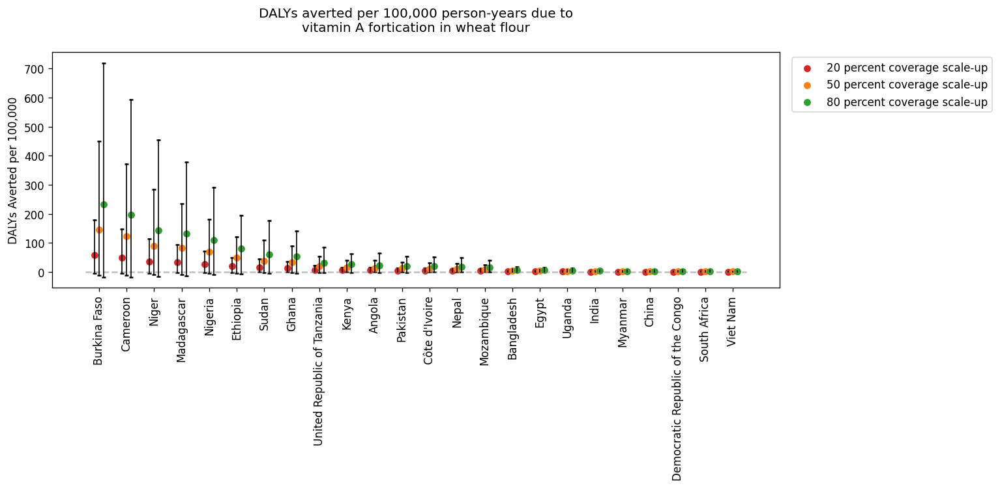

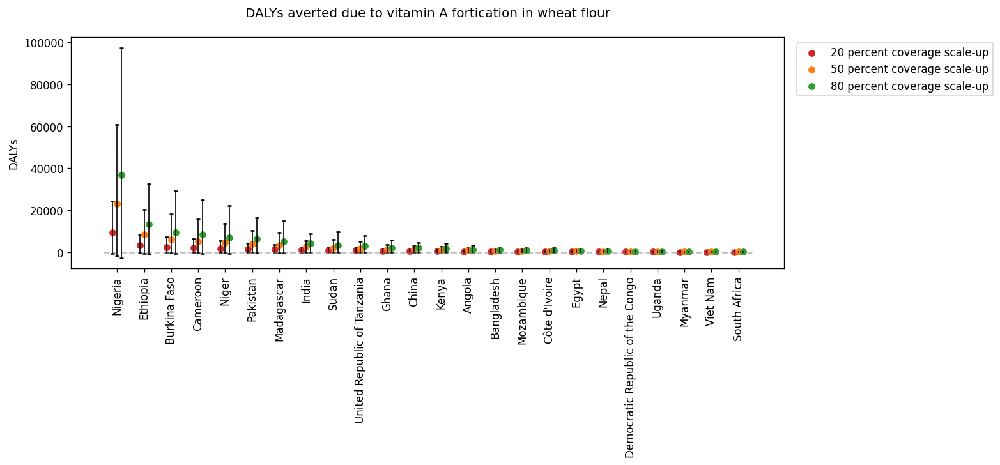

...

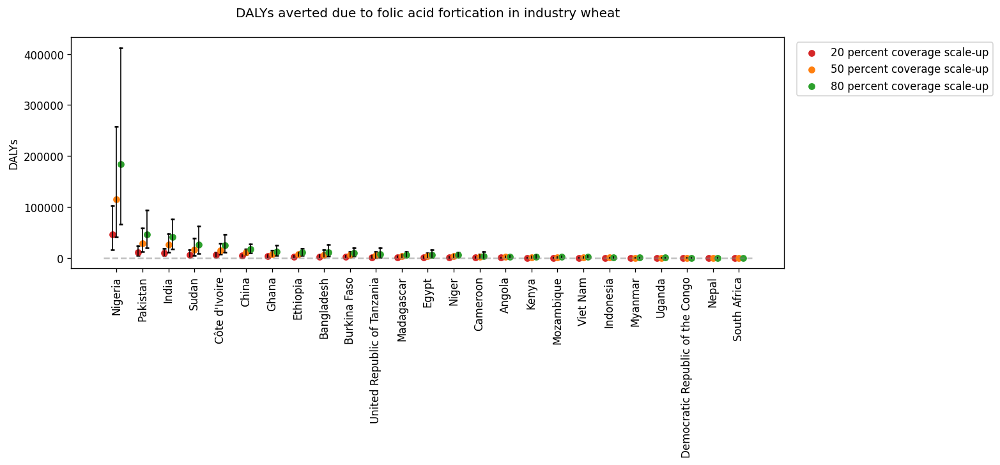

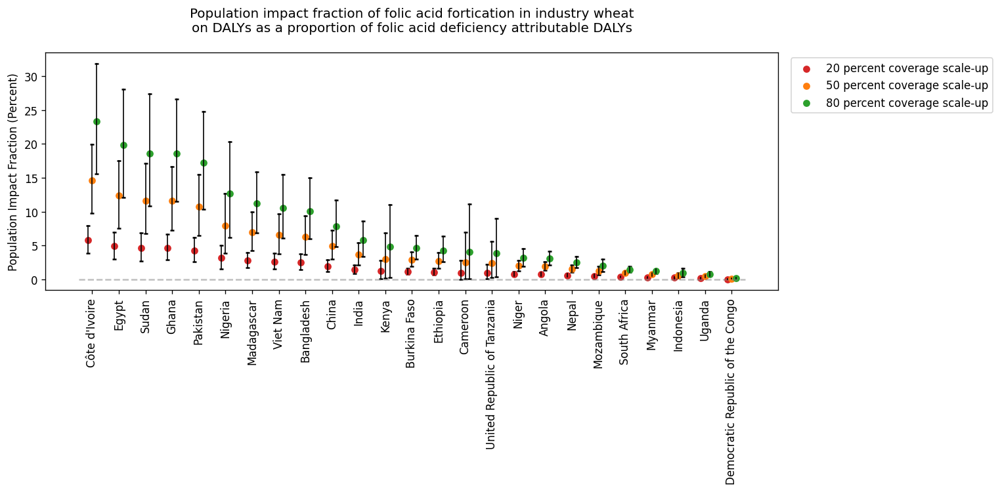

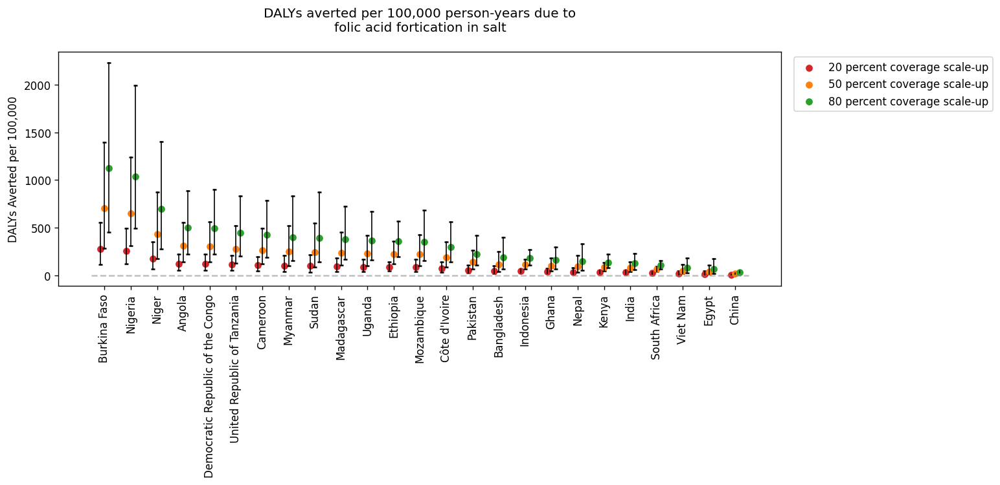

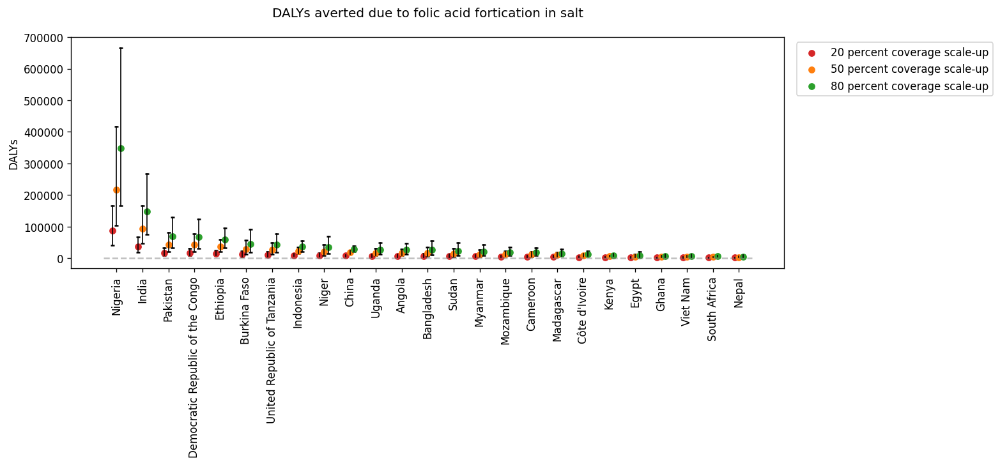

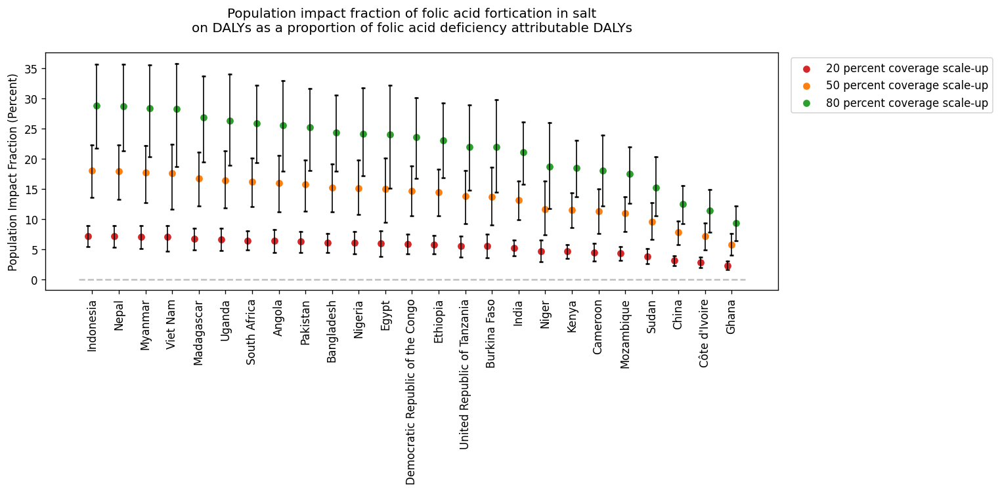

In [40]:
nutrients = ['vitamin A','zinc','iron','folic acid']
measures = ['rates_averted','counts_averted','pif']
coverage_levels = [0.2,0.5,0.8]

with PdfPages('results_plots/impact_by_nutrient_vehicle_pair.pdf') as pdf:
    for nutrient in nutrients:
        if nutrient == 'vitamin A':
            vehicles = ['oil','wheat flour','maize flour','industry oil','industry wheat']
        elif nutrient == 'folic acid':
            vehicles = ['wheat flour','maize flour','industry wheat','salt']
        else:
            vehicles = ['wheat flour', 'maize flour','industry wheat']
        for vehicle in vehicles:
            for measure in measures:
                plot = (results.loc[results.nutrient == nutrient]
                        .loc[results.vehicle == vehicle]
                        .loc[results.measure == measure]
                        .loc[results.year == 2025]
                        .set_index([c for c in results.columns if 'draw' not in c]))
                make_dot_plots_by_nutrient_vehicle_pair(plot,
                              nutrient,
                              measure,
                              coverage_levels)
                pdf.savefig(bbox_inches='tight')

In [41]:
coverage_levels = [0.2,0.5,0.8]

def make_location_specific_plots(data, location_id, measure, coverage_levels):
    vehicles = ['zero maize flour',
 'maize flour',
 'zero industry wheat',
 'industry wheat',
 'zero wheat flour',
 'wheat flour',
 'zero industry salt',
 'industry salt',
 'zero salt',
 'salt',
 'oil',
 'industry oil',
 'zero oil',
 'zero industry oil']
    data_loc = (data
                .loc[data.location_id==location_id]
                .loc[data.year==2025]
                .loc[data.vehicle.isin([v for v in vehicles if 'zero' not in v and v != 'industry salt'])]
                .loc[data.measure == measure]
                .sort_values(by=['nutrient','vehicle']))
    
    f, ax = plt.subplots(figsize=(7, 4), dpi=120)
    colors = ['tab:red', 'tab:orange', 'tab:green']
    nutrient_spacer = 0.15
    coverage_spacer = 0.025
    data_loc = (data_loc.set_index([c for c in data_loc.columns if 'draw' not in c])
                .apply(pd.DataFrame.describe, percentiles=[0.025, 0.975], axis=1).reset_index())
    
    for n in list(range(0, len(coverage_levels))):
        df = (data_loc.loc[data_loc.coverage_level == coverage_levels[n]])
        for i in list(range(0, len(df))):
            plt.plot([nutrient_spacer * i + coverage_spacer * n, nutrient_spacer * i + coverage_spacer * n],
                     [df['2.5%'].values[i], df['97.5%'].values[i]], c='black', linewidth=1)
            plt.scatter([nutrient_spacer * i + coverage_spacer * n], df['2.5%'].values[i], s=10, marker='_',
                        c='black')
            plt.scatter([nutrient_spacer * i + coverage_spacer * n], df['97.5%'].values[i], s=10, marker='_',
                        c='black')
            
        x_vals = []
        for x in list(range(0, len(df))):
            x_vals.append(nutrient_spacer * x + coverage_spacer * n)
        plt.scatter(x_vals, df['mean'], s=30,
                    label=f'{int(coverage_levels[n] * 100)} percent coverage', color=colors[n])

    plt.hlines(0, 0 - coverage_spacer * 2,
               nutrient_spacer * (len(df)) - coverage_spacer * 2,
               linestyle='dashed', color='grey', alpha=0.5)
    
    plt.plot()
    
    l_name = data_loc.location_name.values[0]

    if measure == 'rates_averted':
        plt.title(f'{l_name}\nDALYs Averted per 100,000 Person-Years by Nutrient-Vehicle Pair')
        plt.ylabel('DALYs Averted per 100,000')
    elif measure == 'counts_averted':
        plt.title(f'{l_name}\nDALYs Averted by Nutrient-Vehicle Pair')
        plt.ylabel('DALYs')
    elif measure == 'pif':
        plt.title(f'{l_name}\nPopulation Impact Fractions by Nutrient-Vehicle Pair\nDALYs Averted as a Fraction of DALYs Attributable to Respective Nutrient Deficiencies')
        plt.ylabel('Population Impact Fraction (Percent)')

    plt.legend(bbox_to_anchor=[1.5, 1])
    
    x_ticks = []
    for x in list(range(0, len(df))):
        x_ticks.append(nutrient_spacer * x + coverage_spacer)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(df.reset_index().label.values)
    plt.xticks(rotation=90)
    plt.savefig(f'results_plots/ethiopia_{measure}_by_nutrient_with_folic_acid_in_salt.png', bbox_inches='tight')

# Results plots by location

In [ ]:
make_location_specific_plots(results, 214, 'counts_averted', coverage_levels)

In [ ]:
with PdfPages('results_plots/impact_by_location.pdf') as pdf:
    for location_id in results.location_id.unique():
        for measure in ['pif','counts_averted','rates_averted']:
            make_location_specific_plots(results, location_id, measure, coverage_levels)
            pdf.savefig(bbox_inches='tight')

# Coverage

In [18]:
coverage_u5 = pd.read_pickle('results_raw/coverage_u5.pkl')
coverage_u5 = coverage_u5.loc[coverage_u5.nutrient!='folic acid']
coverage_u5['vehicle'] = np.where(coverage_u5.nutrient=='iron', coverage_u5.vehicle + ', U5', coverage_u5.vehicle)
coverage_wra = pd.read_pickle('results_raw/coverage_wra.pkl')
coverage_wra['vehicle'] = np.where(coverage_wra.nutrient=='iron', coverage_wra.vehicle + ', WRA', coverage_wra.vehicle)
coverage = pd.concat([coverage_u5, coverage_wra], ignore_index=True)
coverage['label'] = coverage.vehicle.str.capitalize() + ' (' + coverage.nutrient + ')'
l=get_ids('location')
coverage = coverage.merge(l.filter(['location_id','location_name']), on='location_id')
coverage = coverage.sort_values(by='label')
coverage.head()

,coverage_level,location_id,year,nutrient,vehicle,mean,2.5%,97.5%,label,location_name
1668,0.5,163,2022.0,vitamin a,industry oil,0.540933,0.443928,0.630278,Industry oil (vitamin a),India
7793,baseline,214,2023.0,vitamin a,industry oil,0.074627,0.059889,0.089059,Industry oil (vitamin a),Nigeria
7792,baseline,214,2022.0,vitamin a,industry oil,0.074627,0.059889,0.089059,Industry oil (vitamin a),Nigeria
7791,baseline,214,2021.0,vitamin a,industry oil,0.074627,0.059889,0.089059,Industry oil (vitamin a),Nigeria
1678,0.8,163,2025.0,vitamin a,industry oil,0.720429,0.592355,0.836262,Industry oil (vitamin a),India


In [19]:
def make_coverage_bar_charts(data, location_id):
    plt.figure(figsize=(15, 4), dpi=120)
    
    data = (data.loc[data.location_id==location_id]
           .loc[data.year.isin([2025,np.nan])])
    data['mean'] = data['mean'] * 100
    data['2.5%'] = data['2.5%'] * 100
    data['97.5%'] = data['97.5%'] * 100
    base = data.loc[data.coverage_level=='baseline']
    alt_20 = data.loc[data.coverage_level==0.2]
    alt_50 = data.loc[data.coverage_level==0.5]
    alt_80 = data.loc[data.coverage_level==0.8]
    barWidth = 0.20
    a = np.arange(len(base))
    b = [x + barWidth for x in a]
    c = [x + barWidth for x in b]
    d = [x + barWidth for x in c]
    plt.bar(a, base['mean'], width=barWidth, yerr = [base['mean'] - base['2.5%'],base['97.5%'] - base['mean']], 
            label='Baseline Coverage')
    plt.bar(b, alt_20['mean'], width=barWidth, yerr = [alt_20['mean'] - alt_20['2.5%'],alt_20['97.5%'] - alt_20['mean']], 
            color='tab:red', label='20% Coverage')
    plt.bar(c, alt_50['mean'], width=barWidth, yerr = [alt_50['mean'] - alt_50['2.5%'],alt_50['97.5%'] - alt_50['mean']], 
            color='tab:orange', label='50% Coverage')
    plt.bar(d, alt_80['mean'], width=barWidth, yerr = [alt_80['mean'] - alt_80['2.5%'],alt_80['97.5%'] - alt_80['mean']], 
            color='tab:green', label='80% Coverage')

    df = data.loc[data.coverage_level=='maximum']
    for i in list(range(0,len(df.label.unique()))):
        if i == 0:
            plt.hlines(df.loc[df.label==df.label.unique()[i]]['mean'], -0.1 + i, 0.7 + i, 
                   linestyle='dashed', color='black', label='Eating industrially produced vehicle')
        else: 
            plt.hlines(df.loc[df.label==df.label.unique()[i]]['mean'], -0.1 + i, 0.7 + i, 
                   linestyle='dashed', color='black')
        plt.fill_between([-0.1 + i, 0.7 + i], [df.loc[df.label==df.label.unique()[i]]['2.5%'].values[0]] * 2,
                        [df.loc[df.label==df.label.unique()[i]]['97.5%'].values[0]] * 2,
                        alpha=0.2, color='black')

    plt.legend(bbox_to_anchor=[1.3,1])
    plt.title(f'{data.location_name.unique()[0]} fortification coverage')
    plt.ylabel('Percent of population')
    plt.xticks([r + barWidth * 1.5 for r in range(len(base))], base.label.values, rotation=90)

/ihme/code/central_comp/miniconda_svc-ccomp/envs/v109/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


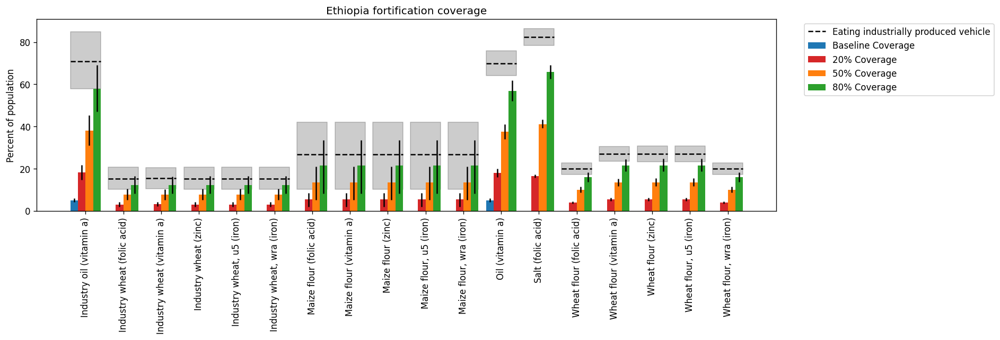

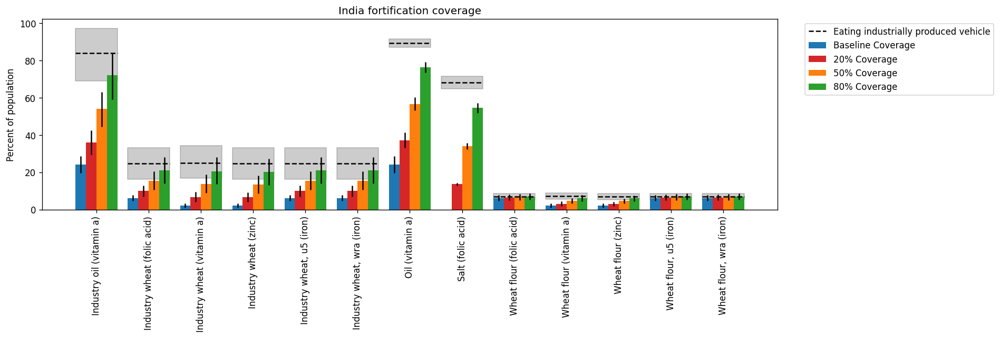

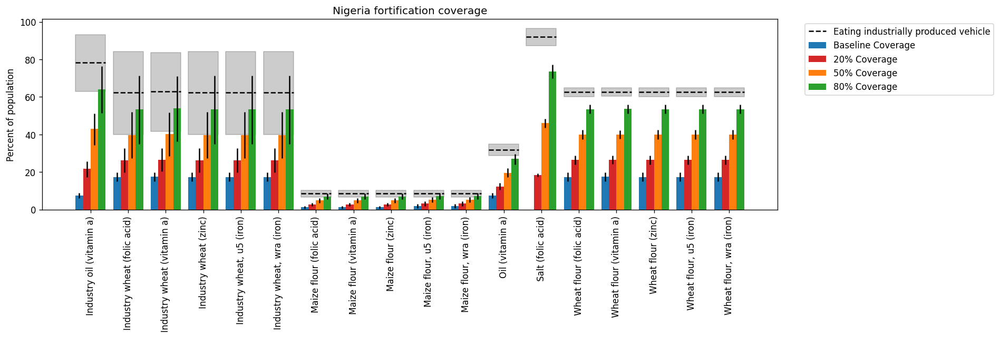

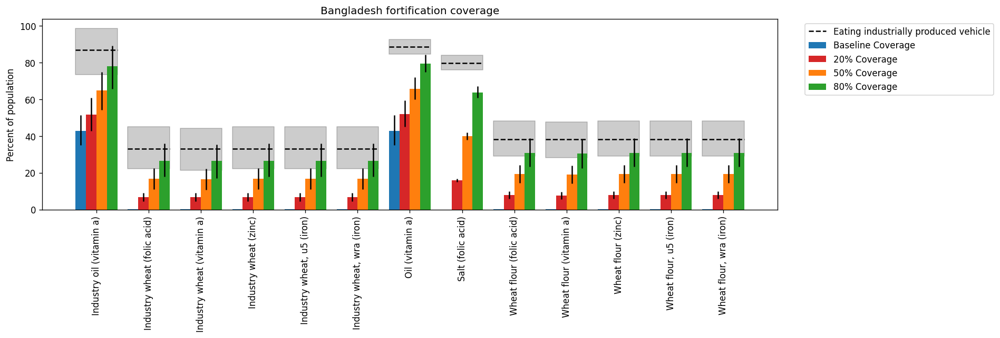

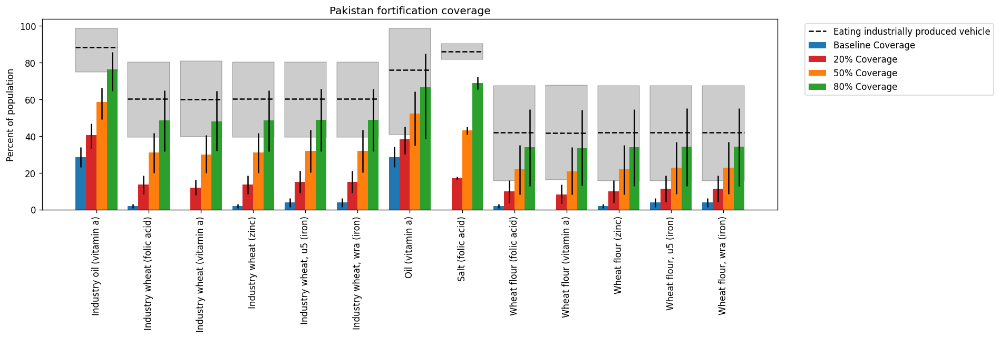

...

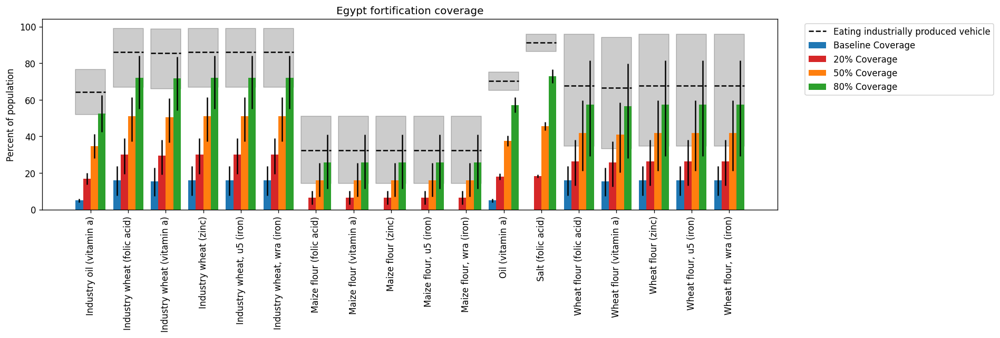

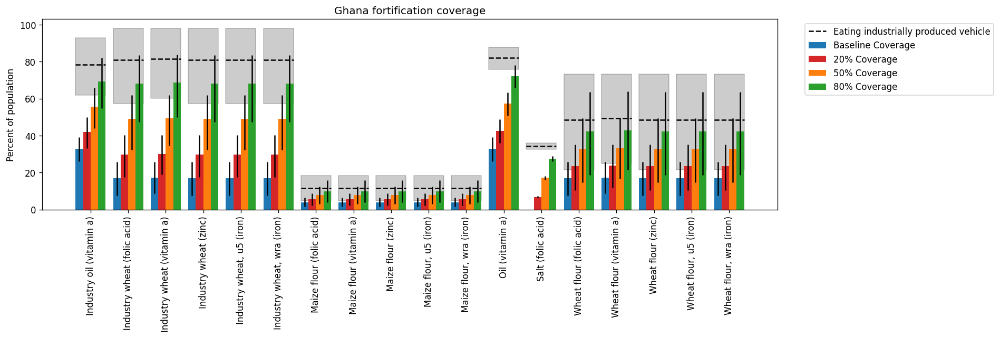

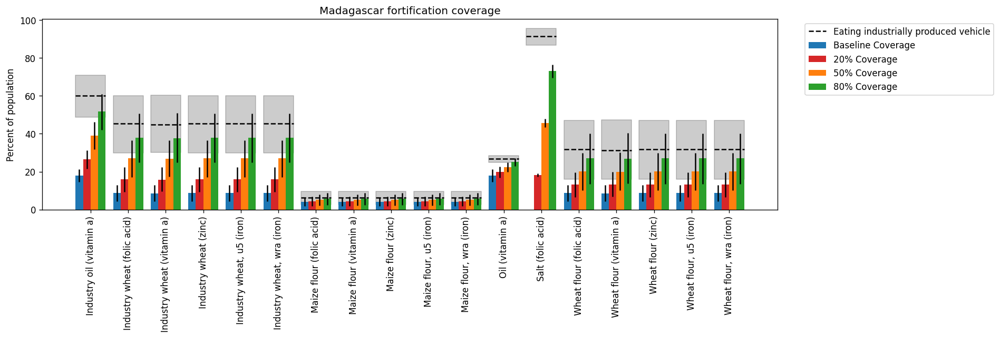

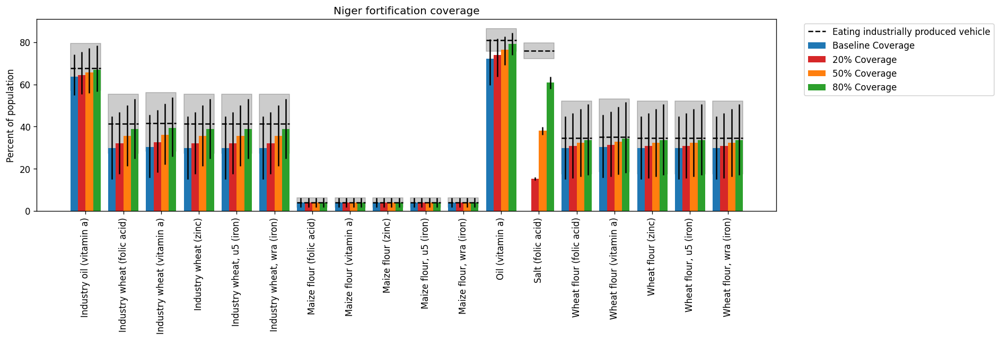

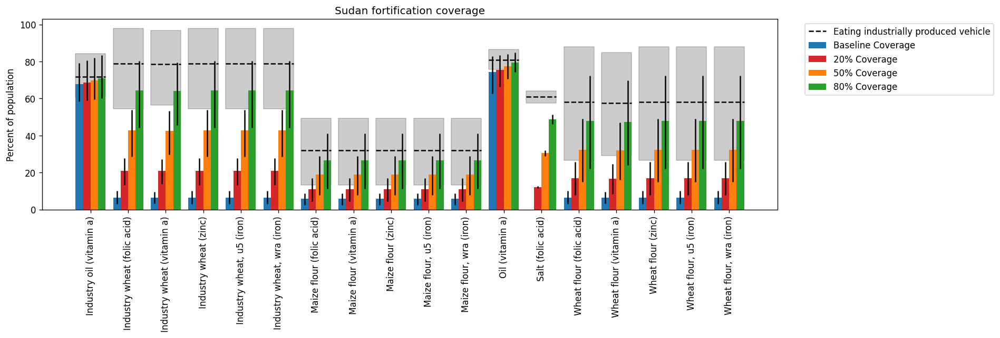

In [20]:
with PdfPages('results_plots/coverage_by_location.pdf') as pdf:
    for location_id in location_ids:
        make_coverage_bar_charts(coverage, location_id)
        pdf.savefig(bbox_inches='tight')